## DELE CA1 PART A : CONVOLUTIONAL NEURAL NETWORK

Name : Dario Prawara Teh Wei Rong  |  Class : DAAA / FT / 2B / 04  |  Admission Number : 2201858

Objective : Implement an <b>image classifier using a convolutional neural network</b> to classify images of 15 types of vegetables, such as Bean, Bitter Gourd, Bottle Gourd, Brinjal and more.<br>Build two types of neural networks, one for each input size.

Background Information : A dataset of images 224 by 224 pixels (px) is given, containing 15 types of images. Images should be converted to grayscale, using only <b>31 by 31 pixels</b> or <b>128 by 128 pixels</b>.

### BACKGROUND RESEARCH ON VEGETABLE IMAGE CLASSIFICATION

1. https://ieeexplore.ieee.org/document/9465499#:~:text=In%20this%20paper%2C%20an%20attempt,IEEE%20Xplore
2. https://link.springer.com/article/10.1007/s40747-020-00192-x#:~:text=Image%20recognition%20supports%20several%20applications%2C,based%20densely%20connected%20convolutional

- Current research in vegetable image classification leverages large, diverse datasets and advanced deep learning techniques to achieve robust and accurate classification. 
<br>

- Studies have employed hybrid deep learning frameworks, custom-designed convolutional neural networks (CNNs), and Vision Models like GoogLeNet and improved YOLOv4 are highlighted for their ideal performance in classifying fruits and vegetables, including detailed categorizations such as fresh or rotten. 
<br>

- The classification systems developed are crucial for applications across the fresh supply chain, supermarkets, and other related fields, indicating the practical implications of these technological advancements and this field has been rapidly growing in recent years. 
<br>

- Now, there seems to be a focus on not only accuracy but also on computational efficiency, with models designed to be resource-effective while maintaining high performance. Transfer learning and advanced architectures are pivotal in enhancing the capabilities of these systems.

### INITIALIZING MODULES AND LIBRARIES

- Import necessary libraries for pre-processing, data exploration, feature engineering and model evaluation.

- Some libraries used include tensorflow, numpy, pandas, matplotlib, seaborn, sklearn and keras.

In [153]:
# Import the necessary modules and libraries

# TensorFlow for deep learning framework
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Visualization and Processing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random
from PIL import Image
import os
import cv2 as cv
import copy
from imblearn.over_sampling import RandomOverSampler

# Scikit-learn's classification_report for evaluating classification models
from sklearn.metrics import classification_report

# Keras Libraries
from keras.regularizers import l1, l2, l1_l2
from keras.layers import (AveragePooling2D, ZeroPadding2D, BatchNormalization, Activation, MaxPool2D, Add, ReLU)
from keras.utils import to_categorical
from keras.metrics import Precision, Recall, CategoricalAccuracy
from keras.models import Sequential, Model, load_model
from keras.layers import Dropout, Flatten, Conv2D, MaxPooling2D, Normalization, Dense, GlobalAveragePooling2D
from keras import Input
from keras.optimizers import *
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers.schedules import CosineDecay
import keras_tuner as kt

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

### PERFORM CHECK FOR GPU
- Ensure GPU can be found when using tf.config and list_physical_devices.
- Avoid OOM errors by setting GPU memory consumption growth.

In [2]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
# Show the GPU
gpu

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')

### SETTING RANDOM SEED FOR REPRODUCTIBILITY

- To ensure reproductibility of results, we will be setting random seed to ensure results are reproducible.

In [3]:
tf.random.set_seed(88)

### DEFINING UTILITY FUNCTIONS FOR ANALYSIS

- Before analyzing and importing the dataset, below are some utility functions that will be used in the analysis of images below.

In [4]:
# Define utility functions for analysis later

# Function to load images in original size
def load_images(folder_dir):
    image_data_generator = ImageDataGenerator()

    loaded_images = image_data_generator.flow_from_directory(
        folder_dir,
        target_size=(224, 224),
        color_mode='rgb',  # Use 'grayscale' for the images
        batch_size=32,  # Batch size
        class_mode='categorical',  # Use 'categorical' for one-hot encoded labels
        shuffle=False,  # Set to False to keep data in the same order
        seed=123  # Set a seed for reproducibility
    )
    
    # Extract filenames and class labels
    filenames = loaded_images.filenames
    labels = loaded_images.classes
    # Create DataFrame
    df = pd.DataFrame({'image_file':filenames, 'label':labels})
    
    return df

# Function to preprocess and grayscale image
def load_and_preprocess_images(df, directory, target_size):
    # Initialize a list to hold the image arrays
    image_arrays = []
    for file_name in df['image_file']:
        # Generate the full file path for the image
        file_path = os.path.join(directory, file_name)
        # Load the image file, ensuring it is in grayscale
        image = load_img(file_path, color_mode='grayscale', target_size=target_size)
        # Convert the image to a numpy array
        image_array = img_to_array(image)
        # Append the image data to the list
        image_arrays.append(image_array)
    # Convert the list of arrays into a 3D numpy array
    X = np.stack(image_arrays, axis=0)
    # Get the labels from the dataframe and one-hot encode them
    y = df['label'].values
    # Return the image data and the labels
    return X, y
            
# Plot the loss and accuracy curve            
def plot_loss_curve(history):
    # Convert history to a DataFrame
    history = pd.DataFrame(history)
    epochs = list(range(1, len(history) + 1))

    # Create two subplots: one for loss and one for accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Plot training and validation loss on the first subplot
    ax1.scatter(epochs, history["loss"], label="Training Loss")
    ax1.plot(epochs, history["loss"], label="Training Loss")
    ax1.scatter(epochs, history["val_loss"], label="Validation Loss")
    ax1.plot(epochs, history["val_loss"], label="Validation Loss")
    ax1.set_title("Loss Curve")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Loss")
    ax1.legend()

    # Plot training and validation accuracy on the second subplot
    ax2.scatter(epochs, history["accuracy"], label="Training Accuracy")
    ax2.plot(epochs, history["accuracy"], label="Training Accuracy")
    ax2.scatter(epochs, history["val_accuracy"], label="Validation Accuracy")
    ax2.plot(epochs, history["val_accuracy"], label="Validation Accuracy")
    ax2.set_title("Accuracy Curve")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Accuracy")
    ax2.legend()

    return fig

# Function to compile results of the model
def compile_results(model_history, model_name, batch_size, results=None):
    best_val_idx = np.argmax(model_history["val_accuracy"])
    result = {
        "Model Name": model_name,
        "Epochs": len(model_history["loss"]),
        "Batch Size": batch_size,
        "Train Loss": model_history["loss"][best_val_idx],
        "Val Loss": model_history["val_loss"][best_val_idx],
        "Train Acc": model_history["accuracy"][best_val_idx],
        "Val Acc": model_history["val_accuracy"][best_val_idx],
        "[Train - Val] Acc": model_history["accuracy"][best_val_idx] - model_history["val_accuracy"][best_val_idx]
    }
    # Append results to a DataFrame
    result_df = pd.DataFrame([result])
    
    # Append to existing DataFrame or create new one
    if results is not None:
        return pd.concat([results, result_df], ignore_index=True)
    else:
        return result_df
    
# Create an initial DataFrame and set it to None
result_df = None

### LOADING AND IMPORTING VEGETABLE DATASET

Let's take a look at the dataset provided. The dataset folder contains 15 classes of different vegetables, segmented into `train`, `test`, and `validation` folders.

`label` : The true class of the image, represented as an integer ranging from 0 to 14<strong>*</strong>.


<strong>\*</strong> Each number represents a different vegetable item in the dataset :

<table width="40%" align="left" style="text-align: right;">
    <tr>
        <th>Class (0 - 14)</th>
        <th>Types of Vegetables</th>
    </tr>
    <tr>
        <td>0</td>
        <td>Bean</td>
    </tr>
    <tr>
        <td>1</td>
        <td>Bitter Gourd</td>
    </tr>
    <tr>
        <td>2</td>
        <td>Bottle Gourd</td>
    </tr>
    <tr>
        <td>3</td>
        <td>Brinjal</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Broccoli</td>
    </tr>
    <tr>
        <td>5</td>
        <td>Cabbage</td>
    </tr>
    <tr>
        <td>6</td>
        <td>Capsicum</td>
    </tr>
    <tr>
        <td>7</td>
        <td>Carrot</td>
    </tr>
    <tr>
        <td>8</td>
        <td>Cauliflower</td>
    </tr>
    <tr>
        <td>9</td>
        <td>Cucumber</td>
    </tr>
    <tr>
        <td>10</td>
        <td>Papaya</td>
    </tr>
    <tr>
        <td>11</td>
        <td>Potato</td>
    </tr>
    <tr>
        <td>12</td>
        <td>Pumpkin</td>
    </tr>
    <tr>
        <td>13</td>
        <td>Radish</td>
    </tr>
    <tr>
        <td>14</td>
        <td>Tomato</td>
    </tr>
</table>

###  LOADING THE DATA USING TENSORFLOW KERAS

- To load the data, use Tensorflow and Keras to retrieve and load the image data.
- To access the dataset folder, use `load_images` from keras.preprocessing to access the images in the respective folders.

In [5]:
# Loading training, validation and testing datasets

# Define folder paths
train_data_dir = 'Datasets/Dataset for CA1 part A/train'
test_data_dir = 'Datasets/Dataset for CA1 part A/test'
val_data_dir = 'Datasets/Dataset for CA1 part A/validation'

print('Overview of Initial Data Import for Training, Testing and Validation:\n')

# Load the images in 224 x 224 full-color images
print("224 x 224 px Colored Image Data :")
train_df = load_images(train_data_dir)
val_df = load_images(val_data_dir)
test_df = load_images(test_data_dir)

# View an overview of a subset of the dataset 
print("\nExample of Image Dataframe Generated (224 x 224 px) :")
train_df.head()

Overview of Initial Data Import for Training, Testing and Validation:

224 x 224 px Colored Image Data :
Found 9028 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.

Example of Image Dataframe Generated (224 x 224 px) :


,image_file,label
0,Bean\0026.jpg,0
1,Bean\0028.jpg,0
2,Bean\0029.jpg,0
3,Bean\0030.jpg,0
4,Bean\0034.jpg,0


#### ANALYSIS OF DATA IMPORTATION

- Based on the data importation, we see that there are indeed 15 classes in the dataset, containing 15 different types of vegetables.
- According to the files imported, training data has 60%, test data has 20% and validation data has 20%. This segmentation ensures that there is sufficient training data for the CNN model to train on, allowing it to make more accurate predictions.
- To save memory space, we imported the file path of the image instead of the exact pixels. In later steps, we will pre-process the data accordingly and still achieve the same results while saving RAM.

**Note : The images imported will be resized and grayscaled in the later steps during pre-processing to account for the two required image sizes.**

### CHECK FOR MISSING VALUES
To check for missing values, use `.isnull().sum()` to identify if there is missing / null data in the dataset.

- From the results, we see that there are no missing values / missing filepaths in the dataset, hence we can proceed with further exploration.

In [6]:
print(train_df.isnull().sum().sum())
print(test_df.isnull().sum().sum())
print(val_df.isnull().sum().sum())

0
0
0


### VIEWING COLOURED IMAGES IN 31PX AND 128PX 
- To view the initial images in RGB color, we will display it in its two respective sizings, 31px and 128px.

**IMAGE SIZE : 31 X 31 PX**

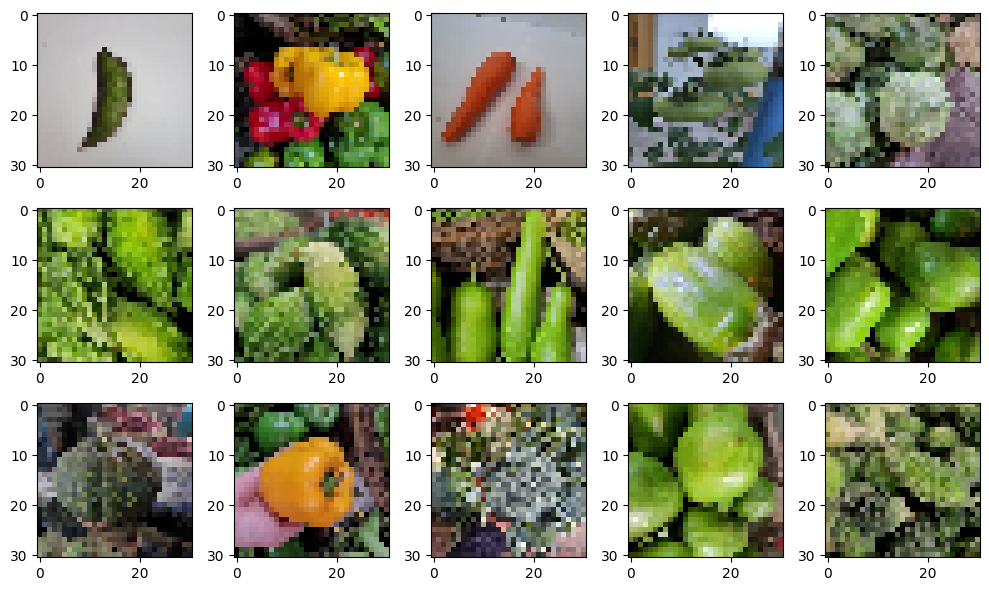

In [7]:
# Plotting 15 random images from train_df in 31 by 31 px
fig, axes = plt.subplots(3, 5, figsize=(10, 6))  # Set up a 3x5 grid of subplots
axes = axes.flatten()  # Flatten the grid for easy iteration

# Generate 15 random indices from the length of your dataframe
random_indices = np.random.choice(len(train_df), size=15, replace=False)

# Loop through the randomly selected image file paths and display them
for ax, idx in zip(axes, random_indices):
    file_name = train_df['image_file'].iloc[idx]
    file_path = os.path.join(train_data_dir, file_name)
    # Display the images in 31 by 31 px
    image = load_img(file_path, target_size=(31, 31))
    ax.imshow(image)

plt.tight_layout()
plt.show()

**IMAGE SIZE : 128 X 128 PX**

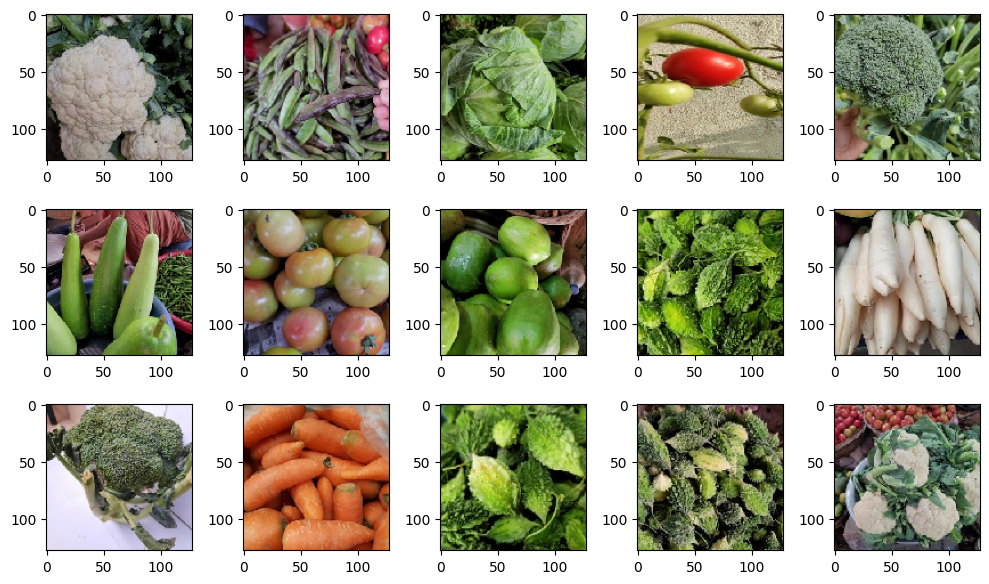

In [8]:
# Plotting 15 random images from train_df in 128 by 128 px
fig, axes = plt.subplots(3, 5, figsize=(10, 6))  # Set up a 3x5 grid of subplots
axes = axes.flatten()  # Flatten the grid for easy iteration

# Generate 15 random indices from the length of your dataframe
random_indices = np.random.choice(len(train_df), size=15, replace=False)

# Loop through the randomly selected image file paths and display them
for ax, idx in zip(axes, random_indices):
    file_name = train_df['image_file'].iloc[idx]
    file_path = os.path.join(train_data_dir, file_name)
    # Display the images in 31 by 31 px
    image = load_img(file_path, target_size=(128, 128))
    ax.imshow(image)

plt.tight_layout()
plt.show()

#### WHAT CAN WE SEE FROM THE COLOURED IMAGE SIZING ?

- We can see that between 31 px and 128 px, the images of the vegetables appear to be clearer and less pixelated when processed at 128 by 128 pixels as it is closer to the original sizing of the images (224 x 224 px).

### SPLITTING THE DATA INTO X AND Y

- To enable easier usage of the train, validation and test data, we will be splitting the dataframe into X and y.
- `X` represents the images and `y` represents the image labels.

Here, we will also make use of the `load_and_preprocess_images` function, which will enable us to resize the images to 31 by 31px and 128 by 128px and grayscale the images as well. **(Refer to the `load_and_preprocess_images` function above for more detailed information)**.

In [9]:
# Splitting dataframe into x and y

# Load and preprocess the images for 31x31 images
X_train_31, y_train_31 = load_and_preprocess_images(train_df, train_data_dir, (31, 31))
X_val_31, y_val_31 = load_and_preprocess_images(val_df, val_data_dir, (31, 31))
X_test_31, y_test_31 = load_and_preprocess_images(test_df, test_data_dir, (31, 31))

# Repeat the process for the 128x128 images
X_train_128, y_train_128 = load_and_preprocess_images(train_df, train_data_dir, (128, 128))
X_val_128, y_val_128 = load_and_preprocess_images(val_df, val_data_dir, (128, 128))
X_test_128, y_test_128 = load_and_preprocess_images(test_df, test_data_dir, (128, 128))

**VIEWING THE SHAPE OF THE ARRAY TO CHECK SIZING AND GRAYSCALING**

- Using .shape, we can see that for the images, it was successfully converted to its respective sizes and has been grayscaled correctly.
- The (31,31) and (128,128) represents the image sizes, and the (1) represents that the image only uses one channel, indicating that it has been grayscaled.

In [10]:
# View the shape of the training dataset

print(f'Shape of X_train_31: {X_train_31.shape}')
print(f'Shape of X_train_128: {X_train_128.shape}')

print(f'Shape of X_val_31: {X_val_31.shape}')
print(f'Shape of X_val_128: {X_val_128.shape}')

print(f'Shape of X_test_31: {X_test_31.shape}')
print(f'Shape of X_test_128: {X_test_128.shape}')

Shape of X_train_31: (9028, 31, 31, 1)
Shape of X_train_128: (9028, 128, 128, 1)
Shape of X_val_31: (3000, 31, 31, 1)
Shape of X_val_128: (3000, 128, 128, 1)
Shape of X_test_31: (3000, 31, 31, 1)
Shape of X_test_128: (3000, 128, 128, 1)


### INSTANTIATE CLASSES OF VEGETABLES
- Define the classes of vegetables by listing the labels and index value in { }.

In [11]:
# Instantiate classes of vegetables
class_labels = {
    0: "Bean",
    1: "Bitter_Gourd",
    2: "Bottle_Gourd",
    3: "Brinjal",
    4: "Broccoli",
    5: "Cabbage",
    6: "Capsicum",
    7: "Carrot",
    8: "Cauliflower",
    9: "Cucumber",
    10: "Papaya",
    11: "Potato",
    12: "Pumpkin",
    13: "Radish",
    14: "Tomato"
}

NUM_CLASS = 15

### VISUALIZING THE FORMATTED VEGETABLES DATASET
Based on the pre-defined classes, we can now visualize a sample set of the images and see what they look like.

**IMAGE SIZE : 31 X 31 PX**

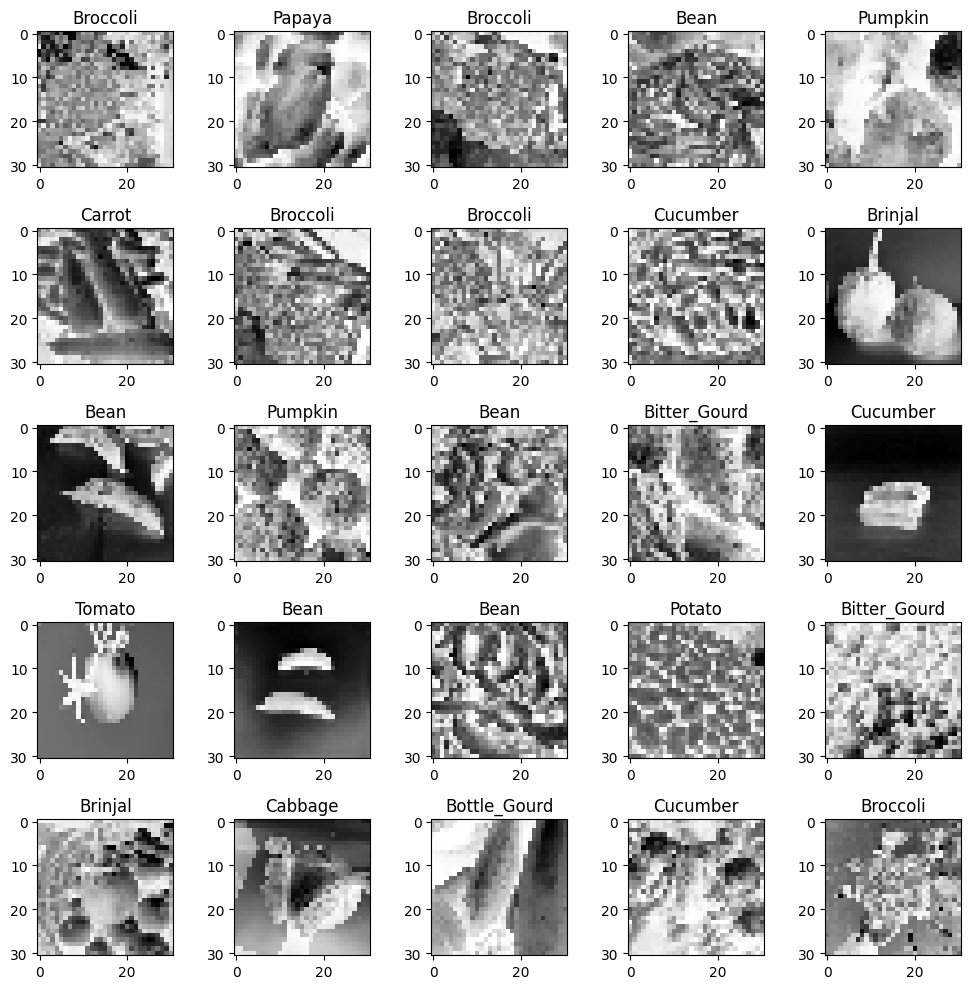

In [12]:
# Visualizing 25 randomly selected images in 31 by 31 px

# Set the images axes and figure size
fig, axes = plt.subplots(5, 5, figsize=(10, 10), tight_layout=True)

# Generate 25 random indices to select images
random_indices = np.random.choice(len(X_train_31), 25, replace=False)

# Loop through the randomly selected indices
for i, ax in enumerate(axes.ravel()):
    if i < len(random_indices):
        # Get the index for the current random image
        index = random_indices[i]
        # Display the image
        ax.imshow(X_train_31[index], cmap='Greys')
        ax.set_title(f"{class_labels[y_train_31[index]]}")

# Display the images
plt.show()

**IMAGE SIZE : 128 X 128PX**

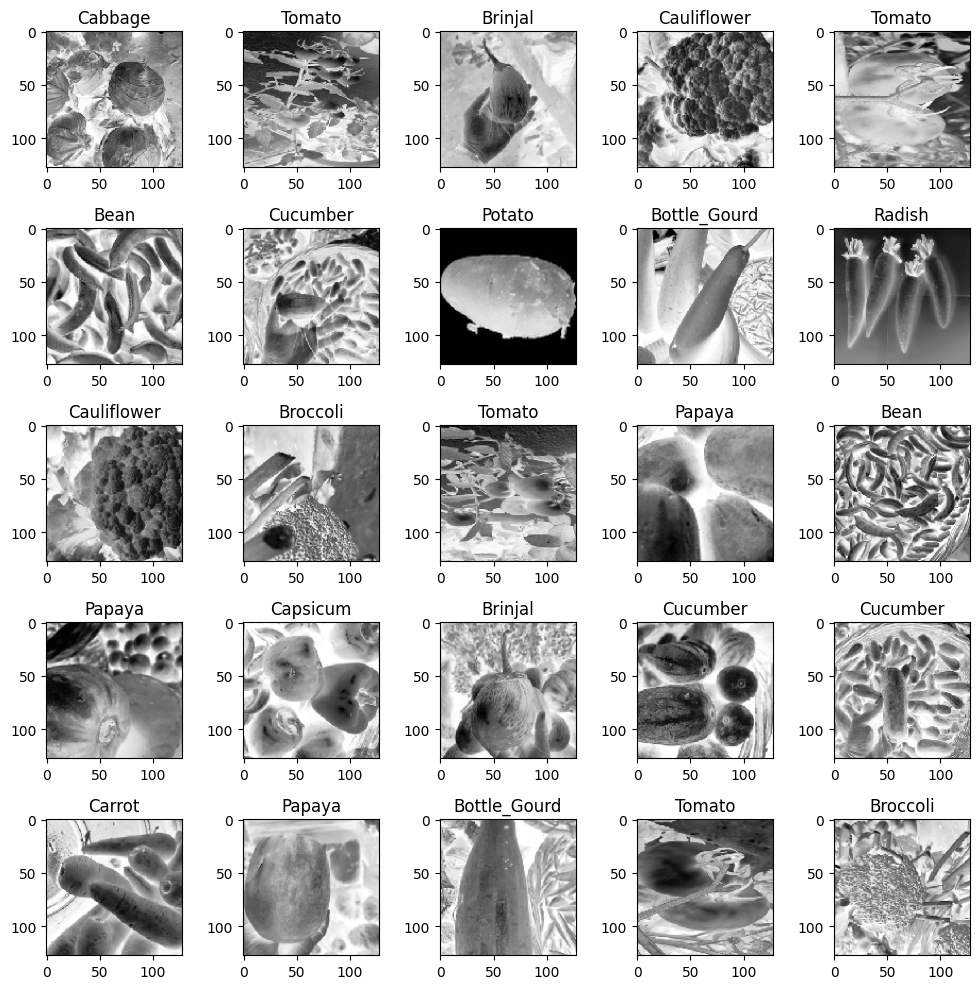

In [13]:
# Visualizing 25 randomly selected images in 128 by 128 px

# Set the images axes and figure size
fig, axes = plt.subplots(5, 5, figsize=(10, 10), tight_layout=True)

# Generate 25 random indices to select images
random_indices = np.random.choice(len(X_train_128), 25, replace=False)

# Loop through the randomly selected indices
for i, ax in enumerate(axes.ravel()):
    if i < len(random_indices):
        # Get the index for the current random image
        index = random_indices[i]
        # Display the image
        ax.imshow(X_train_128[index], cmap='Greys')
        ax.set_title(f"{class_labels[y_train_128[index]]}")

# Display the images
plt.show()

**ANALYZING THE IMAGE DISPLAY FOR 31 BY 31 AND 128 BY 128 PIXELS**

- From both image sets, we see that the smaller the image size (more scaled down), the more pixelated it becomes because a smaller number of pixels is used to represent the same images.
<br>

- Fine details from the images may have been lost or become less distinguishable in the downscaled images, and could potentially be more difficult for the model to classify images accurately.
<br>

- However, to confirm this, we will conduct further tests and evaluate various deep learning models to determine the validity of the above statement.

### UNDERSTANDING DATA AND CLASS DISTRIBUTIONS

- In this section, we will be analyzing the class distribution, pixel distribution, and brightness of the images.
- Based on the results obtained, we will be able to understand what pre-processing is necessary for our dataset.

### VISUALIZING THE CLASS DISTRIBUTION

- When training deep learning models, it is crucial to check the distribution of the image classes in the dataset, enabling us to understand the best metrics to use and evaluate if anything is needed to balance the classes.
- We can see that tomato has the most number of images, while radish has the least number of images.

Bean: 780
Bitter_Gourd: 720
Bottle_Gourd: 441
Brinjal: 868
Broccoli: 750
Cabbage: 503
Capsicum: 351
Carrot: 256
Cauliflower: 587
Cucumber: 812
Papaya: 566
Potato: 377
Pumpkin: 814
Radish: 248
Tomato: 955


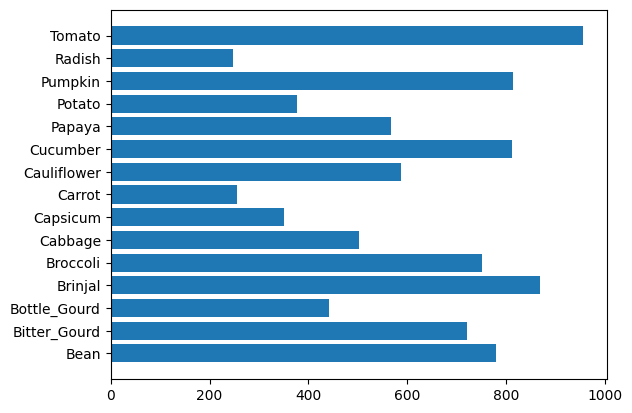

In [14]:
# Visualizing class distributions

# Count the images for each label
labels, counts = np.unique(y_train_31, return_counts = True)
for label, count in zip(labels, counts):
    print(f"{class_labels[label]}: {count}")
    
# Display a barchart displaying the counts
plt.barh(labels, counts, tick_label=list(class_labels.values()))
plt.show()

**ANALYSIS OF THE CLASS DISTRIBTIONS**

From the bar graph and count displayed, it is apparent that there is a **certain degree of imbalance** within the image classes. For example, tomato has close to 1000 images, while carrot has fewer than 400 images.

This means class oversampling will be necessary to ensure more balanced classes, which will be performed later in pre-processing and feature engineering.


### VISUALIZING IMAGE PIXEL DISTRIBUTIONS

- In this section, we will visualize the pixel intensity and find out the distribution of the pixel values.
- To visualize it, we will plot the distribution of brightness to evaluate the distribution of pixel values.

In [15]:
# Visualizing the pixel values
print("Pixel Values:")
print("Max: ", np.max(X_train_31))
print("Min: ", np.min(X_train_31))

# Calculating the mean and standard deviation of the pixels
print("\nMean and Standard Deviation of Pixels for 31 by 31 px Images:")
print("Mean: ", np.mean(X_train_31))
print("Std: ", np.std(X_train_31))

print("\nMean and Standard Deviation of Pixels for 128 by 128 px Images:")
print("Mean: ", np.mean(X_train_128))
print("Std: ", np.std(X_train_128))

Pixel Values:
Max:  255.0
Min:  0.0

Mean and Standard Deviation of Pixels for 31 by 31 px Images:
Mean:  114.84767
Std:  56.12739

Mean and Standard Deviation of Pixels for 128 by 128 px Images:
Mean:  114.83986
Std:  56.12101


**ANALYSIS OF THE PIXEL DISTRIBUTIONS**

Based on the pixel values, as expected, the pixel distribution ranges from 0 (black) to 255 (white) for grayscale images.

Looking at the mean pixel value of 114.84, we find that it falls approximately in the middle of the grayscale range, indicating that the images are not extremely dark but lean towards the darker end on this scale.

The standard deviation of 56.1 indicates a notable degree of variation in pixel values across the image, suggesting that there is significant contrast in the image, with pixels being both lighter and darker than the average.

### VISUALIZING THE DISTRIBUTION OF BRIGHTNESS IN IMAGES

- From the charts, we see that distribution is slightly skewed to the right, which suggests that there are a few images which are quite bright.

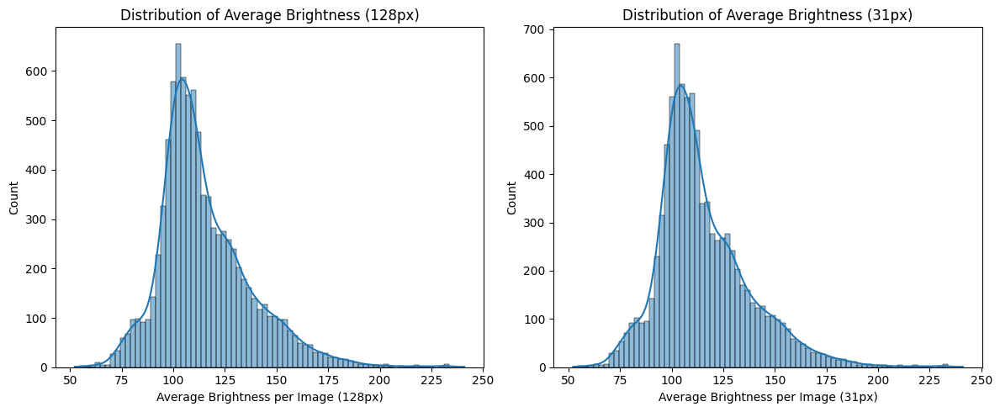

In [16]:
# Visualizing the distribution of brightness for 128px images
flattened_images_128 = X_train_128.reshape(X_train_128.shape[0], -1)
masked_images_128 = np.ma.masked_equal(flattened_images_128, 0)
average_brightness_128 = masked_images_128.mean(axis=1)

# Visualizing the distribution of brightness for 31px images
flattened_images_31 = X_train_31.reshape(X_train_31.shape[0], -1)
masked_images_31 = np.ma.masked_equal(flattened_images_31, 0)
average_brightness_31 = masked_images_31.mean(axis=1)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot the distribution of average brightness for 128px images
sns.histplot(average_brightness_128.compressed(), ax=ax1, kde=True)
ax1.set_xlabel('Average Brightness per Image (128px)')
ax1.set_title('Distribution of Average Brightness (128px)')

# Plot the distribution of average brightness for 31px images
sns.histplot(average_brightness_31.compressed(), ax=ax2, kde=True)
ax2.set_xlabel('Average Brightness per Image (31px)')
ax2.set_title('Distribution of Average Brightness (31px)')

# Show the plot
plt.tight_layout()
plt.show()

### DATA PRE-PROCESSING & IMAGE ANALYSIS

In the pre-processing and analysis of images, these are some things we will pre-process and analyse :

- Class Oversampling
- Image Averaging
- One-Hot Encoding
- Data Augmentation

### HANDLING IMBALANCED DATA USING RESAMPLING
- To handle severe class imbalance, we will use `RandomOverSampler()` to generate synthetic samples for the minority classes to ensure a more even distribution of classes.
- Our sampling_strategy will be set to `all` as there are multiple classes to perform the oversampling on.

In [17]:
# Handle class imbalance using randomoversampler

# Initialize RandomOverSampler
oversampler = RandomOverSampler(sampling_strategy='all', random_state=42)

# Reshape the 4D images to 2D vectors
X_train_31_reshaped = X_train_31.reshape((X_train_31.shape[0], -1))
X_train_128_reshaped = X_train_128.reshape((X_train_128.shape[0], -1))

# Oversampling for 31px and 128px images
X_train_31_resampled, y_train_31_resampled = oversampler.fit_resample(X_train_31_reshaped, y_train_31)
X_train_128_resampled, y_train_128_resampled = oversampler.fit_resample(X_train_128_reshaped, y_train_128)

# Reshape the resampled data back to its original 4D shape
X_train_31_resampled = X_train_31_resampled.reshape((-1, X_train_31.shape[1], X_train_31.shape[2], X_train_31.shape[3]))  
X_train_128_resampled = X_train_128_resampled.reshape((-1, X_train_128.shape[1], X_train_128.shape[2], X_train_128.shape[3])) 

**DISPLAY VISUAL AND TEXTUAL REPRESENTATION OF THE OVERSAMPLING RESULTS**

- From oversampling, we can see that the classes are now balanced with no `dominant class`, and this provides a more balanced representation of the various image classes.
- After oversampling, we see that the shape of the training data has changed, and the total number of images available for training now is 14325. 
- However, since oversampling simply creates more samples of existing images to reduce imbalance, we will perform augmentation later and evaluate if augmentation is a key factor to improving model performance.

Shape of Arrays After Oversampling:
Shape of 31 x 31 px Array: (14325, 31, 31, 1)
Shape of 128 x 128 px Array: (14325, 128, 128, 1)


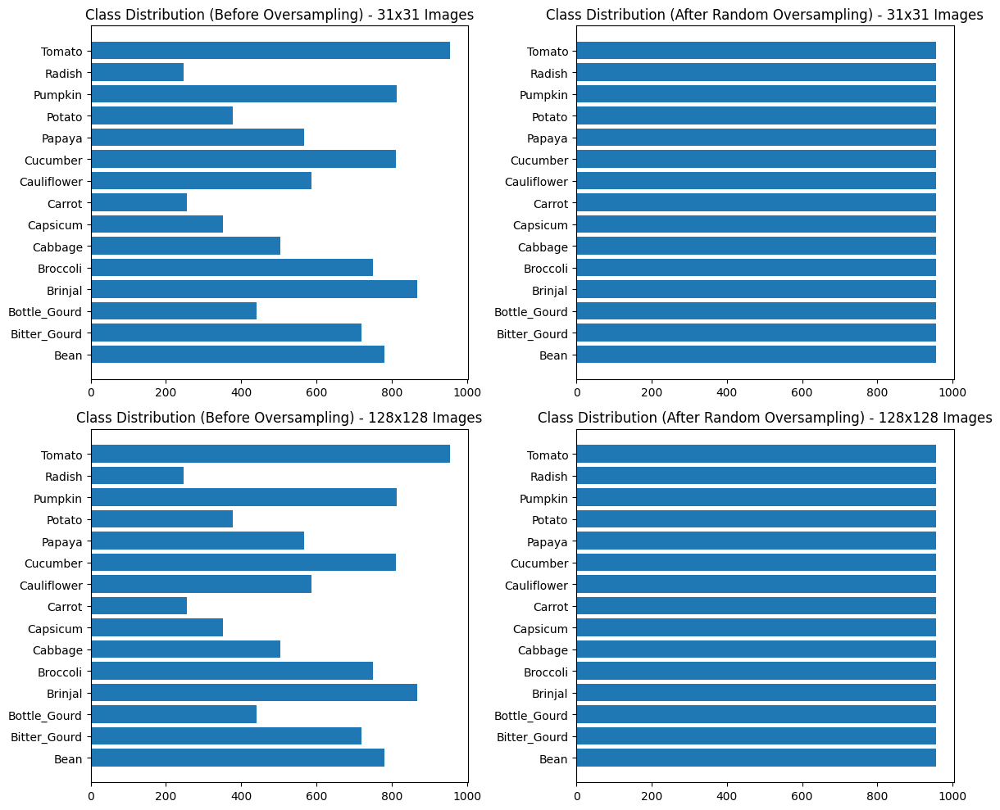

In [18]:
# Display a visual representation of the oversampled classes

# Print the shape of the new oversampled classes
print('Shape of Arrays After Oversampling:\n===============================================')
print(f'Shape of 31 x 31 px Array: {X_train_31_resampled.shape}')
print(f'Shape of 128 x 128 px Array: {X_train_128_resampled.shape}')

# Visualizing class distributions before and after oversampling
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# 31x31 images - Before and After Oversampling
labels_31, counts_31 = np.unique(y_train_31, return_counts=True)
axes[0, 0].barh(labels_31, counts_31, tick_label=list(class_labels.values()))
axes[0, 0].set_title("Class Distribution (Before Oversampling) - 31x31 Images")

labels_31_resampled, counts_31_resampled = np.unique(y_train_31_resampled, return_counts=True)
axes[0, 1].barh(labels_31_resampled, counts_31_resampled, tick_label=list(class_labels.values()))
axes[0, 1].set_title("Class Distribution (After Random Oversampling) - 31x31 Images")

# 128x128 images - Before and After Oversampling
labels_128, counts_128 = np.unique(y_train_128, return_counts=True)
axes[1, 0].barh(labels_128, counts_128, tick_label=list(class_labels.values()))
axes[1, 0].set_title("Class Distribution (Before Oversampling) - 128x128 Images")

labels_128_resampled, counts_128_resampled = np.unique(y_train_128_resampled, return_counts=True)
axes[1, 1].barh(labels_128_resampled, counts_128_resampled, tick_label=list(class_labels.values()))
axes[1, 1].set_title("Class Distribution (After Random Oversampling) - 128x128 Images")

plt.tight_layout()
plt.show()

### IMAGE AVERAGING OF PIXELS

We will first perform image averaging. This involves stacking of multiple photos on top of each other and averaging them together. We do this to see the noise of the image as well as observe all images in the dataset.

- Based on the results for image averaging, it is clear that both images show a central, darker area nearer to the top of the image, suggesting a common round / slightly elongated shape is present among most vegetables.

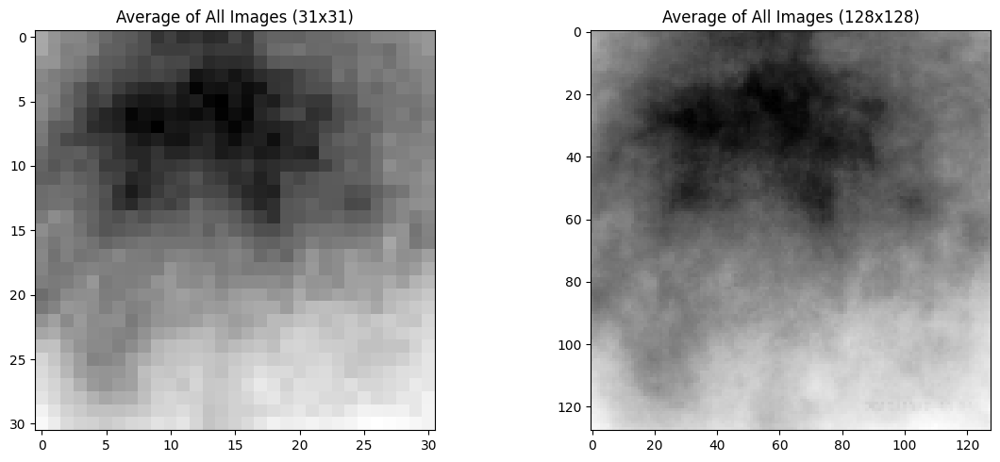

In [19]:
# Calculate the mean of all images in X_train_31 and X_train_128
mean_image_31 = np.mean(X_train_31, axis=0) / 255
mean_image_128 = np.mean(X_train_128, axis=0) / 255

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot the mean image for 31x31 images
ax1.imshow(mean_image_31, cmap='Greys')
ax1.set_title('Average of All Images (31x31)')

# Plot the mean image for 128x128 images
ax2.imshow(mean_image_128, cmap='Greys')
ax2.set_title('Average of All Images (128x128)')

# Show the plot
plt.tight_layout()
plt.show()

#### VIEW THE AVERAGE IMAGE FOR EACH CLASS LABEL

When examining the average images for each class, it becomes apparent that predicting their content can be challenging. The input data provided contains multiple objects in the same image, which makes the process of averaging more complex.

Nevertheless, by referring to the original image data shown above, we can identify some of the objects depicted in the average images. Notably, items such as papaya, cucumber, broccoli, brinjal, and a few others are discernible.

**Surprisingly, the average images for each class label appear more discernible when using 31 x 31 px image sizes, as the smaller pixels seem to capture the key features of the objects with greater clarity. However, this increased clarity may come at the cost of reduced detail for larger objects or scenes. On the other hand, the 128 x 128 px images provide a higher level of detail but may struggle to capture distinct features when multiple objects are present in the same image.**

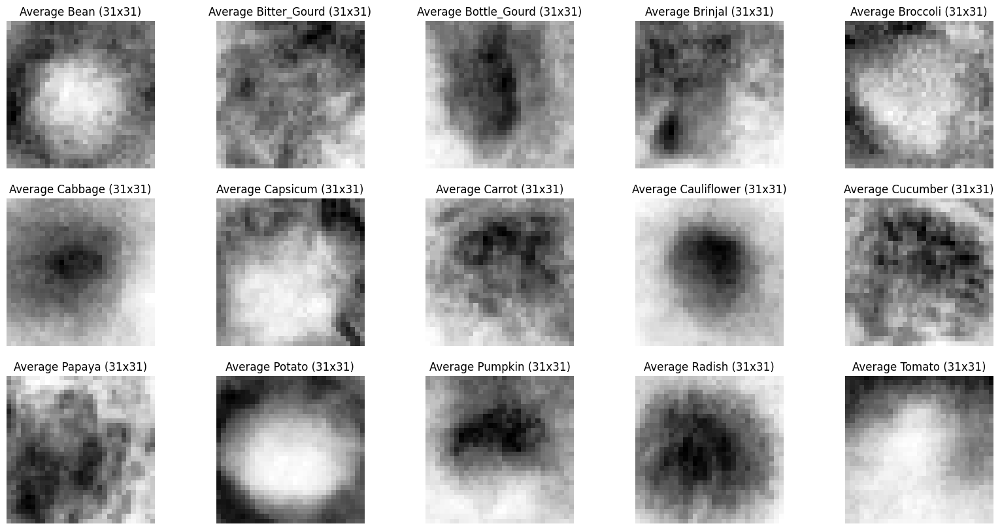

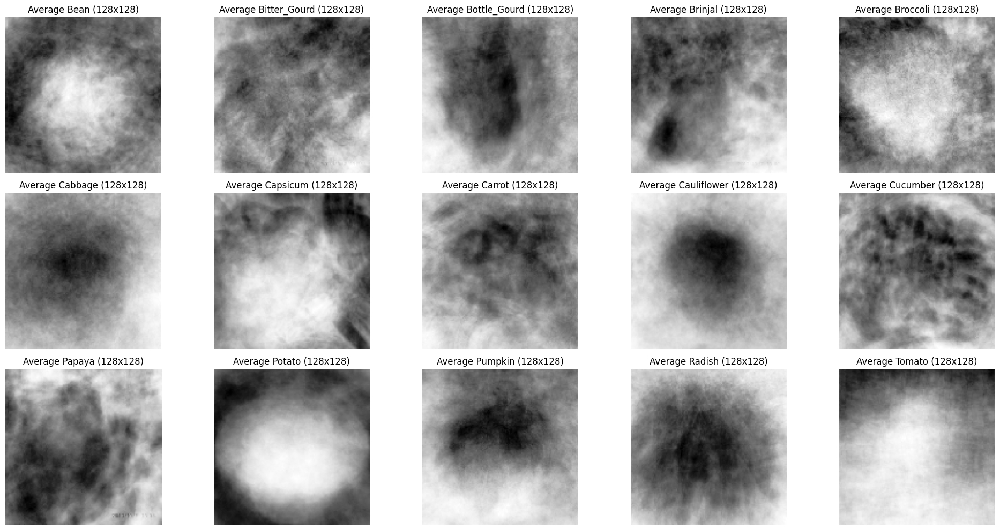

In [20]:
# View the average image for every class label

# Redefine the resampled variables
y_train_31_avg = y_train_31_resampled
y_train_128_avg = y_train_128_resampled

# Set figure and axes for 31x31 images
fig, ax = plt.subplots(3, 5, figsize=(20, 10))

# Loop through the labels for 31x31 images
for idx, subplot in enumerate(ax.ravel()):
    avg_image_31 = np.mean(X_train_31_resampled[np.squeeze(y_train_31_avg == idx)], axis=0) / 255
    subplot.imshow(avg_image_31, cmap='Greys')
    subplot.set_title(f"Average {class_labels[idx]} (31x31)")
    subplot.axis('off')

# Set figure and axes for 128x128 images
fig, ax = plt.subplots(3, 5, figsize=(20, 10))

# Loop through the labels for 128x128 images
for idx, subplot in enumerate(ax.ravel()):
    avg_image_128 = np.mean(X_train_128_resampled[np.squeeze(y_train_128_avg == idx)], axis=0) / 255
    subplot.imshow(avg_image_128, cmap='Greys')
    subplot.set_title(f"Average {class_labels[idx]} (128x128)")
    subplot.axis('off')

plt.tight_layout()
plt.show()

### PERFORM ONE-HOT ENCODING OF LABELS

- Now, after oversampling to ensure evenly distributed classes, we can now work on one-hot encoding of the labels.
- Since current labels are encoded from 0-14, we will perform one-hot encoding on the labels to convert them for model building.

In [21]:
# Performing one-hot encoding on labels

# For 31x31px
y_train_31 = to_categorical(y_train_31_resampled)
y_test_31 = to_categorical(y_test_31)
y_val_31 = to_categorical(y_val_31)

# For 128x128px
y_train_128 = to_categorical(y_train_128_resampled)
y_test_128 = to_categorical(y_test_128)
y_val_128 = to_categorical(y_val_128)

# Print the output
print(f'31 x 31 PX : {y_train_31[0]}')
print("Label: ", tf.argmax(y_train_31[0]))

print(f'\n128 x 128 PX : {y_train_128[0]}')
print("Label: ", tf.argmax(y_train_128[0]))

31 x 31 PX : [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Label:  tf.Tensor(0, shape=(), dtype=int64)

128 x 128 PX : [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Label:  tf.Tensor(0, shape=(), dtype=int64)


### INPUT NORMALIZATION
- Since pixel values of each pixel are on a similar scale, normalization can be used in this scenario to standardize values.
- We will apply normalization to the training, validation and testing set to ensure all values are scaled to a similar value from the range of 0-1.

In [22]:
# Apply normalization to the training, testing and validation for 31 and 128 px

# Normalize 31x31 images
X_train_31 = X_train_31_resampled / 255.0
X_val_31 = X_val_31 / 255.0
X_test_31 = X_test_31 / 255.0

# Normalize 128x128 images
X_train_128 = X_train_128_resampled / 255.0
X_val_128 = X_val_128 / 255.0
X_test_128= X_test_128 / 255.0

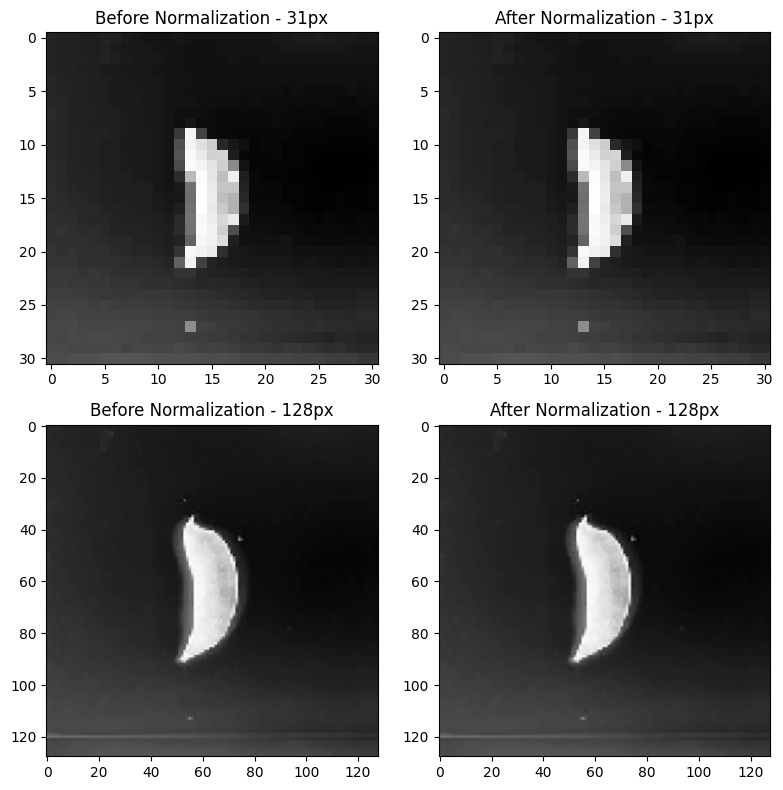

In [23]:
# Plot image to show before and after normalization for training data
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))

# 31x31 images
ax[0, 0].imshow(X_train_31_resampled[0], cmap='Greys')
ax[0, 0].set_title("Before Normalization - 31px")
ax[0, 1].imshow(X_train_31[0], cmap='Greys')
ax[0, 1].set_title("After Normalization - 31px")

# 128x128 images
ax[1, 0].imshow(X_train_128_resampled[0], cmap='Greys')
ax[1, 0].set_title("Before Normalization - 128px")
ax[1, 1].imshow(X_train_128[0], cmap='Greys')
ax[1, 1].set_title("After Normalization - 128px")

plt.tight_layout()
plt.show()

### DATA AUGMENTATION TECHNIQUES

To prevent possible overfitting of the model, we will apply data augmentation. It is a method commonly used to reduce the variance of a model by imposing random transformations on the data during training.

**Types of Image Data Augmentations : Flipping / Cropping / Rotating / Shearing ....**

For our dataset,  as seen from EDA earlier, we see that some images vary in brightness, so we will apply random brightness in our augmentation to standardize the brightness level. 

We will also apply random flip, random crop and random rotation as after oversampling, we want to increase the variation in image appearances to have more data points. From our analysis earlier, we see that many images follow a similar orientation to each other, hence we want to diversify the orientation by adding augmentation. Cropping the images also allows the model to better generalize the data and identify key features more easily.

**Note : We will only augment training data as we do not want to edit the validation and test data, as they are being used for evaluation of the model's accuracy.**

In [24]:
# Augment the image data based on EDA earlier

def data_augmentation(X_train, IMG_SIZE):
    imageArr = []
    for images in X_train:
        image = tf.convert_to_tensor(images, dtype=tf.float32)
        randomVal = np.random.randint(0, 2)
        
        # Apply random brightness variation with a chance of 50%
        if np.random.rand() < 0.5:
            image = tf.image.random_brightness(image, max_delta=0.2)
        
        # Apply random flip and random crop
        if randomVal == 1:
            image = tf.image.random_flip_left_right(image)
            image = tf.image.resize_with_crop_or_pad(image, IMG_SIZE[0] + 4, IMG_SIZE[1] + 4)
            image = tf.image.random_crop(image, size=IMG_SIZE)

        # Apply random rotation
        if np.random.rand() < 0.5:
            # Rotate by a random angle between -30 to +30 degrees
            angle = np.random.uniform(-30, 30)
            image = tf.image.rot90(image, k=int(angle / 90))

        # Adding the image to the list
        imageArr.append(image)

    return np.array(imageArr)

**IMAGE SIZE : 31 X 31 PX**

- Test the augmentation on image size of 31 by 31 px first.

In [25]:
IMG_SIZE = (31, 31, 1)
X_train_31_aug = np.copy(X_train_31)
X_train_31_aug = data_augmentation(X_train_31_aug, IMG_SIZE)

Let's now take a look at the augmented images.

Based on the results shown below, we can see that the images were successfully augmented.

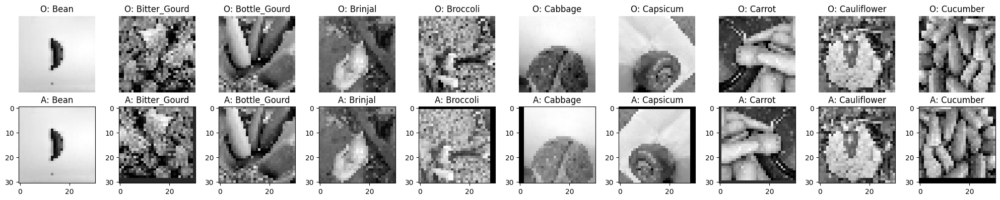

In [26]:
# Setup the figure and axes
fig, ax = plt.subplots(2, 10, figsize=(20, 4)) 

for idx in range(10):  # Loop through the first 10 classes
    # Display original images
    original_image_idx = np.where(y_train_31_resampled == idx)[0][0]  
    ax[0, idx].set_title(f"O: {class_labels[idx]}")
    ax[0, idx].imshow(X_train_31_resampled[original_image_idx].squeeze(), cmap='gray')  
    ax[0, idx].axis("off")
    
    # Display augmented images
    augmented_image_idx = np.where(y_train_31_resampled == idx)[0][0]  
    ax[1, idx].set_title(f"A: {class_labels[idx]}")
    ax[1, idx].imshow(X_train_31_aug[augmented_image_idx].squeeze(), cmap='gray')  

# Display the plot
plt.tight_layout()
plt.show()

**IMAGE SIZE : 128 X 128 PX**

- Now, we will test the augmentation on image size of 128 by 128px.

In [27]:
IMG_SIZE = (128, 128, 1)
X_train_128_aug = np.copy(X_train_128)
X_train_128_aug = data_augmentation(X_train_128_aug, IMG_SIZE)

Let's now take a look at the augmented images.

Based on the results shown below, we can see that the images were successfully augmented.

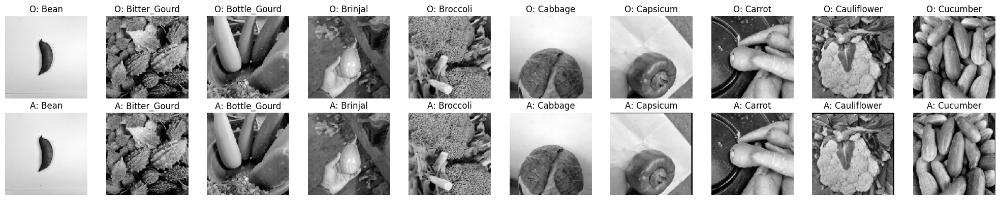

In [28]:
# Setup the figure and axes
fig, ax = plt.subplots(2, 10, figsize=(20, 4)) 

for idx in range(10):  # Loop through the first 10 classes
    # Display original images
    original_image_idx = np.where(y_train_31_resampled == idx)[0][0] 
    ax[0, idx].set_title(f"O: {class_labels[idx]}")
    ax[0, idx].imshow(X_train_128_resampled[original_image_idx].squeeze(), cmap='gray')  
    ax[0, idx].axis("off")
    
    # Display augmented images
    augmented_image_idx = np.where(y_train_31_resampled == idx)[0][0]  
    ax[1, idx].set_title(f"A: {class_labels[idx]}")
    ax[1, idx].imshow(X_train_128_aug[augmented_image_idx].squeeze(), cmap='gray') 
    ax[1, idx].axis("off")

# Display the plot
plt.tight_layout()
plt.show()

### MODEL BUILDING AND DEVELOPMENT

To solve this image classification task, we will be making use of a few deep learning models.

- Fully Connected Neural Network Model (Baseline Model)
- Conv2D Neural Network Model
- CustomVGG Model
- CustomAlexNet Model
- CustomNet Model | Self-Designed

### OPTIMIZERS TO USE
We will be looking at 2 types of optimizers, Adam and SGD optimizers.

Adam : Adam Optimizer is a stochastic gradient descent method that is based on adaptive estimation of first-order and second-order moments.

SGD : SGD is known as stochastic gradient descent, which is an iterative method for optimizing an objective function with suitable smoothness.

**Differences between Adam and SGD Optimizers**<br>
Adam optimizer is faster compared to SGD, as Adam uses coordinate-wise gradient clipping, tackling heavy-tailed noise. This also updates the learning rate for each network weight individually. However, SGD is known to perform better than Adam for image classification tasks. Adam optimizer tends to take 'shortcuts', which is better for NLP and other machine learning purposes, but for image classification, every detail is important to distinguish what the image is. So with SGD being more detailed, we will choose to use SGD optimizer for all our subsequent model training.

**Chosen Optimizer : SGD Optimizer**

### MODEL 1 : BASELINE FULLY CONNECTED MODEL

- For our baseline model, we will be using this as a base to compare against other models we will build.
- This model will use the Sequential class and 3 hidden layers. For each hidden layer, we will use the ReLU activation and for the final output layer, we will use softmax as there are multiple classes to be predicted hence sigmoid will not be suitable.
- As we have multiple classes to predict, we will use the categorical_crossentropy as our loss function.
- The optimizer will be SGD and our main metric will be accuracy as we have ensured relatively balanced classes by performing oversampling.


### DEFINE FUNCTION TO CREATE BASELINE MODEL
- The function below will be used for creation and setting up of the baseline model.
- For 31px and 128px, our models differ slightly in architecture as the image sizes are different, so for 128px images, we set the Dense layer value to 256 instead of 128 to accommodate for the larger image sizes.

In [29]:
def build_baseline_model_31(X_train, NUM_CLASS, model_name):

    # Clear the previous tensorflow session
    tf.keras.backend.clear_session()

    # Define the input shape and create the input tensor
    input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
    inputs = Input(shape=input_shape)

    # Building the model
    x = Flatten()(inputs)
    x = Dense(128, activation='relu')(x)  # Hidden layer 1
    x = Dense(128, activation='relu')(x)  # Hidden layer 2
    x = Dense(128, activation='relu')(x)  # Hidden layer 3
    x = Dense(NUM_CLASS, activation='softmax')(x)  # Output layer

    # Creating the model
    model = Model(inputs=inputs, outputs=x, name=model_name)

    # Compiling the model
    model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

    # Print model summary
    model.summary()

    return model

def build_baseline_model_128(X_train, NUM_CLASS, model_name):

    # Clear the previous tensorflow session
    tf.keras.backend.clear_session()

    # Define the input shape and create the input tensor
    input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
    inputs = Input(shape=input_shape)

    # Building the model
    x = Flatten()(inputs)
    x = Dense(256, activation='relu')(x)  # Hidden layer 1
    x = Dense(256, activation='relu')(x)  # Hidden layer 2
    x = Dense(256, activation='relu')(x)  # Hidden layer 3
    x = Dense(NUM_CLASS, activation='softmax')(x)  # Output layer

    # Creating the model
    model = Model(inputs=inputs, outputs=x, name=model_name)

    # Compiling the model
    model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

    # Print model summary
    model.summary()

    return model


### TRAINING BASELINE MODEL WITHOUT DATA AUGMENTATION

To train the baseline model, we will first use our unaugmented data to train and fit the model. After that, we will retrain the same model with augmented data and compare the differences in performance. 

For this model, we will be testing with both image sizes and evaluate which type of image can perform better using the same model parameters.

**IMAGE SIZE : 31 X 31 PX**

In [30]:
baseline = build_baseline_model_31(X_train_31, NUM_CLASS, model_name="Baseline31")

Model: "Baseline31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 flatten (Flatten)           (None, 961)               0         
                                                                 
 dense (Dense)               (None, 128)               123136    
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dense_3 (Dense)             (None, 15)                1935      
                                                                 
Total params: 158,095
Trainable params: 158,095
Non-trai

**FITTING THE DATA TO THE BASELINE MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [31]:
baseModelHistory31 = baseline.fit(X_train_31, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 4ms/step - loss: 2.5184 - accuracy: 0.1655 - val_loss: 2.3514 - val_accuracy: 0.2527
Epoch 2/50
448/448 [==============================] - 2s 4ms/step - loss: 2.2231 - accuracy: 0.2838 - val_loss: 2.2833 - val_accuracy: 0.2537
Epoch 3/50
448/448 [==============================] - 2s 4ms/step - loss: 2.0092 - accuracy: 0.3587 - val_loss: 2.0226 - val_accuracy: 0.3693
Epoch 4/50
448/448 [==============================] - 2s 4ms/step - loss: 1.8078 - accuracy: 0.4253 - val_loss: 1.9989 - val_accuracy: 0.3760
Epoch 5/50
448/448 [==============================] - 2s 4ms/step - loss: 1.6080 - accuracy: 0.4877 - val_loss: 1.8646 - val_accuracy: 0.4333
Epoch 6/50
448/448 [==============================] - 2s 4ms/step - loss: 1.4484 - accuracy: 0.5420 - val_loss: 1.6921 - val_accuracy: 0.4863
Epoch 7/50
448/448 [==============================] - 2s 4ms/step - loss: 1.3158 - accuracy: 0.5800 - val_loss: 1.7721 - val_accuracy: 0.4680
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE BASE MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the base model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [32]:
baseModelHistory31 = baseModelHistory31.history

In [33]:
# Get model results
result_df = compile_results(baseModelHistory31, "BaselineModel31", 32, result_df)
display(result_df.iloc[0])

Model Name           BaselineModel31
Epochs                            50
Batch Size                        32
Train Loss                  0.125429
Val Loss                    2.713443
Train Acc                   0.959372
Val Acc                        0.653
[Train - Val] Acc           0.306372
Name: 0, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**
- From the curves, we can see that while there is a significant decrease in training loss, and a significant increase in training accuracy, the pattern could not be seen from the validation data.

- This implies that our model actually overfits the input data, which is why validation data performs so poorly. Thus, this already shows that a fully connected baseline model is not sufficient to classify the images well, hence more advanced techniques are needed.

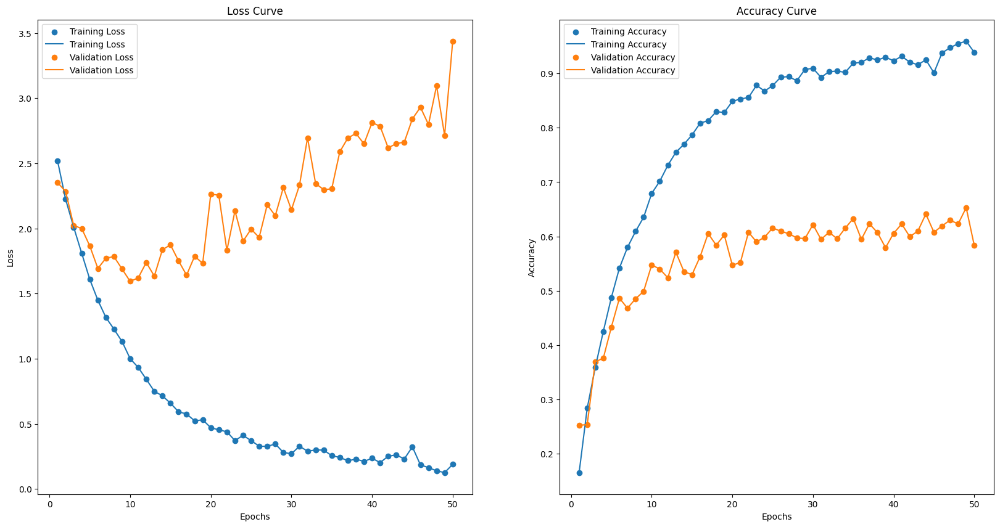

In [34]:
plot_loss_curve(baseModelHistory31)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [35]:
baseline = build_baseline_model_128(X_train_128, NUM_CLASS, model_name="Baseline128")

Model: "Baseline128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 dense (Dense)               (None, 256)               4194560   
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 15)                3855      
                                                                 
Total params: 4,329,999
Trainable params: 4,329,999
Non

**FITTING THE DATA TO THE BASELINE MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [36]:
baseModelHistory128 = baseline.fit(X_train_128, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 5ms/step - loss: 2.6118 - accuracy: 0.1166 - val_loss: 2.5719 - val_accuracy: 0.1397
Epoch 2/50
448/448 [==============================] - 2s 4ms/step - loss: 2.5035 - accuracy: 0.1534 - val_loss: 2.6242 - val_accuracy: 0.1267
Epoch 3/50
448/448 [==============================] - 2s 4ms/step - loss: 2.4769 - accuracy: 0.1610 - val_loss: 2.4780 - val_accuracy: 0.1453
Epoch 4/50
448/448 [==============================] - 2s 4ms/step - loss: 2.4393 - accuracy: 0.1752 - val_loss: 2.4633 - val_accuracy: 0.1693
Epoch 5/50
448/448 [==============================] - 2s 4ms/step - loss: 2.4179 - accuracy: 0.1841 - val_loss: 2.4658 - val_accuracy: 0.1640
Epoch 6/50
448/448 [==============================] - 2s 4ms/step - loss: 2.4082 - accuracy: 0.1925 - val_loss: 2.4357 - val_accuracy: 0.1850
Epoch 7/50
448/448 [==============================] - 2s 4ms/step - loss: 2.3972 - accuracy: 0.1938 - val_loss: 2.4577 - val_accuracy: 0.1890
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE BASE MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the base model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [37]:
baseModelHistory128 = baseModelHistory128.history

In [38]:
# Get model results
result_df = compile_results(baseModelHistory128, "BaselineModel128", 32, result_df)
display(result_df.iloc[1])

Model Name           BaselineModel128
Epochs                             46
Batch Size                         32
Train Loss                    1.97794
Val Loss                     2.420122
Train Acc                    0.352949
Val Acc                      0.270667
[Train - Val] Acc            0.082283
Name: 1, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**
- From the curves, similar to images with 31 px, we can see that images with 128px tend to overfit less than images with 31px as the difference between training and validation accuracy is slightly lower.

- However, our model still overfits the input data with unstable changes in the validation loss and validation accuracy, indicating that more improvements will definitely be needed.

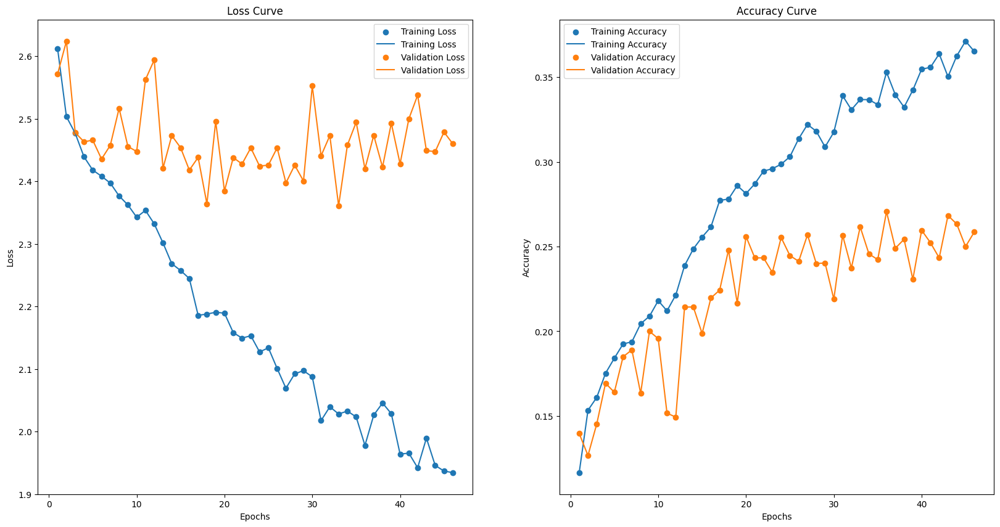

In [39]:
plot_loss_curve(baseModelHistory128)
plt.show()

### TRAINING BASELINE MODEL WITH DATA AUGMENTATION

We will now use our augmented data to train and fit the model and compare the changes in performance to evaluate if augmenting the image data has any impact on the model's performance and how well it can generalize to unseen data.

For augmented data, we will still be testing with both image sizes and evaluate which type of image can perform better using the same model parameters as unaugmented data.

**IMAGE SIZE : 31 X 31 PX**

In [40]:
baseline = build_baseline_model_31(X_train_31_aug, NUM_CLASS, model_name="Baseline31Augmented")

Model: "Baseline31Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 flatten (Flatten)           (None, 961)               0         
                                                                 
 dense (Dense)               (None, 128)               123136    
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dense_3 (Dense)             (None, 15)                1935      
                                                                 
Total params: 158,095
Trainable params: 158,095

**FITTING THE DATA TO THE BASELINE MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [41]:
baseModelAugmentedHistory31 = baseline.fit(X_train_31_aug, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 2s 4ms/step - loss: 2.5870 - accuracy: 0.1361 - val_loss: 2.4654 - val_accuracy: 0.2017
Epoch 2/50
448/448 [==============================] - 2s 4ms/step - loss: 2.4310 - accuracy: 0.1997 - val_loss: 2.3457 - val_accuracy: 0.2357
Epoch 3/50
448/448 [==============================] - 2s 4ms/step - loss: 2.3350 - accuracy: 0.2325 - val_loss: 2.1870 - val_accuracy: 0.2860
Epoch 4/50
448/448 [==============================] - 2s 4ms/step - loss: 2.2306 - accuracy: 0.2751 - val_loss: 2.1534 - val_accuracy: 0.3113
Epoch 5/50
448/448 [==============================] - 2s 4ms/step - loss: 2.1351 - accuracy: 0.3101 - val_loss: 2.0933 - val_accuracy: 0.3220
Epoch 6/50
448/448 [==============================] - 2s 4ms/step - loss: 2.0591 - accuracy: 0.3292 - val_loss: 2.0673 - val_accuracy: 0.3400
Epoch 7/50
448/448 [==============================] - 2s 4ms/step - loss: 1.9609 - accuracy: 0.3629 - val_loss: 1.9944 - val_accuracy: 0.3723
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE BASE MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the base model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [42]:
baseModelAugmentedHistory31 = baseModelAugmentedHistory31.history

In [43]:
# Get model results
result_df = compile_results(baseModelAugmentedHistory31, "BaselineModel31Augmented", 32, result_df)
display(result_df.iloc[2])

Model Name           BaselineModel31Augmented
Epochs                                     50
Batch Size                                 32
Train Loss                           0.540158
Val Loss                             2.654329
Train Acc                            0.821431
Val Acc                                 0.544
[Train - Val] Acc                    0.277431
Name: 2, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**
- From the curves, our augmented data actually showed worse performance than the original data and overfitted more than the original data, indicating that augmentation did not help for the basline model for 31x31 px.

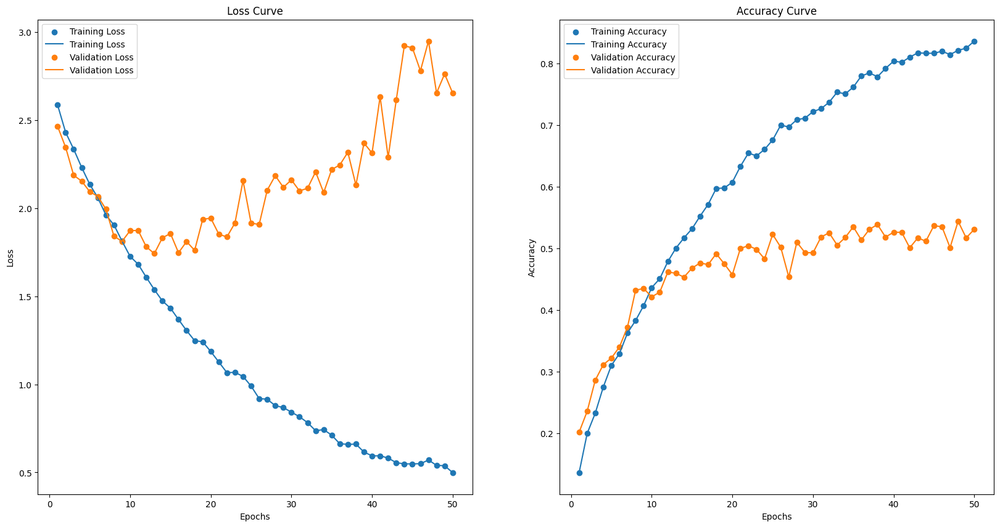

In [44]:
plot_loss_curve(baseModelAugmentedHistory31)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [45]:
baseline = build_baseline_model_128(X_train_128_aug, NUM_CLASS, model_name="Baseline128Augmented")

Model: "Baseline128Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 dense (Dense)               (None, 256)               4194560   
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 15)                3855      
                                                                 
Total params: 4,329,999
Trainable params: 4,32

**FITTING THE DATA TO THE BASELINE MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [46]:
baseModelAugmentedHistory128 = baseline.fit(X_train_128_aug, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 5ms/step - loss: 2.5936 - accuracy: 0.1313 - val_loss: 2.5058 - val_accuracy: 0.1573
Epoch 2/50
448/448 [==============================] - 2s 5ms/step - loss: 2.4707 - accuracy: 0.1754 - val_loss: 2.4489 - val_accuracy: 0.1857
Epoch 3/50
448/448 [==============================] - 2s 5ms/step - loss: 2.4185 - accuracy: 0.1911 - val_loss: 2.3931 - val_accuracy: 0.2007
Epoch 4/50
448/448 [==============================] - 2s 4ms/step - loss: 2.3796 - accuracy: 0.2081 - val_loss: 2.4200 - val_accuracy: 0.1933
Epoch 5/50
448/448 [==============================] - 2s 5ms/step - loss: 2.3449 - accuracy: 0.2203 - val_loss: 2.3280 - val_accuracy: 0.2277
Epoch 6/50
448/448 [==============================] - 2s 4ms/step - loss: 2.3208 - accuracy: 0.2267 - val_loss: 2.4222 - val_accuracy: 0.2030
Epoch 7/50
448/448 [==============================] - 2s 4ms/step - loss: 2.2722 - accuracy: 0.2465 - val_loss: 2.3249 - val_accuracy: 0.2337
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE BASE MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the base model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [47]:
baseModelAugmentedHistory128 = baseModelAugmentedHistory128.history

In [48]:
# Get model results
result_df = compile_results(baseModelAugmentedHistory128, "BaselineModel128Augmented", 32, result_df)
display(result_df.iloc[3])

Model Name           BaselineModel128Augmented
Epochs                                      50
Batch Size                                  32
Train Loss                            1.107781
Val Loss                              2.362754
Train Acc                             0.640419
Val Acc                                  0.439
[Train - Val] Acc                     0.201419
Name: 3, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From this curve, we see that augmented data for 128 px images managed to achieve a higher validation accuracy of 0.439 than the original data for 128px images. 
- However, this also overfitted more to the training data as the difference between the training and validation accuracy is significantly higher as well.

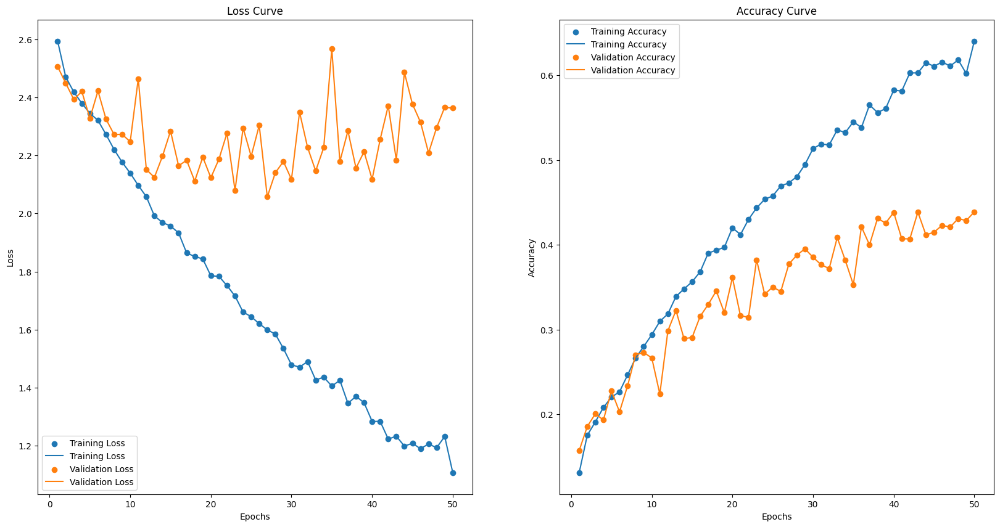

In [49]:
plot_loss_curve(baseModelAugmentedHistory128)
plt.show()

### CONCLUSIONS MADE FROM THE BASELINE MODEL 

From the baseline model for both image sizes, it is clear that the model tends to overfit on the training data as it performs more poorly on the validation dataset with a lower validation accuracy and higher validation loss. 

**Therefore, to combat this overfit, we will be experimenting with L1 / L2 regularization in subsequent models to help reduce the model's probability of overfitting and ensure better results.**

Image Size with Higher Validation Accuracy & Lower Loss : Baseline Model for 128 px Images + Augmented

Augmented Vs Non-Augmented Data : The distinction is still not clear for the baseline model, as the augmented data performed better for images with 128 px, but worse for images with 31 px. Hence, we will continue exploring other models to determine whether augmentation is truly helpful.

### MODEL 2 : CONV2D NEURAL NETWORK MODEL

For image classification, the first model to test would be a simple Conv2D CNN Model.

- After creating the baseline model, we will now build a simple convolutional neural network (CNN). We will use Tensorflow's Conv2D layers to build the models.
- CNN is used because its architecture is well-suited to solve image classification problems, and its convolution layers consider contexts in the local neighborhood of input data and constructs features from the neighborhood.
- CNNs also reduces the number of parameters in the network due to its sparse connections and weight-sharing properties.

### DEFINE FUNCTION TO CREATE CONV2D NEURAL NETWORK MODEL

- Define a `build_cnn_model` function for testing of the Conv2D Neural Network Model on 31 px and 128 px images.
- Similarly to the baseline model, due to differing image sizes, we will modify the architecture of the model for 128px images by adding an additional Conv2D layer to the model to deepen the neural network and increase complexity, which is often needed for larger sized images.

In [50]:
# Function for a Conv2D Model
def build_cnn_model_31(X_train, NUM_CLASS, model_name):
    
    # Clear the previous tensorflow session
    tf.keras.backend.clear_session()

    # Create the input tensor
    input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
    inputs = Input(shape=input_shape)

    # Building the model
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    
    x = Dense(NUM_CLASS, activation='softmax')(x) # Output Layer

    # Creating the model
    model = Model(inputs=inputs, outputs=x, name=model_name)

    # Compiling the model
    model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

    # Print model summary
    model.summary()
    return model

# Function for a Conv2D Model
def build_cnn_model_128(X_train, NUM_CLASS, model_name):
    
    # Clear the previous tensorflow session
    tf.keras.backend.clear_session()

    # Create the input tensor
    input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
    inputs = Input(shape=input_shape)

    # Building the model
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Dropout(0.5)(x)
    x = Flatten()(x)
    
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    
    x = Dense(NUM_CLASS, activation='softmax')(x) # Output Layer

    # Creating the model
    model = Model(inputs=inputs, outputs=x, name=model_name)

    # Compiling the model
    model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

    # Print model summary
    model.summary()
    return model

### TRAINING CONV2D MODEL WITHOUT DATA AUGMENTATION

To train the Conv2D model, we will first use our unaugmented data to train and fit the model. After that, we will retrain the same model with augmented data and compare the differences in performance. 

For this model, we will be testing with both image sizes and evaluate which type of image can perform better using the same model parameters.

**IMAGE SIZE : 31 X 31 PX**

In [51]:
conv2DModel_31 = build_cnn_model_31(X_train_31, NUM_CLASS, model_name="Conv2D_31")

Model: "Conv2D_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 31, 31, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 128)         73

**FITTING THE DATA TO THE CONV2D MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [52]:
conv2D_31History = conv2DModel_31.fit(X_train_31, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 6s 6ms/step - loss: 2.6153 - accuracy: 0.1280 - val_loss: 2.3218 - val_accuracy: 0.2913
Epoch 2/50
448/448 [==============================] - 2s 5ms/step - loss: 2.0299 - accuracy: 0.3465 - val_loss: 1.7434 - val_accuracy: 0.4403
Epoch 3/50
448/448 [==============================] - 2s 5ms/step - loss: 1.4601 - accuracy: 0.5275 - val_loss: 1.2240 - val_accuracy: 0.6103
Epoch 4/50
448/448 [==============================] - 2s 5ms/step - loss: 1.0700 - accuracy: 0.6591 - val_loss: 0.8920 - val_accuracy: 0.7153
Epoch 5/50
448/448 [==============================] - 2s 5ms/step - loss: 0.7853 - accuracy: 0.7490 - val_loss: 0.8846 - val_accuracy: 0.7137
Epoch 6/50
448/448 [==============================] - 2s 5ms/step - loss: 0.6284 - accuracy: 0.7990 - val_loss: 0.5484 - val_accuracy: 0.8310
Epoch 7/50
448/448 [==============================] - 2s 5ms/step - loss: 0.4979 - accuracy: 0.8391 - val_loss: 0.4860 - val_accuracy: 0.8567
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CONV2D MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CONV2D model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [53]:
conv2D_31History = conv2D_31History.history

In [54]:
# Get model results
result_df = compile_results(conv2D_31History, "Conv2DModel_31", 32, result_df)
display(result_df.iloc[4])

Model Name           Conv2DModel_31
Epochs                           42
Batch Size                       32
Train Loss                  0.07472
Val Loss                   0.352616
Train Acc                  0.975777
Val Acc                    0.926667
[Train - Val] Acc           0.04911
Name: 4, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we see that using Conv2D, it performed much better than the baseline model in terms of not overfitting as the difference in training and validation accuracy is only 0.04, showing that adding convolutional layers does help the model perform better in generalizing to unseen data and achieving better results overall.

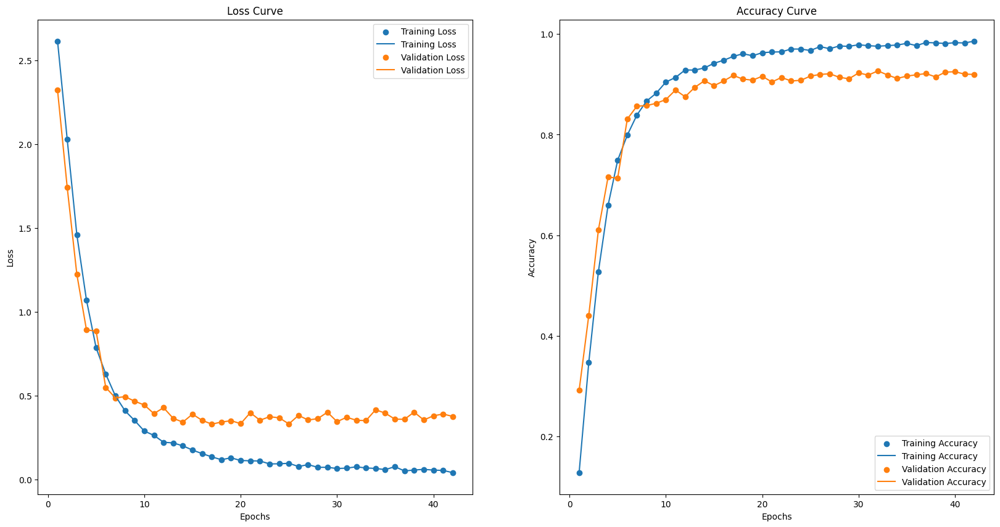

In [55]:
plot_loss_curve(conv2D_31History)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [56]:
conv2DModel_128 = build_cnn_model_128(X_train_128, NUM_CLASS, model_name="Conv2D_128")

Model: "Conv2D_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       7

**FITTING THE DATA TO THE CONV2D MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [57]:
conv2D_128History = conv2DModel_128.fit(X_train_128, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 6s 12ms/step - loss: 2.5655 - accuracy: 0.1459 - val_loss: 2.3099 - val_accuracy: 0.2657
Epoch 2/50
448/448 [==============================] - 5s 11ms/step - loss: 1.8597 - accuracy: 0.4133 - val_loss: 1.3487 - val_accuracy: 0.5903
Epoch 3/50
448/448 [==============================] - 5s 11ms/step - loss: 1.1049 - accuracy: 0.6539 - val_loss: 0.8370 - val_accuracy: 0.7473
Epoch 4/50
448/448 [==============================] - 5s 11ms/step - loss: 0.6697 - accuracy: 0.7888 - val_loss: 0.6888 - val_accuracy: 0.7903
Epoch 5/50
448/448 [==============================] - 5s 11ms/step - loss: 0.4343 - accuracy: 0.8647 - val_loss: 0.4472 - val_accuracy: 0.8657
Epoch 6/50
448/448 [==============================] - 5s 11ms/step - loss: 0.3028 - accuracy: 0.9048 - val_loss: 0.4593 - val_accuracy: 0.8677
Epoch 7/50
448/448 [==============================] - 5s 11ms/step - loss: 0.2343 - accuracy: 0.9252 - val_loss: 0.4330 - val_accuracy: 0.8807

**EXTRACT THE TRAINING HISTORY OF THE CONV2D MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CONV2D model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [58]:
conv2D_128History = conv2D_128History.history

In [59]:
result_df = compile_results(conv2D_128History, "Conv2DModel_128", 32, result_df)
display(result_df.iloc[5])

Model Name           Conv2DModel_128
Epochs                            43
Batch Size                        32
Train Loss                  0.025198
Val Loss                    0.297138
Train Acc                   0.991832
Val Acc                        0.937
[Train - Val] Acc           0.054832
Name: 5, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the loss and accuracy curves, we can see that the Conv2D model definitely performed much better than the baseline model, with the validation loss being at 0.29, and we can see much better stability in the fluctuations of the curves, indicating that the model is generalizing better to unseen data.

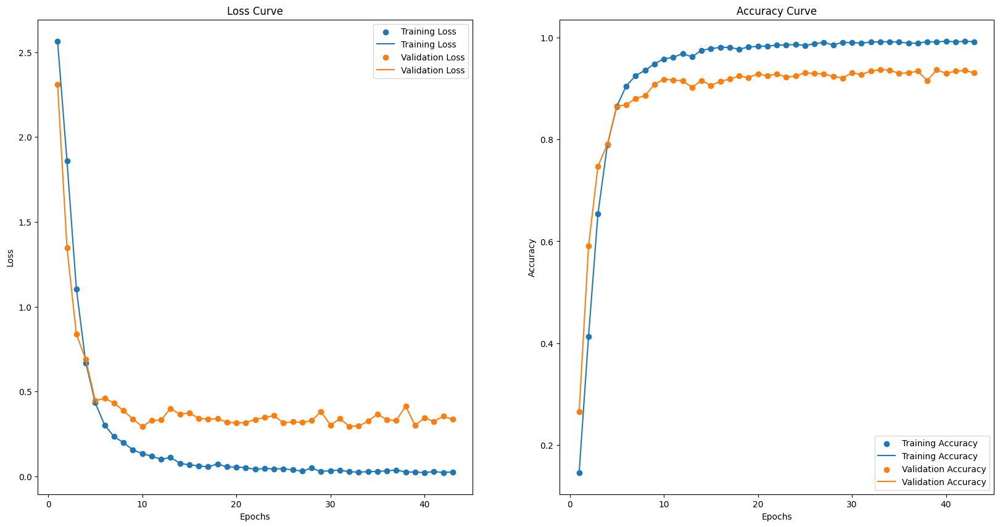

In [60]:
plot_loss_curve(conv2D_128History)
plt.show()

### TRAINING CONV2D MODEL WITH DATA AUGMENTATION

We will now use our augmented data to train and fit the model and compare the changes in performance to evaluate if augmenting the image data has any impact on the model's performance and how well it can generalize to unseen data.

For augmented data, we will still be testing with both image sizes and evaluate which type of image can perform better using the same model parameters as unaugmented data.

**IMAGE SIZE : 31 X 31 PX**

In [61]:
conv2DModel_31Augmented = build_cnn_model_31(X_train_31_aug, NUM_CLASS, model_name="Conv2D_31Augmented")

Model: "Conv2D_31Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 31, 31, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 128)  

**FITTING THE DATA TO THE CONV2D MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [62]:
conv2D_31AugmentedHistory = conv2DModel_31Augmented.fit(X_train_31_aug, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 6ms/step - loss: 2.6419 - accuracy: 0.1162 - val_loss: 2.5056 - val_accuracy: 0.2067
Epoch 2/50
448/448 [==============================] - 2s 5ms/step - loss: 2.3385 - accuracy: 0.2336 - val_loss: 1.9261 - val_accuracy: 0.4103
Epoch 3/50
448/448 [==============================] - 2s 5ms/step - loss: 1.9361 - accuracy: 0.3645 - val_loss: 1.4715 - val_accuracy: 0.5463
Epoch 4/50
448/448 [==============================] - 2s 5ms/step - loss: 1.6521 - accuracy: 0.4620 - val_loss: 1.2654 - val_accuracy: 0.5997
Epoch 5/50
448/448 [==============================] - 2s 5ms/step - loss: 1.4050 - accuracy: 0.5410 - val_loss: 0.9817 - val_accuracy: 0.7070
Epoch 6/50
448/448 [==============================] - 2s 5ms/step - loss: 1.1379 - accuracy: 0.6275 - val_loss: 0.8974 - val_accuracy: 0.7360
Epoch 7/50
448/448 [==============================] - 2s 5ms/step - loss: 0.9663 - accuracy: 0.6815 - val_loss: 0.7195 - val_accuracy: 0.7773
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CONV2D MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CONV2D model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [63]:
conv2D_31AugmentedHistory = conv2D_31AugmentedHistory.history

In [64]:
# Get model results
result_df = compile_results(conv2D_31AugmentedHistory, "Conv2DModel_31Augmented", 32, result_df)
display(result_df.iloc[6])

Model Name           Conv2DModel_31Augmented
Epochs                                    50
Batch Size                                32
Train Loss                          0.122438
Val Loss                            0.412674
Train Acc                           0.958743
Val Acc                             0.912667
[Train - Val] Acc                   0.046077
Name: 6, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we can see that the validation data did not overfit the training data as the difference in training and validation data was only 0.04, indicating that the model actually generalized well.
- However, compared to unaugmented data, augmented data pefromed slightly worse with lower validation accuracy and higher validation loss, showing that augmentation is not helpful for images at 31px.

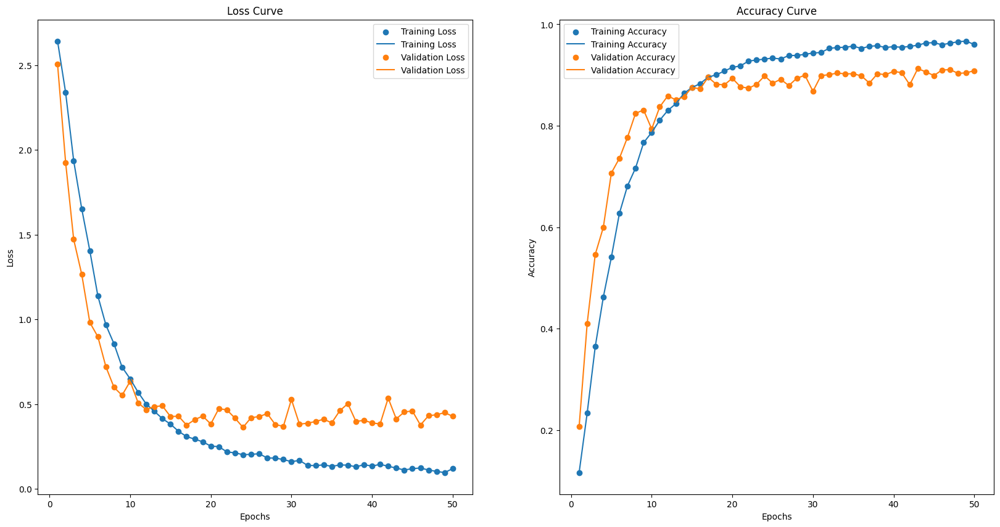

In [65]:
plot_loss_curve(conv2D_31AugmentedHistory)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [66]:
conv2DModel_128Augmented = build_cnn_model_128(X_train_128_aug, NUM_CLASS, model_name="Conv2D_128Augmented")

Model: "Conv2D_128Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128

**FITTING THE DATA TO THE CONV2D MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [67]:
conv2D_128AugmentedHistory = conv2DModel_128Augmented.fit(X_train_128_aug, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 6s 12ms/step - loss: 2.5539 - accuracy: 0.1499 - val_loss: 1.9559 - val_accuracy: 0.4030
Epoch 2/50
448/448 [==============================] - 5s 11ms/step - loss: 1.9724 - accuracy: 0.3574 - val_loss: 1.7035 - val_accuracy: 0.4477
Epoch 3/50
448/448 [==============================] - 5s 11ms/step - loss: 1.3869 - accuracy: 0.5546 - val_loss: 1.0818 - val_accuracy: 0.6647
Epoch 4/50
448/448 [==============================] - 5s 11ms/step - loss: 0.9240 - accuracy: 0.7013 - val_loss: 0.6184 - val_accuracy: 0.8047
Epoch 5/50
448/448 [==============================] - 5s 11ms/step - loss: 0.6358 - accuracy: 0.7940 - val_loss: 0.5708 - val_accuracy: 0.8280
Epoch 6/50
448/448 [==============================] - 5s 11ms/step - loss: 0.4769 - accuracy: 0.8447 - val_loss: 0.4165 - val_accuracy: 0.8703
Epoch 7/50
448/448 [==============================] - 5s 11ms/step - loss: 0.3561 - accuracy: 0.8794 - val_loss: 0.3050 - val_accuracy: 0.9033

**EXTRACT THE TRAINING HISTORY OF THE CONV2D MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CONV2D model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [68]:
conv2D_128AugmentedHistory = conv2D_128AugmentedHistory.history

In [69]:
# Get model results
result_df = compile_results(conv2D_128AugmentedHistory, "Conv2DModel_128Augmented", 32, result_df) 
display(result_df.iloc[7])

Model Name           Conv2DModel_128Augmented
Epochs                                     45
Batch Size                                 32
Train Loss                           0.043292
Val Loss                             0.216016
Train Acc                            0.987155
Val Acc                              0.953333
[Train - Val] Acc                    0.033822
Name: 7, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we see that the model managed to generalize well to validation data and did not overfit much with only a 0.03 gap between training and validation accuracy.
- However, it performed slightly worse than unaugmented data, with a very small gap in validation accuracy of 0.004. This shows that unaugmented data also performed better for Conv2D Model.

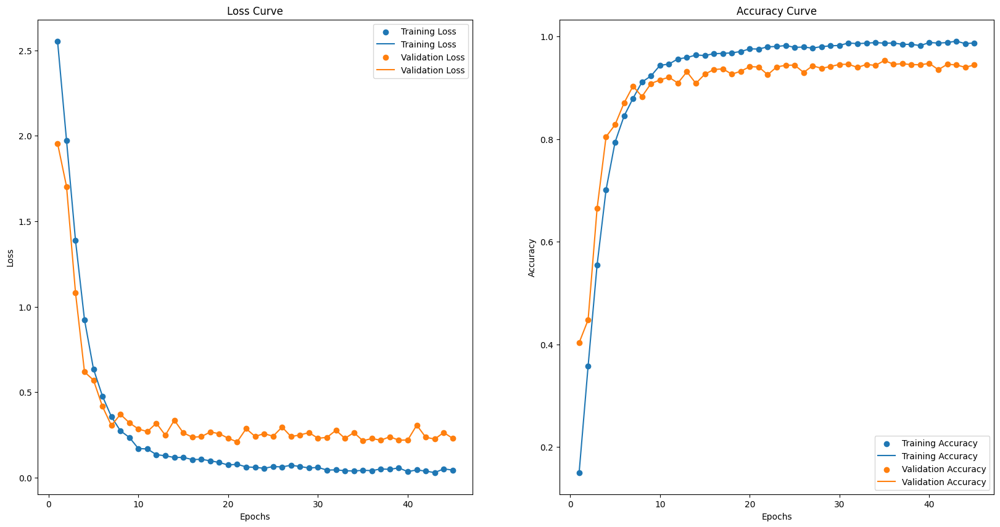

In [70]:
plot_loss_curve(conv2D_128AugmentedHistory)
plt.show()

### CONCLUSIONS MADE FROM THE CONV2D MODEL

From the Conv2D model for both image sizes,


Image Size with Higher Validation Accuracy & Lower Loss : 128 x 128 px Images + No Augmentation 

Augmented Vs Non-Augmented Data : Non-Augmented Data performed better for this model due to it being able to achieve higher validation accuracies and achieve lower losses, indicating that original + oversampled image data actually managed to generalize better to the data. However, to confirm if this is the case for all case scenarios, we will continue testing on other models.

### MODEL 3 : CUSTOMVGG MODEL

- VGG-16 is a convolutional neural network that is 16 layers deep. However, we will be modifying + simplifying the architecture and redesigning it such that it is able to fit our dataset.
- Since VGG-16 is a complex and extremely deep architecture, it will not be able to perform well on such a small dataset of 15 classes. Hence, we customized the model to better fit our dataset and needs.

**BUILDING THE CUSTOMVGG MODEL**

For our modified VGG model, the VGG network is built based on blocks. Each block contains 2/3 layers of Conv2D and a MaxPooling2D layer. We will also be applying BatchNormalization() to the block. After the main VGG block has been created, there is a GlobalAveragePooling2D(), and one Dense layer with relu activation function, before dropout and then the output layer.

In [71]:
def vgg_block(num_convs, num_channels):
    block = Sequential()
    for _ in range(num_convs):
        block.add(Conv2D(num_channels, kernel_size=3, padding='same', activation='relu'))
        block.add(BatchNormalization())   
    block.add(MaxPool2D(pool_size = 2, strides = 2))
    return block

### TRAINING CUSTOMVGG MODEL WITHOUT DATA AUGMENTATION

To train the CustomVGG model, we will first use our unaugmented data to train and fit the model. For this model, we will continue testing with both image sizes and augmented V.S. unaugmented data.

**IMAGE SIZE : 31 X 31 PX**

In [72]:
# Building the CustomVGG Model - Without Data Augmentation

# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_31.shape[1], X_train_31.shape[2],X_train_31.shape[3])
inputs = Input(shape=input_shape)

# Building the model
x = vgg_block(2, 32)(inputs)  # Use less filters compared to VGG16
x = vgg_block(2, 64)(x)
x = vgg_block(2, 128)(x)  # Reduced depth and number of filters
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)  # Output layer for 15 classes

# Creating the model
customVGGModel_31 = Model(inputs=inputs, outputs=x, name='CustomVGG_31')

# Compiling the model
customVGGModel_31.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

customVGGModel_31.summary()

Model: "CustomVGG_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 sequential (Sequential)     (None, 15, 15, 32)        9824      
                                                                 
 sequential_1 (Sequential)   (None, 7, 7, 64)          55936     
                                                                 
 sequential_2 (Sequential)   (None, 3, 3, 128)         222464    
                                                                 
 global_average_pooling2d (G  (None, 128)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               33024     
                                                      

**FITTING THE DATA TO THE CUSTOMVGG MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [73]:
customVGG_31History = customVGGModel_31.fit(X_train_31, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 5s 9ms/step - loss: 1.3451 - accuracy: 0.5630 - val_loss: 3.3539 - val_accuracy: 0.2260
Epoch 2/50
448/448 [==============================] - 4s 8ms/step - loss: 0.5786 - accuracy: 0.8118 - val_loss: 0.9585 - val_accuracy: 0.7067
Epoch 3/50
448/448 [==============================] - 4s 8ms/step - loss: 0.3339 - accuracy: 0.8938 - val_loss: 0.8140 - val_accuracy: 0.7497
Epoch 4/50
448/448 [==============================] - 4s 8ms/step - loss: 0.2158 - accuracy: 0.9284 - val_loss: 0.5879 - val_accuracy: 0.8263
Epoch 5/50
448/448 [==============================] - 4s 8ms/step - loss: 0.1333 - accuracy: 0.9586 - val_loss: 0.4883 - val_accuracy: 0.8687
Epoch 6/50
448/448 [==============================] - 4s 9ms/step - loss: 0.0925 - accuracy: 0.9694 - val_loss: 0.3855 - val_accuracy: 0.8913
Epoch 7/50
448/448 [==============================] - 4s 8ms/step - loss: 0.0724 - accuracy: 0.9770 - val_loss: 0.7984 - val_accuracy: 0.8003
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMVGG MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CustomVGG model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [74]:
customVGG_31History = customVGG_31History.history

In [75]:
# Get model results
result_df = compile_results(customVGG_31History, "customVGGModel_31", 32, result_df)
display(result_df.iloc[8])

Model Name           customVGGModel_31
Epochs                              35
Batch Size                          32
Train Loss                    0.005419
Val Loss                      0.161012
Train Acc                     0.998394
Val Acc                       0.962667
[Train - Val] Acc             0.035728
Name: 8, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we can see that compared to the earlier two models, VGG actually performed really well with a validation loss of only 0.16 and accuracy of 0.96, indicating that our custom VGG model for 31 x 31 px images performed well on this model.

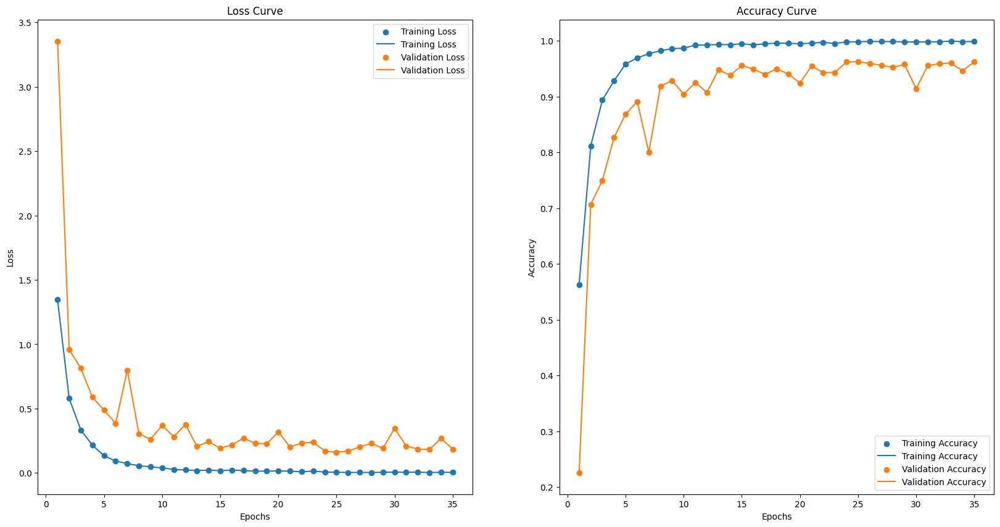

In [76]:
# Plot the loss and accuracy curve
plot_loss_curve(customVGG_31History)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [77]:
# Building the CustomVGG Model - Without Data Augmentation

# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_128.shape[1], X_train_128.shape[2],X_train_128.shape[3])
inputs = Input(shape=input_shape)

# Building the model
x = vgg_block(2, 32)(inputs) # Use less filters compared to VGG16
x = vgg_block(2, 64)(x)
x = vgg_block(2, 256)(x)
x = GlobalAveragePooling2D()(x)
x = Dense(256, 'relu')(x)
x = Dropout(0.3)(x)
x = Dense(NUM_CLASS, 'softmax')(x)

# Creating the model
customVGGModel_128 = Model(inputs=inputs, outputs=x, name='CustomVGG_128')

# Compiling the model
customVGGModel_128.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

customVGGModel_128.summary()

Model: "CustomVGG_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 sequential (Sequential)     (None, 64, 64, 32)        9824      
                                                                 
 sequential_1 (Sequential)   (None, 32, 32, 64)        55936     
                                                                 
 sequential_2 (Sequential)   (None, 16, 16, 256)       739840    
                                                                 
 global_average_pooling2d (G  (None, 256)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               65792     
                                                     

**FITTING THE DATA TO THE CUSTOMVGG MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [78]:
customVGG_128History = customVGGModel_128.fit(X_train_128, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 16s 33ms/step - loss: 1.2935 - accuracy: 0.5886 - val_loss: 3.2591 - val_accuracy: 0.2140
Epoch 2/50
448/448 [==============================] - 14s 30ms/step - loss: 0.5626 - accuracy: 0.8214 - val_loss: 4.7165 - val_accuracy: 0.3513
Epoch 3/50
448/448 [==============================] - 14s 31ms/step - loss: 0.3272 - accuracy: 0.8978 - val_loss: 0.7192 - val_accuracy: 0.8113
Epoch 4/50
448/448 [==============================] - 14s 32ms/step - loss: 0.2216 - accuracy: 0.9328 - val_loss: 10.4064 - val_accuracy: 0.2087
Epoch 5/50
448/448 [==============================] - 14s 31ms/step - loss: 0.1523 - accuracy: 0.9535 - val_loss: 0.5569 - val_accuracy: 0.8493
Epoch 6/50
448/448 [==============================] - 14s 31ms/step - loss: 0.1149 - accuracy: 0.9662 - val_loss: 1.2953 - val_accuracy: 0.7037
Epoch 7/50
448/448 [==============================] - 14s 31ms/step - loss: 0.0854 - accuracy: 0.9740 - val_loss: 0.6285 - val_accuracy

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMVGG MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CustomVGG model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [79]:
customVGG_128History = customVGG_128History.history

In [80]:
# Get model results
result_df = compile_results(customVGG_128History, "customVGGModel_128", 32, result_df)
display(result_df.iloc[9])

Model Name           customVGGModel_128
Epochs                               50
Batch Size                           32
Train Loss                     0.001637
Val Loss                        0.02503
Train Acc                      0.999791
Val Acc                        0.993667
[Train - Val] Acc              0.006124
Name: 9, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, although we see some irregularities in the validation curve at the start, we see that it started to become less extreme as it progressed and became more stable.
- This model performed extremely well on 128 x 128 images, as it managed to achieve a validation loss of 0.02, and a validation accuracy of 0.99, indicating that the custom VGG model generalized very well to unseen data and is able to make accurate predictions.

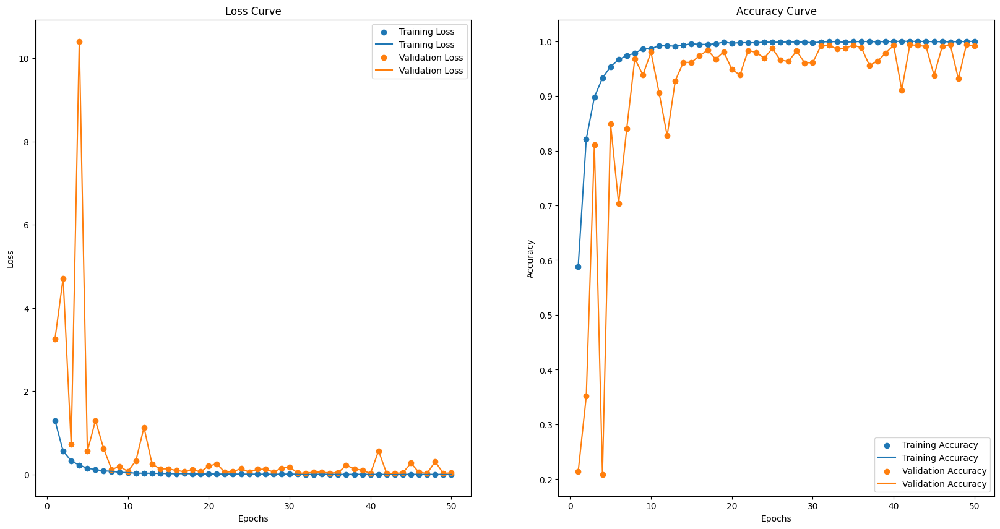

In [81]:
# Plot the loss and accuracy curve
plot_loss_curve(customVGG_128History)
plt.show()

### APPLYING L2 REGULARIZATION TO CUSTOMVGG 

- We will be testing the unaugmented data with L2 regularization to see if it will help further reduce the overfit of the model and improve scores obtained.
- This is done because of the irregularity we see in the curves earlier, and we want to assess if regularization is able to reduce the irregular shape.

#### WHY USE L2 REGULARIZATION?

- L2 Regularization is more effective in managing overfitting as it shrinks the coefficients towards zero, allowing the model to retain all its features but with reduced magnitudes. L2 is also more computationally efficient due to its differentiable and quadratic nature, hence L2 is generally preferred over L1 Regularization due to its simplicity yet effective nature.

### PERFORMING REGULARIZATION WITH 31PX IMAGES

**REGULARIZATION : L2 LASSO REGULARIZATION** |
**IMAGE SIZE : 31 X 31 PX**

- For our regularized VGG Block, we apply weight_decay of 1e - 4 to try and reduce overfitting on the model and help improve the generalization capabilities of the model even further.

In [82]:
def vgg_blockL2(num_convs, num_channels, dropout_rate=0.3, weight_decay=1e-4):
    block = Sequential()
    for _ in range(num_convs):
        block.add(Conv2D(num_channels, kernel_size=3, padding='same', activation='relu', kernel_regularizer=l2(weight_decay)))
        block.add(BatchNormalization())   
    block.add(MaxPool2D(pool_size = 2, strides = 2))
    if dropout_rate > 0:
        block.add(Dropout(dropout_rate))
    return block

In [83]:
# Building the L2 CustomVGG Model - Without Data Augmentation

# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_31.shape[1], X_train_31.shape[2],X_train_31.shape[3])
inputs = Input(shape=input_shape)

# Building the model
weight_decay = 1e-4
x = vgg_blockL2(2, 32, dropout_rate=0.3)(inputs)
x = vgg_blockL2(2, 64, dropout_rate=0.3)(x)
x = vgg_blockL2(3, 128, dropout_rate=0.4)(x)
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(weight_decay))(x)
x = Dropout(0.5)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)

# Creating the model
customVGGModelL2_31 = Model(inputs=inputs, outputs=x, name='CustomVGGL2_31')

# Compiling the model
customVGGModelL2_31.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

customVGGModelL2_31.summary()

Model: "CustomVGGL2_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 sequential (Sequential)     (None, 15, 15, 32)        9824      
                                                                 
 sequential_1 (Sequential)   (None, 7, 7, 64)          55936     
                                                                 
 sequential_2 (Sequential)   (None, 3, 3, 128)         370560    
                                                                 
 global_average_pooling2d (G  (None, 128)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               33024     
                                                    

**FITTING THE DATA TO THE CUSTOMVGG MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [84]:
customVGGL2_31History = customVGGModelL2_31.fit(X_train_31, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks= EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 6s 11ms/step - loss: 1.8313 - accuracy: 0.4305 - val_loss: 2.4550 - val_accuracy: 0.3063
Epoch 2/50
448/448 [==============================] - 5s 10ms/step - loss: 1.1495 - accuracy: 0.6545 - val_loss: 0.9878 - val_accuracy: 0.7150
Epoch 3/50
448/448 [==============================] - 5s 10ms/step - loss: 0.8794 - accuracy: 0.7432 - val_loss: 1.2305 - val_accuracy: 0.6637
Epoch 4/50
448/448 [==============================] - 5s 10ms/step - loss: 0.7322 - accuracy: 0.7957 - val_loss: 0.5892 - val_accuracy: 0.8480
Epoch 5/50
448/448 [==============================] - 5s 10ms/step - loss: 0.5866 - accuracy: 0.8410 - val_loss: 0.5956 - val_accuracy: 0.8430
Epoch 6/50
448/448 [==============================] - 5s 10ms/step - loss: 0.5072 - accuracy: 0.8696 - val_loss: 0.6388 - val_accuracy: 0.8393
Epoch 7/50
448/448 [==============================] - 5s 10ms/step - loss: 0.4443 - accuracy: 0.8911 - val_loss: 0.5394 - val_accuracy: 0.8653

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMVGG MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CustomVGG model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [85]:
customVGGL2_31History = customVGGL2_31History.history

In [86]:
# Get model results
result_df = compile_results(customVGGL2_31History, "customVGGL2Model_31", 32, result_df)
display(result_df.iloc[10])

Model Name           customVGGL2Model_31
Epochs                                50
Batch Size                            32
Train Loss                      0.166368
Val Loss                        0.273309
Train Acc                       0.990506
Val Acc                         0.966667
[Train - Val] Acc               0.023839
Name: 10, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we can see that applying L2 regularization did help the model stabilize, but at the cost of a lower training accuracy, and since we want the training accuracy to be as high as possible (as well as validation), we say that this model did not perform as well as the original VGG model for 31 x 31 px.

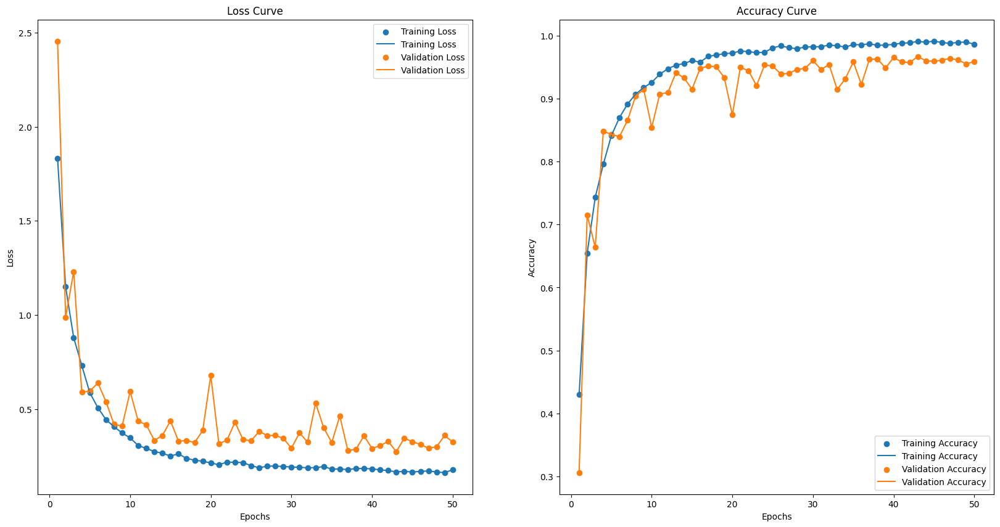

In [87]:
# Plot the loss and accuracy curve
plot_loss_curve(customVGGL2_31History)
plt.show()

### PERFORMING REGULARIZATION WITH 128 PX SIZED IMAGES

**REGULARIZATION : L2 RIDGE REGULARIZATION** |
**IMAGE SIZE : 128 X 128 PX**

In [88]:
# Building the L2 CustomVGG Model - Without Data Augmentation

# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_128.shape[1], X_train_128.shape[2],X_train_128.shape[3])
inputs = Input(shape=input_shape)

# Building the model
weight_decay = 1e-4
x = vgg_blockL2(2, 32, dropout_rate=0.3)(inputs)
x = vgg_blockL2(2, 64, dropout_rate=0.3)(x)
x = vgg_blockL2(3, 256, dropout_rate=0.4)(x)
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(weight_decay))(x)
x = Dropout(0.5)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)

# Creating the model
customVGGModelL2_128 = Model(inputs=inputs, outputs=x, name='CustomVGGL2_128')

# Compiling the model
customVGGModelL2_128.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

customVGGModelL2_128.summary()

Model: "CustomVGGL2_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 sequential (Sequential)     (None, 64, 64, 32)        9824      
                                                                 
 sequential_1 (Sequential)   (None, 32, 32, 64)        55936     
                                                                 
 sequential_2 (Sequential)   (None, 16, 16, 256)       1330944   
                                                                 
 global_average_pooling2d (G  (None, 256)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               65792     
                                                   

**FITTING THE DATA TO THE CUSTOMVGG MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [89]:
customVGGL2_128History = customVGGModelL2_128.fit(X_train_128, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 18s 39ms/step - loss: 1.6708 - accuracy: 0.4958 - val_loss: 4.3749 - val_accuracy: 0.2290
Epoch 2/50
448/448 [==============================] - 17s 38ms/step - loss: 0.9447 - accuracy: 0.7341 - val_loss: 6.2123 - val_accuracy: 0.1887
Epoch 3/50
448/448 [==============================] - 17s 38ms/step - loss: 0.6774 - accuracy: 0.8193 - val_loss: 2.8073 - val_accuracy: 0.5180
Epoch 4/50
448/448 [==============================] - 17s 38ms/step - loss: 0.5278 - accuracy: 0.8686 - val_loss: 0.6849 - val_accuracy: 0.8407
Epoch 5/50
448/448 [==============================] - 17s 38ms/step - loss: 0.4064 - accuracy: 0.9077 - val_loss: 0.6697 - val_accuracy: 0.8377
Epoch 6/50
448/448 [==============================] - 17s 38ms/step - loss: 0.3346 - accuracy: 0.9340 - val_loss: 1.9455 - val_accuracy: 0.6433
Epoch 7/50
448/448 [==============================] - 17s 38ms/step - loss: 0.2883 - accuracy: 0.9478 - val_loss: 0.7041 - val_accuracy:

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMVGG MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CustomVGG model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [90]:
customVGGL2_128History = customVGGL2_128History.history

In [91]:
# Get model results
result_df = compile_results(customVGGL2_128History, "customVGGL2Model_128", 32, result_df)
display(result_df.iloc[11])

Model Name           customVGGL2Model_128
Epochs                                 35
Batch Size                             32
Train Loss                       0.130412
Val Loss                         0.146854
Train Acc                        0.993508
Val Acc                          0.988333
[Train - Val] Acc                0.005175
Name: 11, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we can see that despite applying regularization, the validation curve is still irregular and achieved slightly lower validation accuracy than the original VGG model for 128 x 128 px images.

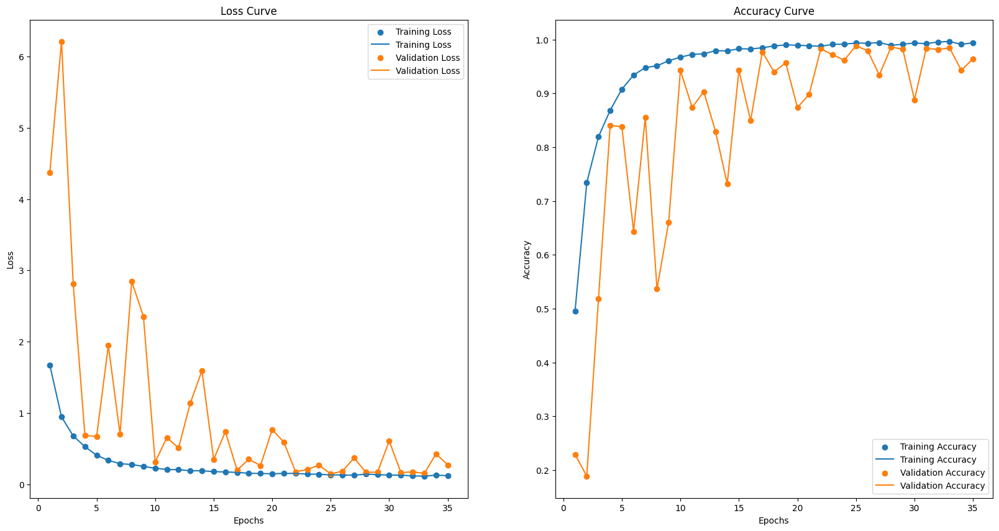

In [92]:
# Plot the loss and accuracy curve
plot_loss_curve(customVGGL2_128History)
plt.show()

### TRAINING CUSTOMVGG MODEL WITH DATA AUGMENTATION

- Now, we will be re-training the same CustomVGG model with augmented data for both image sizes to see if augmented data can offer better scores compared to regularized, unaugmented data.

**IMAGE SIZE : 31 X 31 PX**

In [93]:
# Building the CustomVGG Model - With Data Augmentation

# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_31.shape[1], X_train_31.shape[2],X_train_31.shape[3])
inputs = Input(shape=input_shape)

# Building the model
x = vgg_block(2, 32)(inputs)  # Use less filters compared to VGG16
x = vgg_block(2, 64)(x)
x = vgg_block(2, 128)(x)  # Reduced depth and number of filters
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)  # Output layer for 15 classes

# Creating the model
customVGGModel_31Augmented = Model(inputs=inputs, outputs=x, name='CustomVGG_31Augmented')

# Compiling the model
customVGGModel_31Augmented.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

customVGGModel_31Augmented.summary()

Model: "CustomVGG_31Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 sequential (Sequential)     (None, 15, 15, 32)        9824      
                                                                 
 sequential_1 (Sequential)   (None, 7, 7, 64)          55936     
                                                                 
 sequential_2 (Sequential)   (None, 3, 3, 128)         222464    
                                                                 
 global_average_pooling2d (G  (None, 128)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               33024     
                                             

**FITTING THE DATA TO THE CUSTOMVGG MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [94]:
customVGGAugmentedHistory_31 = customVGGModel_31Augmented.fit(X_train_31_aug, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 5s 9ms/step - loss: 1.6965 - accuracy: 0.4396 - val_loss: 3.8117 - val_accuracy: 0.2127
Epoch 2/50
448/448 [==============================] - 4s 8ms/step - loss: 0.9224 - accuracy: 0.6933 - val_loss: 1.3928 - val_accuracy: 0.5950
Epoch 3/50
448/448 [==============================] - 4s 8ms/step - loss: 0.6057 - accuracy: 0.7982 - val_loss: 1.7652 - val_accuracy: 0.5317
Epoch 4/50
448/448 [==============================] - 4s 8ms/step - loss: 0.4236 - accuracy: 0.8625 - val_loss: 0.5372 - val_accuracy: 0.8333
Epoch 5/50
448/448 [==============================] - 4s 8ms/step - loss: 0.3124 - accuracy: 0.8971 - val_loss: 0.4906 - val_accuracy: 0.8510
Epoch 6/50
448/448 [==============================] - 4s 8ms/step - loss: 0.2250 - accuracy: 0.9270 - val_loss: 0.4439 - val_accuracy: 0.8710
Epoch 7/50
448/448 [==============================] - 4s 8ms/step - loss: 0.1694 - accuracy: 0.9469 - val_loss: 0.3539 - val_accuracy: 0.9027
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMVGG MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the base model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [95]:
customVGGAugmentedHistory_31 = customVGGAugmentedHistory_31.history

In [96]:
# Get model results
result_df = compile_results(customVGGAugmentedHistory_31, "customVGGModel_31Augmented", 32, result_df)
display(result_df.iloc[12])

Model Name           customVGGModel_31Augmented
Epochs                                       49
Batch Size                                   32
Train Loss                             0.004733
Val Loss                               0.208608
Train Acc                              0.998813
Val Acc                                0.955667
[Train - Val] Acc                      0.043147
Name: 12, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we see that for augmented data, it did not differ much from past VGG curves for 31 x 31 px, but performed slightly worse than the VGG model on the original data with an accuracy of only 0.95.

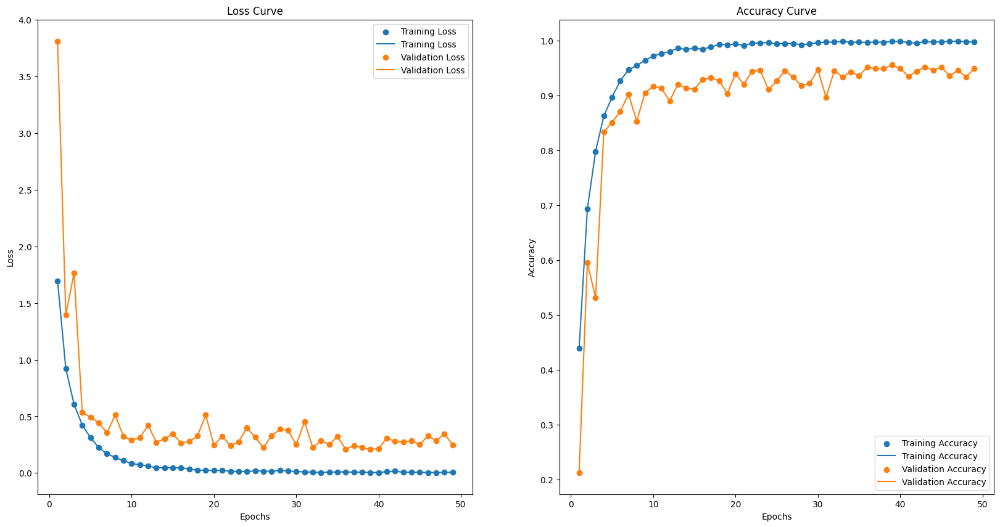

In [97]:
# Plot the loss and accuracy curve
plot_loss_curve(customVGGAugmentedHistory_31)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [98]:
# Building the CustomVGG Model - With Data Augmentation

# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_128.shape[1], X_train_128.shape[2],X_train_128.shape[3])
inputs = Input(shape=input_shape)

# Building the model
x = vgg_block(2, 32)(inputs) # Use less filters compared to VGG16
x = vgg_block(2, 64)(x)
x = vgg_block(2, 256)(x)
x = GlobalAveragePooling2D()(x)
x = Dense(256, 'relu')(x)
x = Dropout(0.3)(x)
x = Dense(NUM_CLASS, 'softmax')(x)

# Creating the model
customVGGModel_128Augmented = Model(inputs=inputs, outputs=x, name='CustomVGG_128Augmented')

# Compiling the model
customVGGModel_128Augmented.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

customVGGModel_128Augmented.summary()

Model: "CustomVGG_128Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 sequential (Sequential)     (None, 64, 64, 32)        9824      
                                                                 
 sequential_1 (Sequential)   (None, 32, 32, 64)        55936     
                                                                 
 sequential_2 (Sequential)   (None, 16, 16, 256)       739840    
                                                                 
 global_average_pooling2d (G  (None, 256)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               65792     
                                            

**FITTING THE DATA TO THE CUSTOMVGG MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [99]:
customVGGAugmentedHistory_128 = customVGGModel_128Augmented.fit(X_train_128_aug, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 15s 31ms/step - loss: 1.5656 - accuracy: 0.4917 - val_loss: 3.0141 - val_accuracy: 0.3297
Epoch 2/50
448/448 [==============================] - 14s 31ms/step - loss: 0.7184 - accuracy: 0.7652 - val_loss: 1.8057 - val_accuracy: 0.5420
Epoch 3/50
448/448 [==============================] - 14s 31ms/step - loss: 0.4340 - accuracy: 0.8628 - val_loss: 1.7334 - val_accuracy: 0.6053
Epoch 4/50
448/448 [==============================] - 14s 31ms/step - loss: 0.2911 - accuracy: 0.9117 - val_loss: 0.7363 - val_accuracy: 0.7757
Epoch 5/50
448/448 [==============================] - 14s 31ms/step - loss: 0.1984 - accuracy: 0.9395 - val_loss: 1.0981 - val_accuracy: 0.7917
Epoch 6/50
448/448 [==============================] - 14s 31ms/step - loss: 0.1762 - accuracy: 0.9454 - val_loss: 0.6095 - val_accuracy: 0.8160
Epoch 7/50
448/448 [==============================] - 14s 31ms/step - loss: 0.1181 - accuracy: 0.9647 - val_loss: 1.6285 - val_accuracy:

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMVGG MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the CustomVGG model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [100]:
customVGGAugmentedHistory_128 = customVGGAugmentedHistory_128.history

In [101]:
# Get model results
result_df = compile_results(customVGGAugmentedHistory_128, "customVGG_128Augmented", 32, result_df)
display(result_df.iloc[13])

Model Name           customVGG_128Augmented
Epochs                                   23
Batch Size                               32
Train Loss                         0.032988
Val Loss                           0.041952
Train Acc                          0.991483
Val Acc                               0.988
[Train - Val] Acc                  0.003483
Name: 13, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we see that on augmented data, the validation curves fluctuate significantly, but still managed to achieve a high validation accuracy of 98%, and a low validation loss of 0.04%, although not as good as original data, performed very well regardless.

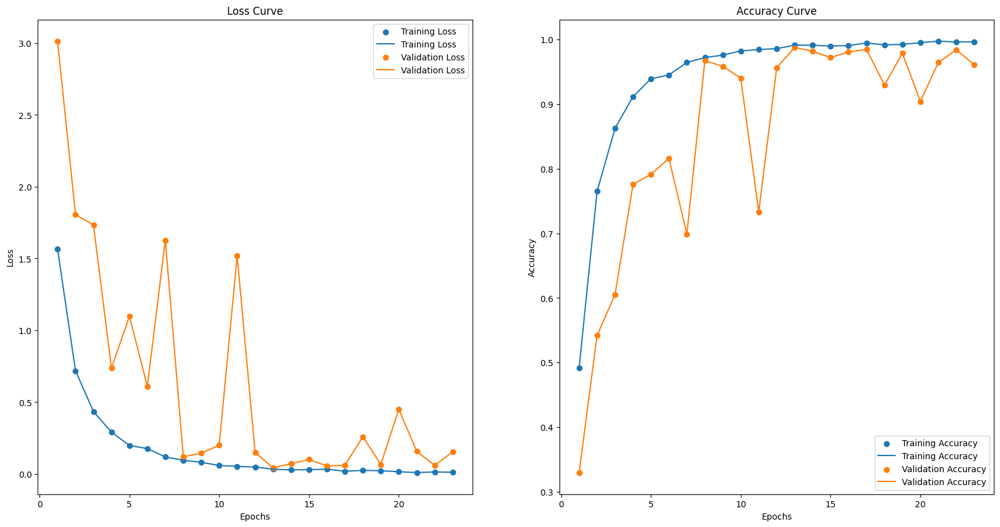

In [102]:
# Plot the loss and accuracy curve
plot_loss_curve(customVGGAugmentedHistory_128)
plt.show()

### CONCLUSIONS MADE FROM THE CUSTOMVGG MODEL

From the CustomVGG model for both image sizes,

Image Size with Higher Validation Accuracy & Lower Loss : 128 X 128 PX Images + Non-Augmented Data + No Regularization

Regularized Vs Non-Regularized Data : Non-Regularized Data managed to achieve higher training and validation accuracies overall, hence we can conclude tha

Augmented Vs Non-Augmented Data : Non-Augmented Data performed better for this model as well for its respective image sizes, consistently proving that augmentation barely helps the model in generalizing better to unseen data.

### MODEL 4 : CUSTOMALEXNET MODEL

The AlexNet model (CUSTOM), adapted for smaller grayscale images, features a simplified architecture tailored to the specific needs of the 31x31 and 128x128 pixel dataset. 

- **Input Layer**: The input layer is designed to fit 31x31 and 128x128 pixel grayscale images, with the shape `(31, 31, 1)` and `(128, 128, 1)`.
<br>
- **Compilation**: The model is compiled with the SGD optimizer, with a learning rate of 0.01 and momentum of 0.9. The loss function used is `categorical_crossentropy`, suitable for multi-class classification tasks. The model's performance is evaluated using the `accuracy` metric.

This model is a streamlined version of the traditional AlexNet, optimized for the simpler task of classifying small grayscale images, and is expected to offer a better balance between efficiency and accuracy.

### TRAINING CUSTOMALEXNET MODEL WITHOUT DATA AUGMENTATION

To train the CustomAlexNet model, we will first use our unaugmented data to train and fit the model. For this model, we will continue testing with both image sizes and augmented V.S. unaugmented data.

**IMAGE SIZE : 31 X 31 PX**

In [103]:
# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_31.shape[1], X_train_31.shape[2], X_train_31.shape[3])
inputs = Input(shape=input_shape)

# AlexNet-like model adapted for 31x31x1 images
x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)

# Creating the model
customAlexNetModel_31 = Model(inputs=inputs, outputs=x, name='CustomAlexNet_31')

# Compiling the model
customAlexNetModel_31.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Model Summary
customAlexNetModel_31.summary()

Model: "CustomAlexNet_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 31, 31, 32)        320       
                                                                 
 batch_normalization (BatchN  (None, 31, 31, 32)       128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 15, 15, 64)  

**FITTING THE DATA TO THE CUSTOMALEXNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [104]:
customAlexNet31History = customAlexNetModel_31.fit(X_train_31, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 6ms/step - loss: 1.8808 - accuracy: 0.4166 - val_loss: 1.6473 - val_accuracy: 0.4973
Epoch 2/50
448/448 [==============================] - 3s 6ms/step - loss: 1.1882 - accuracy: 0.6170 - val_loss: 2.2161 - val_accuracy: 0.4340
Epoch 3/50
448/448 [==============================] - 3s 6ms/step - loss: 0.8814 - accuracy: 0.7121 - val_loss: 1.8290 - val_accuracy: 0.5427
Epoch 4/50
448/448 [==============================] - 3s 6ms/step - loss: 0.6421 - accuracy: 0.7915 - val_loss: 1.0720 - val_accuracy: 0.7180
Epoch 5/50
448/448 [==============================] - 3s 6ms/step - loss: 0.5102 - accuracy: 0.8336 - val_loss: 0.4696 - val_accuracy: 0.8593
Epoch 6/50
448/448 [==============================] - 3s 6ms/step - loss: 0.4104 - accuracy: 0.8675 - val_loss: 0.7938 - val_accuracy: 0.7717
Epoch 7/50
448/448 [==============================] - 3s 6ms/step - loss: 0.3299 - accuracy: 0.8914 - val_loss: 0.5612 - val_accuracy: 0.8530
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMALEXNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the AlexNet model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [105]:
customAlexNet31History = customAlexNet31History.history

In [106]:
# Get model results
result_df = compile_results(customAlexNet31History, "customAlexNet_31", 32, result_df)
display(result_df.iloc[14])

Model Name           customAlexNet_31
Epochs                             35
Batch Size                         32
Train Loss                   0.063484
Val Loss                     0.382737
Train Acc                     0.97808
Val Acc                         0.922
[Train - Val] Acc             0.05608
Name: 14, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we can see that there the training loss steadily decrases, indicating that the model is learning and improving its performance on the training dataset over time.
- There is significant volatility in the validation loss, with occasional spikes suggesting that the model may be overfitting to the training data.
- Hence, we will experiment with augmented data later and evaluate if augmentation is able to reduce this volatility.

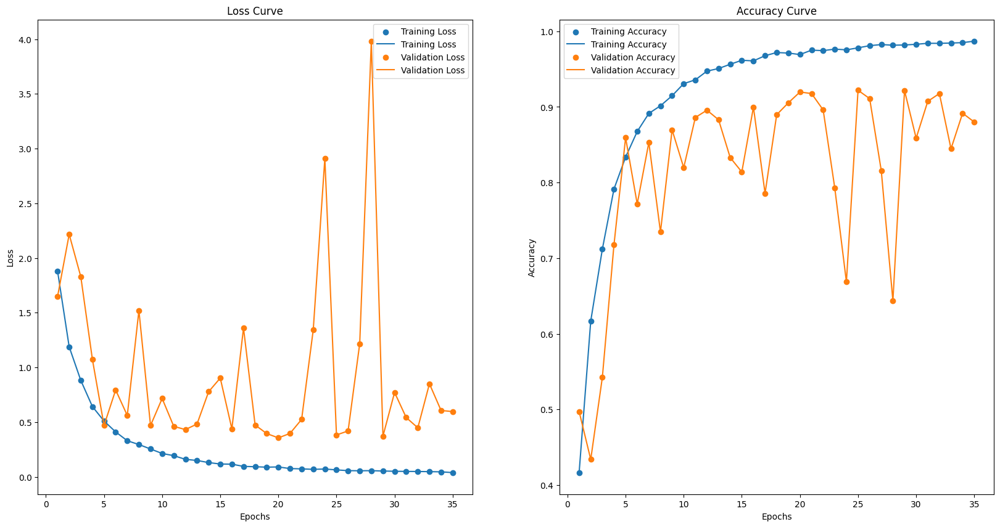

In [107]:
# Plot the loss and accuracy curve
plot_loss_curve(customAlexNet31History)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [108]:
# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_128.shape[1], X_train_128.shape[2], X_train_128.shape[3])
inputs = Input(shape=input_shape)

# AlexNet-like model adapted for 128x128x1 images
x = Conv2D(64, (11, 11), strides=(4, 4), activation='relu', padding='same')(inputs)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

x = Conv2D(192, (5, 5), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

x = Conv2D(384, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

x = Flatten()(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)  # Update NUM_CLASS as per your dataset

# Creating the model
customAlexNetModel_128 = Model(inputs=inputs, outputs=x, name='CustomAlexNet_128')

# Compiling the model
customAlexNetModel_128.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Model Summary
customAlexNetModel_128.summary()

Model: "CustomAlexNet_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        7808      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 192)       307392    
                                                                 
 batch_normalization_1 (Batc  (None, 15, 15, 192)

**FITTING THE DATA TO THE CUSTOMALEXNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [109]:
customAlexNet128History = customAlexNetModel_128.fit(X_train_128, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 7s 13ms/step - loss: 2.9233 - accuracy: 0.2636 - val_loss: 1.9747 - val_accuracy: 0.3697
Epoch 2/50
448/448 [==============================] - 5s 12ms/step - loss: 1.6290 - accuracy: 0.5017 - val_loss: 1.4045 - val_accuracy: 0.5687
Epoch 3/50
448/448 [==============================] - 5s 12ms/step - loss: 1.0821 - accuracy: 0.6723 - val_loss: 0.8384 - val_accuracy: 0.7400
Epoch 4/50
448/448 [==============================] - 5s 11ms/step - loss: 0.7566 - accuracy: 0.7703 - val_loss: 5.3130 - val_accuracy: 0.2160
Epoch 5/50
448/448 [==============================] - 5s 11ms/step - loss: 0.5436 - accuracy: 0.8309 - val_loss: 0.8778 - val_accuracy: 0.7347
Epoch 6/50
448/448 [==============================] - 5s 11ms/step - loss: 0.4173 - accuracy: 0.8696 - val_loss: 4.3941 - val_accuracy: 0.3263
Epoch 7/50
448/448 [==============================] - 5s 11ms/step - loss: 0.2981 - accuracy: 0.9084 - val_loss: 0.7188 - val_accuracy: 0.8060

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMALEXNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the AlexNet model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [110]:
customAlexNet128History = customAlexNet128History.history

In [111]:
# Get model results
result_df = compile_results(customAlexNet128History, "customAlexNetModel_128", 32, result_df)
display(result_df.iloc[15])

Model Name           customAlexNetModel_128
Epochs                                   40
Batch Size                               32
Train Loss                         0.022377
Val Loss                           0.238607
Train Acc                            0.9926
Val Acc                            0.951333
[Train - Val] Acc                  0.041267
Name: 15, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- Based on this curve, we see that the validation data for 128 px images may have overfitted slightly on the training data and did not generalize very well to the validation data, hence the irregular spikes in the curves.
- Thus, we will also be looking at augmented data later and evaluate if augmentation can help reduce overfitting.

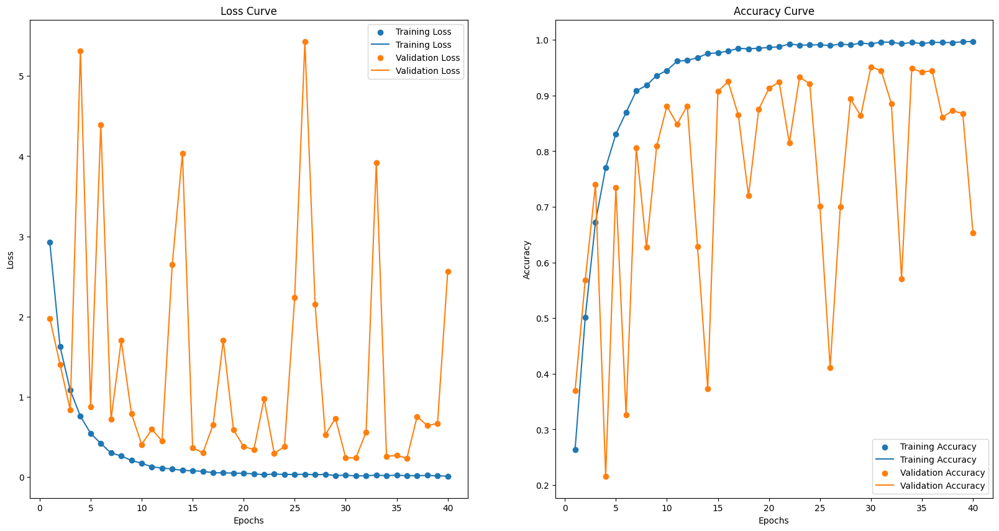

In [112]:
# Plot the loss and accuracy curve
plot_loss_curve(customAlexNet128History)
plt.show()

### TRAINING CUSTOMALEXNET MODEL WITH DATA AUGMENTATION

- Now, we will be re-training the same CustomAlexNet model with augmented data for both image sizes to see if augmented data can offer better scores compared to unaugmented data.

**IMAGE SIZE : 31 X 31 PX**

In [113]:
# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_31.shape[1], X_train_31.shape[2], X_train_31.shape[3])
inputs = Input(shape=input_shape)

# AlexNet-like model adapted for 31x31x1 images
x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)

# Creating the model
customAlexNetModel_31Augmented = Model(inputs=inputs, outputs=x, name='CustomAlexNet_31Augmented')

# Compiling the model
customAlexNetModel_31Augmented.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Model Summary
customAlexNetModel_31Augmented.summary()

Model: "CustomAlexNet_31Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 31, 31, 32)        320       
                                                                 
 batch_normalization (BatchN  (None, 31, 31, 32)       128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 15, 

**FITTING THE DATA TO THE CUSTOMALEXNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [114]:
customAlexNet31AugmentedHistory = customAlexNetModel_31Augmented.fit(X_train_31_aug, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 6ms/step - loss: 2.2768 - accuracy: 0.2760 - val_loss: 1.7300 - val_accuracy: 0.4597
Epoch 2/50
448/448 [==============================] - 3s 6ms/step - loss: 1.7139 - accuracy: 0.4389 - val_loss: 1.5579 - val_accuracy: 0.4917
Epoch 3/50
448/448 [==============================] - 3s 6ms/step - loss: 1.3694 - accuracy: 0.5518 - val_loss: 3.4775 - val_accuracy: 0.3130
Epoch 4/50
448/448 [==============================] - 3s 6ms/step - loss: 1.1289 - accuracy: 0.6350 - val_loss: 2.3431 - val_accuracy: 0.4373
Epoch 5/50
448/448 [==============================] - 3s 6ms/step - loss: 0.9153 - accuracy: 0.6998 - val_loss: 0.7836 - val_accuracy: 0.7513
Epoch 6/50
448/448 [==============================] - 3s 6ms/step - loss: 0.7635 - accuracy: 0.7463 - val_loss: 0.6426 - val_accuracy: 0.8027
Epoch 7/50
448/448 [==============================] - 3s 6ms/step - loss: 0.6472 - accuracy: 0.7844 - val_loss: 0.5340 - val_accuracy: 0.8273
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMALEXNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the AlexNet model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [115]:
customAlexNet31AugmentedHistory = customAlexNet31AugmentedHistory.history

In [116]:
# Get model results
result_df = compile_results(customAlexNet31AugmentedHistory, "customAlexNetModel_31Augmented", 32, result_df)
display(result_df.iloc[15])

Model Name           customAlexNetModel_128
Epochs                                   40
Batch Size                               32
Train Loss                         0.022377
Val Loss                           0.238607
Train Acc                            0.9926
Val Acc                            0.951333
[Train - Val] Acc                  0.041267
Name: 15, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- We can see that with augmentation, the validation curves are slightly smoother, following the training loss and accuracy curves more closely. However, performance-wise, it performed worse than the original data in terms of validation accuracy and being able to obtain a lower validation loss.

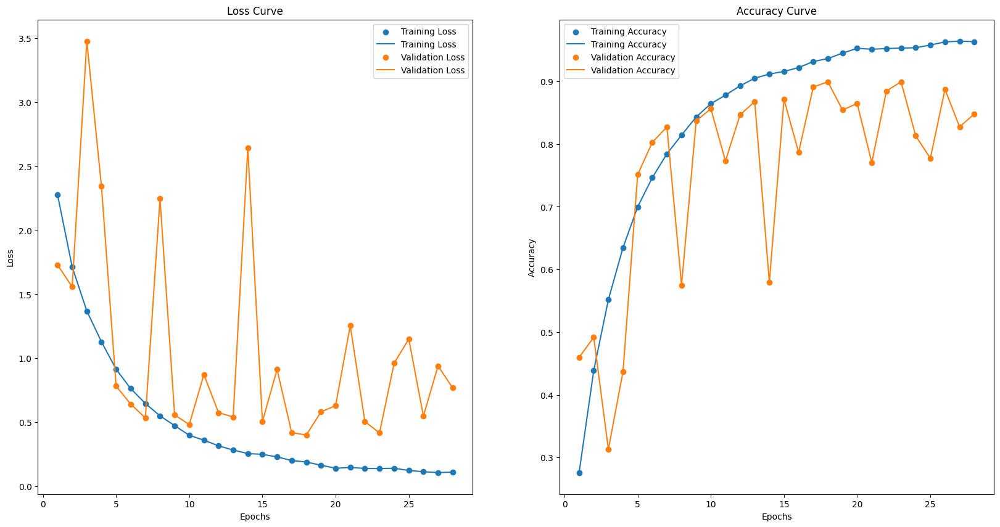

In [117]:
# Plot the loss and accuracy curve
plot_loss_curve(customAlexNet31AugmentedHistory)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [118]:
# Clear the previous tensorflow session
tf.keras.backend.clear_session()

# Define the input shape and create the input tensor
input_shape = (X_train_128.shape[1], X_train_128.shape[2], X_train_128.shape[3])
inputs = Input(shape=input_shape)

# AlexNet-like model adapted for 128x128x1 images
x = Conv2D(64, (11, 11), strides=(4, 4), activation='relu', padding='same')(inputs)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

x = Conv2D(192, (5, 5), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

x = Conv2D(384, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)

x = Flatten()(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(NUM_CLASS, activation='softmax')(x)  # Update NUM_CLASS as per your dataset

# Creating the model
customAlexNetModel_128Augmented = Model(inputs=inputs, outputs=x, name='CustomAlexNet_128Augmented')

# Compiling the model
customAlexNetModel_128Augmented.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Model Summary
customAlexNetModel_128Augmented.summary()

Model: "CustomAlexNet_128Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        7808      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 192)       307392    
                                                                 
 batch_normalization_1 (Batc  (None, 15,

**FITTING THE DATA TO THE CUSTOMALEXNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [119]:
customAlexNet128AugmentedHistory = customAlexNetModel_128Augmented.fit(X_train_128_aug, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 6s 12ms/step - loss: 3.4509 - accuracy: 0.1626 - val_loss: 2.4841 - val_accuracy: 0.2067
Epoch 2/50
448/448 [==============================] - 5s 11ms/step - loss: 2.1487 - accuracy: 0.3170 - val_loss: 1.7935 - val_accuracy: 0.4100
Epoch 3/50
448/448 [==============================] - 5s 11ms/step - loss: 1.6539 - accuracy: 0.4644 - val_loss: 1.7927 - val_accuracy: 0.4240
Epoch 4/50
448/448 [==============================] - 5s 11ms/step - loss: 1.2758 - accuracy: 0.5890 - val_loss: 1.2823 - val_accuracy: 0.5963
Epoch 5/50
448/448 [==============================] - 5s 11ms/step - loss: 0.9781 - accuracy: 0.6852 - val_loss: 7.0295 - val_accuracy: 0.1033
Epoch 6/50
448/448 [==============================] - 5s 12ms/step - loss: 0.7636 - accuracy: 0.7561 - val_loss: 1.1108 - val_accuracy: 0.6883
Epoch 7/50
448/448 [==============================] - 5s 11ms/step - loss: 0.5870 - accuracy: 0.8139 - val_loss: 1.5014 - val_accuracy: 0.6387

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMALEXNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the AlexNet model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [120]:
customAlexNet128AugmentedHistory = customAlexNet128AugmentedHistory.history

In [121]:
# Get model results
result_df = compile_results(customAlexNet128AugmentedHistory, "customAlexNetModel_128Augmented", 32, result_df)
display(result_df.iloc[17])

Model Name           customAlexNetModel_128Augmented
Epochs                                            33
Batch Size                                        32
Train Loss                                  0.058011
Val Loss                                    0.200295
Train Acc                                   0.981571
Val Acc                                     0.950667
[Train - Val] Acc                           0.030904
Name: 17, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- Based on the curves, we can see that the validation curves are definitely less volatile and exhibit a smoother pattern somewhat, and managed to perform better than unaugmented data in terms of achieving a higher validation accuracy by 1%, indicating that in this case, augmented data had an edge over unaugmented data.

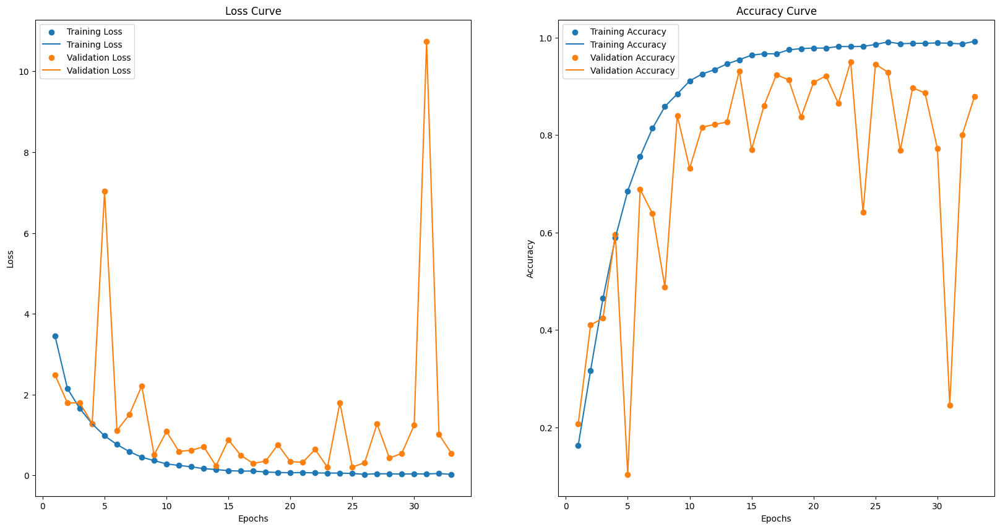

In [122]:
# Plot the loss and accuracy curve
plot_loss_curve(customAlexNet128AugmentedHistory)
plt.show()

### CONCLUSIONS MADE FROM THE CUSTOMALEXNET MODEL

From the CustomAlexNet model for both image sizes,

Image Size with Higher Accuracy & Lower Loss : 128 x 128 PX + Augmented 

Augmented Vs Non-Augmented Data : For this model, we see that augmented data performed better for image size 128px but worse for image size 31px. This could indicate that the variability in augmented data helped the model generalize better by learning more robust feature representations.

However, as to why it performed worse on 31 px images, it could be because augmentation introduces more noise and distorts critical features, making it more difficult for the model to learn from key features in the images.

### MODEL 5 : CUSTOMNET MODEL | SELF-DESIGNED

**Note : This model does not reference / modify any existing architectures and is custom-made purely for this analysis.**

- Aside from the earlier models, this model will apply original architectures and techniques to evaluate how it perfoms against the other models used earlier.
- Some techniques applied here to build the architecture would be testing pooling layers, dropout, testing different activation functions and experimenting with unique number of layers and filter sizes for each image size.


### TRAINING CUSTOMNET MODEL WITHOUT DATA AUGMENTATION

To train the CustomNet model, we will first use our unaugmented data to train and fit the model. For this model, we will still proceed testing with both image sizes and augmented V.S. unaugmented data to find out key differences in performance.

### DEFINE FUNCTION TO CREATE CUSTOMNET MODEL
- This function will be applied throughout to create the custom model.
- For our custom model, we will attempt to experiment with MaxPooling2D(), Dropout to see how our custom model will perform to our other models.

In [123]:
# Defining functions to build models for both input sizes

# Building 31 x 31 px model
def custom_model_31(X_train, NUM_CLASS, model_name):
    tf.keras.backend.clear_session()
    input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
    inputs = Input(shape=input_shape)

    x = Conv2D(16, (3, 3), padding='same', activation='relu')(inputs)
    x = MaxPooling2D(2, 2)(x)
    
    x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D(2, 2)(x)

    x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D(2, 2)(x)
    
    x = Flatten()(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    x = Dense(NUM_CLASS, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=x, name=model_name)
    model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
    model.summary()
    return model

# Building 128 x 128 px model
def custom_model_128(X_train, NUM_CLASS, model_name):
    tf.keras.backend.clear_session()
    input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
    inputs = Input(shape=input_shape)

    x = Conv2D(32, (3, 3), padding='same', activation='relu')(inputs)
    x = MaxPooling2D(2, 2)(x)

    x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D(2, 2)(x)

    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D(2, 2)(x)

    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D(2, 2)(x)

    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(NUM_CLASS, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=x, name=model_name)
    model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
    model.summary()
    return model

### TRAINING CUSTOMNET MODEL WITHOUT DATA AUGMENTATION

- We will first be training our custom model without data augmentation to visualize the accuracies and loss obtained for training and validation.

**IMAGE SIZE : 31 X 31 PX**

In [124]:
custom31 = custom_model_31(X_train_31, NUM_CLASS, model_name="CustomModel31")

Model: "CustomModel31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 31, 31, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64)        

**FITTING THE DATA TO THE CUSTOMNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [125]:
customNet31History = custom31.fit(X_train_31, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 6ms/step - loss: 2.6561 - accuracy: 0.1075 - val_loss: 2.3953 - val_accuracy: 0.2260
Epoch 2/50
448/448 [==============================] - 2s 5ms/step - loss: 2.1864 - accuracy: 0.2931 - val_loss: 1.9194 - val_accuracy: 0.3847
Epoch 3/50
448/448 [==============================] - 2s 5ms/step - loss: 1.6865 - accuracy: 0.4517 - val_loss: 1.3440 - val_accuracy: 0.5693
Epoch 4/50
448/448 [==============================] - 2s 5ms/step - loss: 1.3484 - accuracy: 0.5631 - val_loss: 1.0708 - val_accuracy: 0.6663
Epoch 5/50
448/448 [==============================] - 2s 5ms/step - loss: 1.1050 - accuracy: 0.6457 - val_loss: 1.2579 - val_accuracy: 0.5883
Epoch 6/50
448/448 [==============================] - 2s 5ms/step - loss: 0.9472 - accuracy: 0.6945 - val_loss: 0.7542 - val_accuracy: 0.7637
Epoch 7/50
448/448 [==============================] - 2s 5ms/step - loss: 0.8360 - accuracy: 0.7308 - val_loss: 0.7065 - val_accuracy: 0.7853
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the custom model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [126]:
customNet31History = customNet31History.history

In [127]:
# Get model results
result_df = compile_results(customNet31History, "customModel31", 32, result_df)
display(result_df.iloc[18])

Model Name           customModel31
Epochs                          36
Batch Size                      32
Train Loss                0.252661
Val Loss                  0.386302
Train Acc                 0.915812
Val Acc                   0.897333
[Train - Val] Acc         0.018478
Name: 18, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we can see that our custom model actually generalized well as the validation curves follows the training curves very closely and shows little variation in the patterns. It also managed to achieve a relatively high validation accuracy of around 89%.

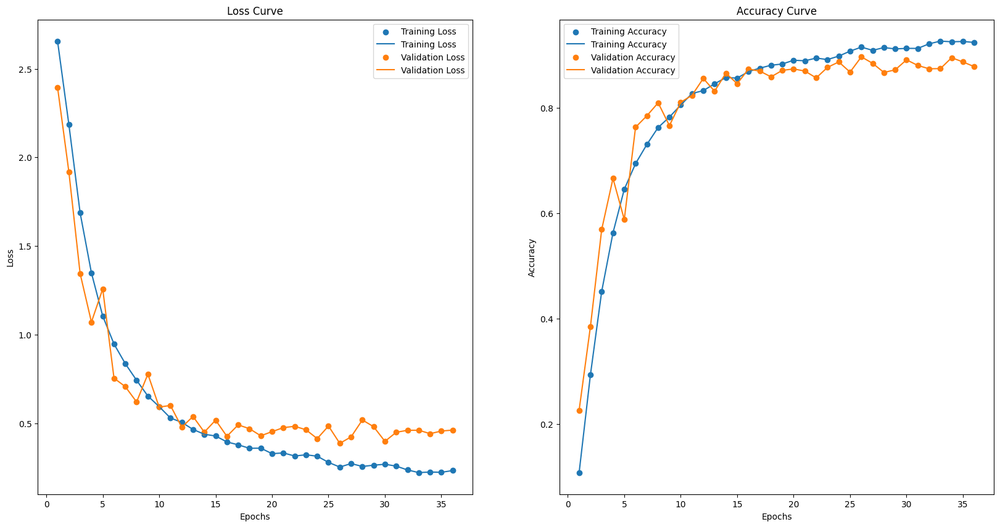

In [128]:
#Plotting the loss and accuracy curve
plot_loss_curve(customNet31History)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [129]:
custom128 = custom_model_128(X_train_128, NUM_CLASS, model_name="CustomModel128")

Model: "CustomModel128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)    

**FITTING THE DATA TO THE CUSTOMNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [130]:
customNet128History = custom128.fit(X_train_128, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 5s 11ms/step - loss: 2.5811 - accuracy: 0.1447 - val_loss: 2.4664 - val_accuracy: 0.1977
Epoch 2/50
448/448 [==============================] - 5s 10ms/step - loss: 1.8590 - accuracy: 0.4131 - val_loss: 1.4473 - val_accuracy: 0.5407
Epoch 3/50
448/448 [==============================] - 5s 10ms/step - loss: 1.0920 - accuracy: 0.6583 - val_loss: 0.7640 - val_accuracy: 0.7833
Epoch 4/50
448/448 [==============================] - 5s 10ms/step - loss: 0.6034 - accuracy: 0.8142 - val_loss: 0.5681 - val_accuracy: 0.8340
Epoch 5/50
448/448 [==============================] - 5s 10ms/step - loss: 0.3672 - accuracy: 0.8845 - val_loss: 0.5495 - val_accuracy: 0.8490
Epoch 6/50
448/448 [==============================] - 5s 10ms/step - loss: 0.2446 - accuracy: 0.9196 - val_loss: 0.5134 - val_accuracy: 0.8660
Epoch 7/50
448/448 [==============================] - 5s 10ms/step - loss: 0.1925 - accuracy: 0.9394 - val_loss: 0.5303 - val_accuracy: 0.8663

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the custom model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [131]:
customNet128History = customNet128History.history

In [132]:
# Get model results
result_df = compile_results(customNet128History, "customModel128", 32, result_df)
display(result_df.iloc[19])

Model Name           customModel128
Epochs                           50
Batch Size                       32
Train Loss                 0.008938
Val Loss                   0.474456
Train Acc                  0.997417
Val Acc                    0.927333
[Train - Val] Acc          0.070084
Name: 19, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we see that our model generalized fairly well to the validation data, as it followed the general pattern of the training curve closely, and only provides a slightly lower validation accuracy and slightly higher validation loss.

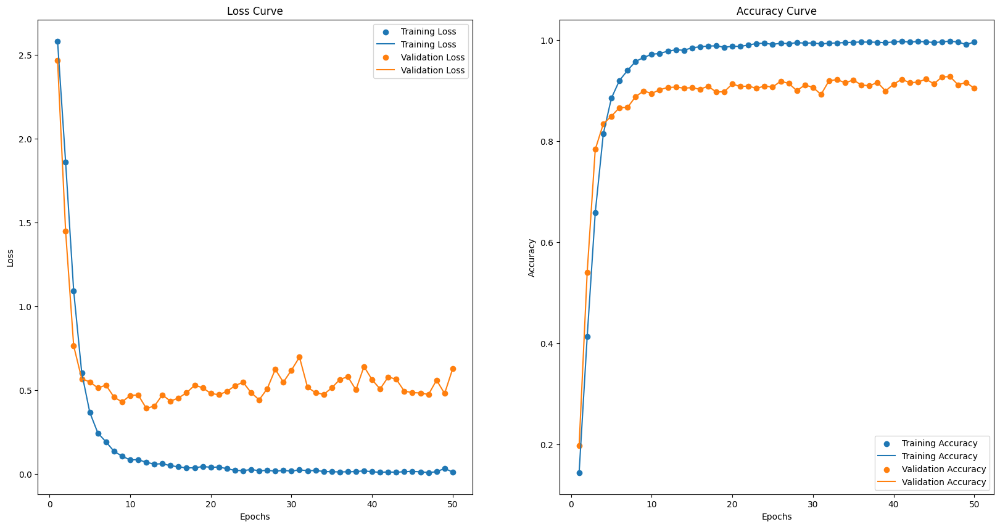

In [133]:
# Plotting the loss and accuracy curve
plot_loss_curve(customNet128History)
plt.show()

### TRAINING CUSTOMNET MODEL WITH DATA AUGMENTATION

- Now, we will be re-training our same custom model with augmented data for both image sizes to see if augmented data can offer better scores compared to unaugmented data.

**IMAGE SIZE : 31 X 31 PX**

In [134]:
custom31Augmented = custom_model_31(X_train_31_aug, NUM_CLASS, model_name="CustomModel31Augmented")

Model: "CustomModel31Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 31, 31, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64

**FITTING THE DATA TO THE CUSTOMNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [135]:
customNet31HistoryAugmented = custom31Augmented.fit(X_train_31_aug, y_train_31, epochs=50, validation_data=(X_val_31, y_val_31), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 3s 6ms/step - loss: 2.6493 - accuracy: 0.0990 - val_loss: 2.4314 - val_accuracy: 0.2130
Epoch 2/50
448/448 [==============================] - 2s 5ms/step - loss: 2.3961 - accuracy: 0.1994 - val_loss: 2.0832 - val_accuracy: 0.3793
Epoch 3/50
448/448 [==============================] - 2s 5ms/step - loss: 2.1159 - accuracy: 0.3005 - val_loss: 1.7185 - val_accuracy: 0.4597
Epoch 4/50
448/448 [==============================] - 2s 5ms/step - loss: 1.9123 - accuracy: 0.3716 - val_loss: 1.5193 - val_accuracy: 0.5160
Epoch 5/50
448/448 [==============================] - 2s 5ms/step - loss: 1.7078 - accuracy: 0.4358 - val_loss: 1.3713 - val_accuracy: 0.5670
Epoch 6/50
448/448 [==============================] - 2s 5ms/step - loss: 1.4893 - accuracy: 0.5096 - val_loss: 1.1271 - val_accuracy: 0.6510
Epoch 7/50
448/448 [==============================] - 2s 5ms/step - loss: 1.3794 - accuracy: 0.5444 - val_loss: 1.0949 - val_accuracy: 0.6640
Epoch 

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the custom model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [136]:
customNet31HistoryAugmented = customNet31HistoryAugmented.history

In [137]:
# Get model results
result_df = compile_results(customNet31HistoryAugmented, "customModel31_Augmented", 32, result_df)
display(result_df.iloc[20])

Model Name           customModel31_Augmented
Epochs                                    50
Batch Size                                32
Train Loss                          0.407583
Val Loss                             0.42153
Train Acc                           0.865759
Val Acc                             0.882333
[Train - Val] Acc                  -0.016574
Name: 20, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we see that with augmentation, there is also not much overfitting on the training data, but the model performed slightly worse than with no augmentation, as it achieved a slightly lower validation score of 88% than the model with no augmentation which achieved a validation score of 89%.

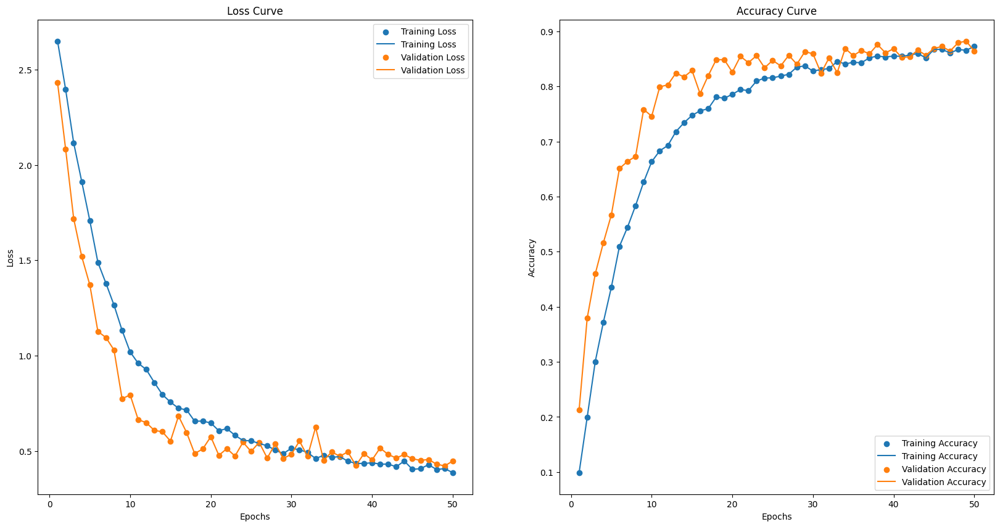

In [138]:
plot_loss_curve(customNet31HistoryAugmented)
plt.show()

**IMAGE SIZE : 128 X 128 PX**

In [139]:
custom128Augmented = custom_model_128(X_train_128_aug, NUM_CLASS, model_name="CustomModel128Augmented")

Model: "CustomModel128Augmented"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32,

**FITTING THE DATA TO THE CUSTOMNET MODEL**

Fit the data using `model.fit`. Apply early stopping to the model as well to try and prevent overfitting of data.

In [140]:
customNet128HistoryAugmented = custom128Augmented.fit(X_train_128_aug, y_train_128, epochs=50, validation_data=(X_val_128, y_val_128), batch_size=32, callbacks=EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True))

Epoch 1/50
448/448 [==============================] - 5s 11ms/step - loss: 2.5530 - accuracy: 0.1461 - val_loss: 2.0046 - val_accuracy: 0.3627
Epoch 2/50
448/448 [==============================] - 5s 11ms/step - loss: 1.9726 - accuracy: 0.3559 - val_loss: 1.4196 - val_accuracy: 0.5703
Epoch 3/50
448/448 [==============================] - 5s 11ms/step - loss: 1.4439 - accuracy: 0.5287 - val_loss: 0.9621 - val_accuracy: 0.7133
Epoch 4/50
448/448 [==============================] - 5s 10ms/step - loss: 0.9413 - accuracy: 0.6947 - val_loss: 0.5701 - val_accuracy: 0.8250
Epoch 5/50
448/448 [==============================] - 5s 11ms/step - loss: 0.6205 - accuracy: 0.8006 - val_loss: 0.4196 - val_accuracy: 0.8713
Epoch 6/50
448/448 [==============================] - 5s 10ms/step - loss: 0.4177 - accuracy: 0.8637 - val_loss: 0.4081 - val_accuracy: 0.8747
Epoch 7/50
448/448 [==============================] - 5s 10ms/step - loss: 0.2849 - accuracy: 0.9073 - val_loss: 0.3724 - val_accuracy: 0.8877

**EXTRACT THE TRAINING HISTORY OF THE CUSTOMNET MODEL INTO A DICTIONARY**

- Use `.history` to extract the training data from the custom model.
- Store the results in a dataframe and use `pd.concat()` to display the results.

In [141]:
customNet128HistoryAugmented = customNet128HistoryAugmented.history

In [142]:
# Get model results
result_df = compile_results(customNet128HistoryAugmented, "customModel128_Augmented", 32, result_df)
display(result_df.iloc[21])

Model Name           customModel128_Augmented
Epochs                                     36
Batch Size                                 32
Train Loss                           0.028265
Val Loss                             0.371045
Train Acc                            0.991134
Val Acc                                 0.933
[Train - Val] Acc                    0.058134
Name: 21, dtype: object

**PLOTTING THE LOSS AND ACCURACY CURVE**

- From the curves, we see that the augmented data performed relatively well on the model, managing to achieve a high validation accuracy of 93% and a relatively low validation loss of 37%. Comparing to the custom model for 128 px image sizes with no augmentation, this actually performed better as it achieved a higher validation accuracy by 1% and lower validation loss by 10%, indicating that augmentation helped the model generalize better to unseen data.

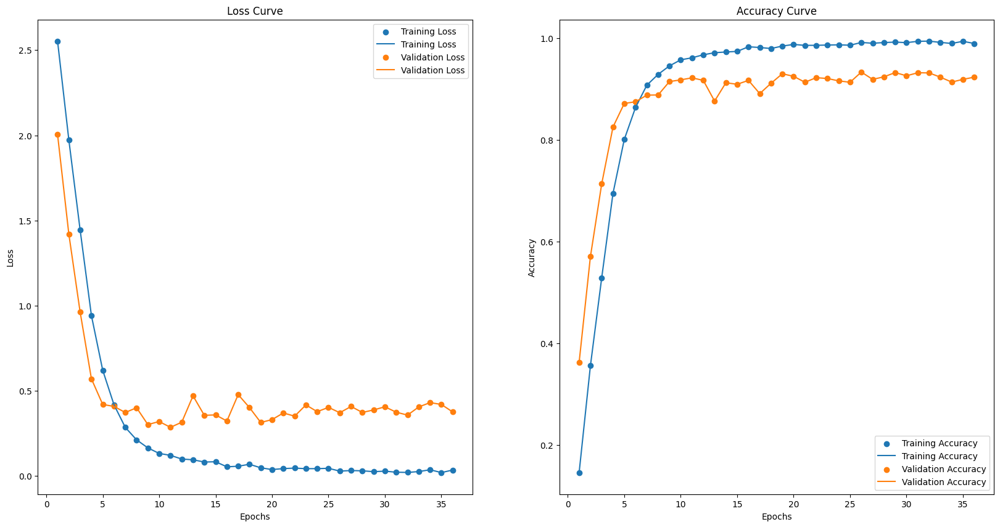

In [143]:
# Plotting the loss and accuracy curve
plot_loss_curve(customNet128HistoryAugmented)
plt.show()

### CONCLUSIONS MADE FROM THE CUSTOMNET MODEL

From the CustomNet model for both image sizes,

Image Size with Higher Accuracy & Lower Loss : 128 X 128 PX + Augmented

Augmented Vs Non-Augmented Data : Similar to AlexNet, augmented data performed better for image size 128px but worse for image size 31px. This could indicate that the variability in augmented data helped the model generalize better by learning more robust feature representations.

### INSIGHTS INTO DATA AUGMENTATION FOR ANALYSIS

- After evaluating the results for all 5 models, we notice a trend in the performance of augmented data.
- For 128 px x 128 px x 1 images, augmented data tends to perform better than unaugmented data (with the exception of VGG, but the performances were close to each other). 
- However, for 31 px x 31 px x 1 images, unaugmented data consistently performed better than augmented data, indicating that due to the pixelated format of 31 px images, augmentation may have introduced irrelevant noise in the dataset, making it difficult for the model to generalize well to the low-resolution features.

**CONCLUSION ON AUGMENTED VS UNAUGMENTED DATA :**

AUGMENTED DATA WORKS **BETTER FOR IMAGES WITH HIGHER RESOLUTION** AND A CLEARER VIEW, BUT WORSE FOR IMAGES WITH LOWER RESOLUTION WITH A PIXELATED VIEW.

### PERFORMING MODEL SELECTION FOR BEST MODEL

- Upon training all the various models, we will be deciding which of the models to hypertune to be our final model.
- We will be selecting the best model for both image sizes : 31px and 128px.

In [144]:
result_df.sort_values(by=["Val Acc", "Train Acc"], ascending=False).style.apply(
    lambda x: [
        "background-color: red; color: white" if v else "" for v in x == x.min()]).apply(
    lambda x: [
        "background-color: green; color: white" if v else "" for v in x == x.max()])

,Model Name,Epochs,Batch Size,Train Loss,Val Loss,Train Acc,Val Acc,[Train - Val] Acc
9,customVGGModel_128,50,32,0.001637,0.025030,0.999791,0.993667,0.006124
13,customVGG_128Augmented,23,32,0.032988,0.041952,0.991483,0.988000,0.003483
11,customVGGL2Model_128,35,32,0.130412,0.146854,0.993508,0.988333,0.005175
8,customVGGModel_31,35,32,0.005419,0.161012,0.998394,0.962667,0.035728
17,customAlexNetModel_128Augmented,33,32,0.058011,0.200295,0.981571,0.950667,0.030904
12,customVGGModel_31Augmented,49,32,0.004733,0.208608,0.998813,0.955667,0.043147
7,Conv2DModel_128Augmented,45,32,0.043292,0.216016,0.987155,0.953333,0.033822
15,customAlexNetModel_128,40,32,0.022377,0.238607,0.992600,0.951333,0.041267
10,customVGGL2Model_31,50,32,0.166368,0.273309,0.990506,0.966667,0.023839
5,Conv2DModel_128,43,32,0.025198,0.297138,0.991832,0.937000,0.054832


### TUNING FOR MODEL IMPROVEMENT : CUSTOMVGG MODEL FOR 31PX AND 128 PX

To hypertune the VGG model to achieve better results, we will be using the following methods :

- Using the Cosine Annealing Learning Rate scheduler
- Using Keras Tuner to do a search to find the best parameters

**Parameters Tuned :**
- Learning Rate
- Momentum for SGD
- Number of Filters
- Dense Units
- Dropout Rate
- Activation Function
- Regularization Type & Value (L1 / L2 / L1_L2)

We will be tuning the same model for both 31 px and 128 px since this model performed the best for both image sizes. For both image sizes, we will not use augmented data as unaugmented data was shown to provide better validation accuracies and a lower loss.

**Models Used : customVGGModel_128 & customVGGModel_31**

**PERFORM HYPERPARAMETER TUNING FOR VGG MODEL**

**IMAGE SIZE : 31 X 31 PX**

In [154]:
class TuneVGGModel(kt.HyperModel):
    def __init__(self, input_shape, num_classes, X_train):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.X_train = X_train

    def build(self, hp):
        inputs = tf.keras.Input(shape=self.input_shape)

        # Hyperparameter Tuning
        learning_rate = hp.Float("learning_rate", min_value=1e-3, max_value=1e-1, sampling="log")
        momentum = hp.Float("momentum", min_value=0.5, max_value=0.9, step=0.1)
        num_filters_1 = hp.Int("num_filters_1", min_value=16, max_value=64, step=16, default=32)
        num_filters_2 = hp.Int("num_filters_2", min_value=32, max_value=128, step=32, default=64)
        num_filters_3 = hp.Int("num_filters_3", min_value=64, max_value=256, step=64, default=128)
        dense_units = hp.Choice("dense_units", values=[128, 256, 512], default=256)
        dropout_rate = hp.Float("dropout_rate", min_value=0.1, max_value=0.5, step=0.1)
        activation = hp.Choice("activation", values=['relu', 'elu', 'leaky_relu'])
        reg_type = hp.Choice('regularizer', values=['none', 'l1', 'l2', 'l1_l2'])
        reg_value = hp.Float("reg_value", min_value=1e-5, max_value=1e-3, sampling="log")

        # Select regularizer
        if reg_type == 'l1':
            regularizer = l1(reg_value)
        elif reg_type == 'l2':
            regularizer = l2(reg_value)
        elif reg_type == 'l1_l2':
            regularizer = l1_l2(reg_value)
        else:
            regularizer=None

        # Building the model with hyperparameters
        x = vgg_block(2, num_filters_1)(inputs) 
        x = vgg_block(2, num_filters_2)(x)
        x = vgg_block(2, num_filters_3)(x)
        x = GlobalAveragePooling2D()(x)
        x = Dense(dense_units, activation='relu')(x)
        x = Dropout(dropout_rate)(x)
        x = Dense(self.num_classes, activation='softmax')(x)
        model = Model(inputs=inputs, outputs=x)

        # Learning Rate Scheduler
        steps_per_epoch = np.ceil(len(self.X_train) / 32)
        scheduler = CosineDecay(initial_learning_rate=learning_rate, decay_steps=50 * steps_per_epoch)

        model.compile(optimizer=SGD(learning_rate=scheduler, momentum=momentum), loss='categorical_crossentropy', metrics=['accuracy'])

        return model

**APPLYING KERAS TUNER TO THE HYPERTUNED MODEL**

- Based on the hypertuned model, we will now be applying Keras Tuner to search for the best model parameters to further optimize model performance and evaluate if hyperparamater tuning can provide an edge over the CustomVGG model without the tuned parameters.

- We will try 5 different sets of hyperparameters with our VGG model.

**IMAGE SIZE : 31 X 31 PX**

- Based on the tuning, we see that the best validation accuracy it managed to achieve was 96.7%, which is 0.5% better than the original model without tuning. This indicates that tuning was effective in improving the accuracies of the model.

In [155]:
VGGTuner31 = kt.RandomSearch(TuneVGGModel(input_shape=X_train_31[0].shape, num_classes=NUM_CLASS, X_train=X_train_31), objective="val_accuracy", overwrite=True, project_name="cnn_vgg_31", max_trials=5)

In [156]:
VGGTuner31.search(X_train_31, y_train_31, validation_data=(X_val_31, y_val_31), epochs=50, batch_size=32, callbacks=[EarlyStopping(monitor="val_accuracy", patience=10, restore_best_weights=True)])

Trial 5 Complete [00h 03m 24s]
val_accuracy: 0.9646666646003723

Best val_accuracy So Far: 0.9670000076293945
Total elapsed time: 00h 16m 26s


In [157]:
VGGTuner31.results_summary()

Results summary
Results in .\cnn_vgg_31
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 1 summary
Hyperparameters:
learning_rate: 0.09527285831947352
momentum: 0.5
num_filters_1: 32
num_filters_2: 32
num_filters_3: 128
dense_units: 256
dropout_rate: 0.4
activation: leaky_relu
regularizer: l1_l2
reg_value: 0.00013759739520654657
Score: 0.9670000076293945

Trial 4 summary
Hyperparameters:
learning_rate: 0.00432025255103857
momentum: 0.8
num_filters_1: 16
num_filters_2: 96
num_filters_3: 256
dense_units: 128
dropout_rate: 0.4
activation: elu
regularizer: l2
reg_value: 1.547021132868381e-05
Score: 0.9646666646003723

Trial 2 summary
Hyperparameters:
learning_rate: 0.001439279420422431
momentum: 0.9
num_filters_1: 48
num_filters_2: 128
num_filters_3: 192
dense_units: 128
dropout_rate: 0.4
activation: leaky_relu
regularizer: l1_l2
reg_value: 2.3325852334238444e-05
Score: 0.9620000123977661

Trial 0 summary
Hyperparameters:
learning_rate: 0.0023797879862497576
mo

**IMAGE SIZE : 128 X 128 PX**

- Based on the tuning, we see that the best validation accuracy it managed to achieve was 99.4%, which is 0.1% better than the original model without tuning. This indicates that tuning was effective in improving the accuracies of the model.

In [158]:
VGGTuner128 = kt.RandomSearch(TuneVGGModel(input_shape=X_train_128[0].shape, num_classes=NUM_CLASS, X_train=X_train_128), objective="val_accuracy", overwrite=True, project_name="cnn_vgg_128", max_trials=5)

In [159]:
VGGTuner128.search(X_train_128, y_train_128, validation_data=(X_val_128, y_val_128), epochs=50, batch_size=32, callbacks=[EarlyStopping(monitor="val_accuracy", patience=10, restore_best_weights=True)])

Trial 5 Complete [00h 12m 58s]
val_accuracy: 0.9940000176429749

Best val_accuracy So Far: 0.9940000176429749
Total elapsed time: 01h 00m 42s


In [160]:
VGGTuner128.results_summary()

Results summary
Results in .\cnn_vgg_128
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 0 summary
Hyperparameters:
learning_rate: 0.029912317267680684
momentum: 0.5
num_filters_1: 48
num_filters_2: 128
num_filters_3: 192
dense_units: 512
dropout_rate: 0.30000000000000004
activation: elu
regularizer: l1
reg_value: 0.00013046810082496503
Score: 0.9940000176429749

Trial 3 summary
Hyperparameters:
learning_rate: 0.01296346698899048
momentum: 0.8
num_filters_1: 32
num_filters_2: 96
num_filters_3: 192
dense_units: 128
dropout_rate: 0.5
activation: relu
regularizer: none
reg_value: 2.1927078546977857e-05
Score: 0.9940000176429749

Trial 4 summary
Hyperparameters:
learning_rate: 0.06155357671731701
momentum: 0.9
num_filters_1: 16
num_filters_2: 64
num_filters_3: 192
dense_units: 256
dropout_rate: 0.5
activation: leaky_relu
regularizer: l2
reg_value: 0.0001787365734000676
Score: 0.9940000176429749

Trial 2 summary
Hyperparameters:
learning_rate: 0.056886192097046

### SAVING THE BEST NEURAL NETWORK WEIGHTS

- We will save the best neural network as a .h5 file to ensure reproducibility without having to re-train over some extended duration.
- For 31 x 31 px, we will save it as `vgg_model31` and for 128 x 128 px, we will save it as `vgg_model_128`.

In [161]:
# Saving the Best Models

# 31 x 31 px
vgg_model31 = VGGTuner31.get_best_models()[0]
vgg_model31.save('CNNModels/customVGG31.h5')
vgg_model31.save_weights('CNNModels/customVGG31_Weights.h5')

# 128 x 128 px
vgg_model128 = VGGTuner128.get_best_models()[0]
vgg_model128.save('CNNModels/customVGG128.h5')
vgg_model128.save_weights('CNNModels/customVGG128_Weights.h5')

### INITIALIZE MODEL AFTER TUNING AND SAVING

- Initialize final models for 31 px and 128 px after saving the neural network weights.
- Use `.load_model` to load the final models.

**IMAGE SIZE : 31 X 31 PX**

In [180]:
tf.get_logger().setLevel("ERROR")
vgg31 = tf.keras.models.load_model('CNNModels/customVGG31.h5')
vgg31.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 31, 31, 1)]       0         
                                                                 
 sequential (Sequential)     (None, 15, 15, 32)        9824      
                                                                 
 sequential_1 (Sequential)   (None, 7, 7, 32)          18752     
                                                                 
 sequential_2 (Sequential)   (None, 3, 3, 128)         185600    
                                                                 
 global_average_pooling2d (G  (None, 128)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               33024     
                                                             

**IMAGE SIZE : 128 X 128 PX**

In [181]:
tf.get_logger().setLevel("ERROR")
vgg128 = tf.keras.models.load_model('CNNModels/customVGG128.h5')
vgg128.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 1)]     0         
                                                                 
 sequential (Sequential)     (None, 64, 64, 48)        21648     
                                                                 
 sequential_1 (Sequential)   (None, 32, 32, 128)       204032    
                                                                 
 sequential_2 (Sequential)   (None, 16, 16, 192)       554880    
                                                                 
 global_average_pooling2d (G  (None, 192)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               98816     
                                                             

### MODEL EVALUATION AND TESTING

- Upon completing the training of our model, we will be using the test set to test the model accuracy on new and unseen data.

**IMAGE SIZE : 31 X 31 PX**

The classification model demonstrates a high overall accuracy of 96%, indicating strong performance across all classes in a balanced test set of 3000 samples (200 per class). 

**Key Points:**

- **Precision**: The model achieves high precision, with most classes above 90%. The class `Bottle Gourd` stands out with the highest precision at 99%.
  
- **Recall**: Recall is also high for all classes. `Bottle Gourd` achieves perfect recall at 100%, with `Broccoli` having the lowest recall at 92%.

- **F1-Score**: F1-scores are consistently high, reflecting a balanced precision and recall. All classes have F1-scores above 90%, with `Bottle Gourd` again being the highest.

- **Class Balance**: Each class in the test set has an equal number of samples (`support = 200`), indicating a balanced dataset which allows for a fair comparison across classes.

- **Averages**: Both macro and weighted averages for F1-score are at 96%, underscoring uniform performance across classes due to the balanced class distribution.

**Observations:**

- The class `Bottle Gourd` is the best-performing category, with the highest metrics across the board.
  
- The classes `Broccoli` and `Cauliflower` have relatively lower F1-scores, which suggests that these could be areas for potential improvement.

- Despite the high performance, there may be opportunities to incrementally improve the model, particularly for classes with lower recall, through data augmentation, hyperparameter tuning, or additional data collection.

Overall, the model exhibits excellent classification capabilities, with robustness in identifying various vegetable classes in a balanced dataset.

In [182]:
# Evaluate the VGG31 model on the test dataset and obtain performance metrics
vgg31.evaluate(X_test_31, y_test_31)

# Predict class labels for the test dataset using the VGG31 model
y_pred_31 = vgg31.predict(X_test_31)

# Generate a classification report to assess the model's performance
report31 = classification_report(
    np.argmax(y_test_31, axis=1), np.argmax(y_pred_31, axis=1), target_names=class_labels.values()
)

# Print the classification report to analyze the model's performance
print(report31)

94/94 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

        Bean       0.97      0.97      0.97       200
Bitter_Gourd       0.96      0.96      0.96       200
Bottle_Gourd       0.99      1.00      0.99       200
     Brinjal       0.95      0.99      0.97       200
    Broccoli       0.92      0.98      0.95       200
     Cabbage       0.97      0.94      0.96       200
    Capsicum       0.97      0.98      0.98       200
      Carrot       0.97      0.97      0.97       200
 Cauliflower       0.95      0.92      0.93       200
    Cucumber       0.97      0.97      0.97       200
      Papaya       0.98      0.99      0.98       200
      Potato       0.97      0.95      0.96       200
     Pumpkin       0.96      0.95      0.96       200
      Radish       0.98      0.94      0.96       200
      Tomato       0.96      0.94      0.95       200

    accuracy                           0.96      3000
   macro avg       0.96    

**PLOTTING AND ANALYZING THE CONFUSION MATRIX FOR 31 X 31 PX IMAGES**

- **High Accuracy**: Most classes have high correct classification rates, with `Bottle_Gourd` achieving perfect accuracy.

- **Misclassifications**:
  - Some classes, like `Cauliflower` and `Radish`, have higher misclassification rates, suggesting the model is less certain about these classes.
  - `Cauliflower` exhibits the most confusion, often misclassified as other vegetables and vice versa.

- **Error Patterns**:
  - Certain vegetables like `Pumpkin`, `Cabbage`, and `Potato` are commonly confused with each other, possibly due to similar characteristics.

- **Areas for Improvement**:
  - The model could be improved by focusing on the feature representations for `Cauliflower` and `Radish`.
  - Investigating the training data for these classes may provide insights into potential biases or the need for more varied samples.

- **Overall Performance**: Despite some misclassifications, the model performs well across the majority of the classes.

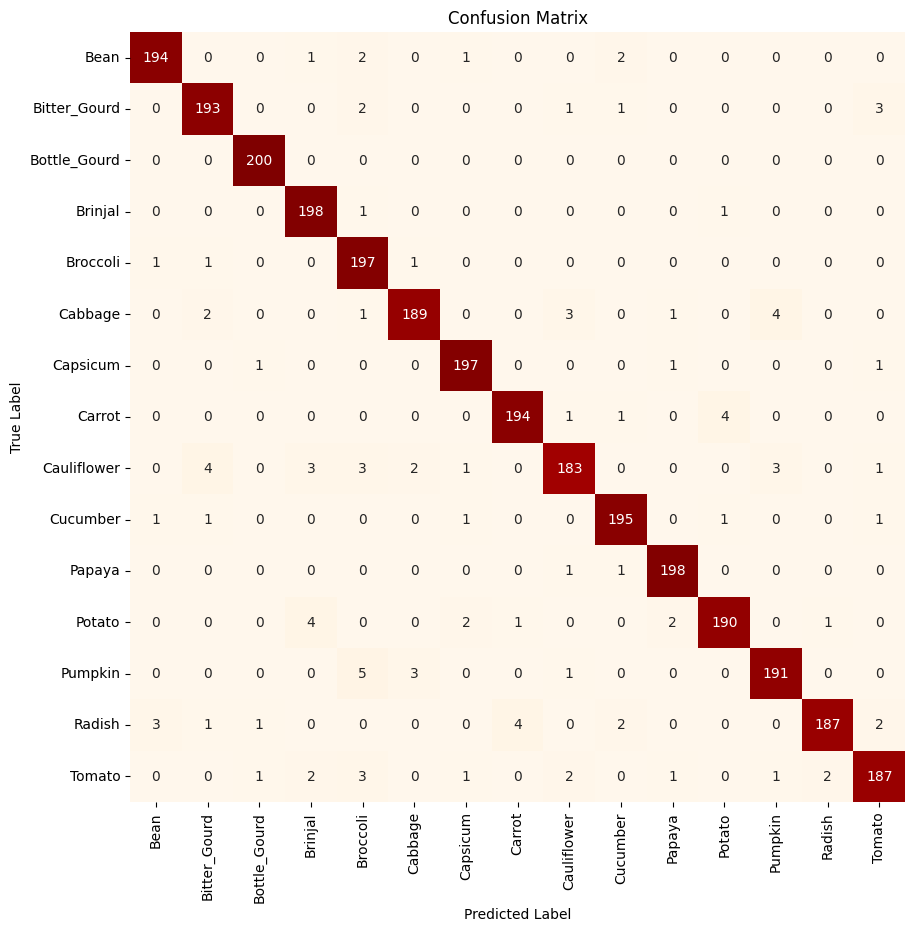

In [192]:
# Confusion Matrix of Results for 31 x 31 px

# Creating a figure for the plot
plt.figure(1, figsize=(10, 10))

# Setting the title for the confusion matrix
plt.title("Confusion Matrix")

# Calculating the confusion matrix using TensorFlow
conf_matrix = tf.math.confusion_matrix(
    np.argmax(y_test_31, axis=1),  # True labels
    np.argmax(y_pred_31, axis=1),  # Predicted labels
    num_classes=NUM_CLASS,      # Number of classes
    dtype=tf.dtypes.int32       # Data type of the matrix
)

# Plotting the confusion matrix using seaborn heatmap
sns.heatmap(conf_matrix, annot=True, fmt="", cbar=False, cmap="OrRd", yticklabels=class_labels.values(), xticklabels=class_labels.values())

# Setting the labels for the y-axis and x-axis
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

# Displaying the plot
plt.show()

**IMAGE SIZE : 128 X 128 PX**

The classification model achieves a remarkable overall accuracy of 99%, signifying excellent performance across all classes within a balanced test set comprising 3000 samples, with 200 instances per class.

**Key Points:**

- **Precision**: The model's precision is outstanding, with nearly all classes achieving above 99%. Notably, `Bottle Gourd` achieves a perfect precision of 100%.

- **Recall**: All classes show high recall rates, with `Bottle Gourd` again at 100%. The lowest recall rates are for `Broccoli` and `Cabbage`, at 98%, which are still notably high.

- **F1-Score**: The F1-scores are uniformly high across all classes, reflecting a strong balance between precision and recall, with scores at or above 99%.

- **Class Balance**: The dataset is well-balanced, with each class represented equally in the test set, facilitating a fair evaluation across all categories.

- **Averages**: The macro and weighted average F1-scores are at an impressive 99%, indicating consistent model performance across all classes.

**Observations:**

- `Bottle Gourd` stands out as the best-performing class, with the highest scores in both precision and recall metrics.

- While the overall model performance is exemplary, there is room for incremental improvement in classes such as `Broccoli`, `Cabbage` and `Radish`, which have slightly lower recall.

- Opportunities for model refinement could include techniques such as data augmentation, hyperparameter optimization, or collecting more diverse data samples, especially for classes that show marginally lower performance.

Overall, the model demonstrates a robust capability to accurately classify various vegetable classes within a balanced dataset.

In [184]:
# Evaluate the VGG128 model on the test dataset and calculate its performance metrics
vgg128.evaluate(X_test_128, y_test_128)

# Generate class predictions for the test dataset using the VGG128 model
y_pred_128 = vgg128.predict(X_test_128)

# Create a classification report to assess the model's performance
report128 = classification_report(
    np.argmax(y_test_128, axis=1), np.argmax(y_pred_128, axis=1), target_names=class_labels.values()
)

# Print the classification report to analyze and display the model's performance
print(report128)

94/94 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

        Bean       0.99      0.99      0.99       200
Bitter_Gourd       0.99      0.99      0.99       200
Bottle_Gourd       1.00      1.00      1.00       200
     Brinjal       0.99      0.99      0.99       200
    Broccoli       1.00      0.98      0.99       200
     Cabbage       1.00      0.98      0.99       200
    Capsicum       1.00      0.99      1.00       200
      Carrot       0.99      1.00      1.00       200
 Cauliflower       0.99      0.99      0.99       200
    Cucumber       1.00      0.99      1.00       200
      Papaya       1.00      1.00      1.00       200
      Potato       1.00      0.99      0.99       200
     Pumpkin       0.98      0.99      0.99       200
      Radish       0.99      0.98      0.99       200
      Tomato       0.99      1.00      0.99       200

    accuracy                           0.99      3000
   macro avg       0.99    

**PLOTTING AND ANALYZING THE CONFUSION MATRIX FOR 128 X 128 PX IMAGES**

- **High Accuracy**: The model shows high accuracy in classifying most vegetables. Notably, `Bottle_Gourd` is classified with 100% accuracy.

- **Misclassifications**:
  - Classes like `Broccoli` and `Potato` have slightly higher misclassification rates, indicating areas where the model is less confident.
  - `Broccoli` has been misclassified as `Bean` and `Cauliflower` which may suggest similarity in features used by the model for these classes.

- **Error Patterns**:
  - `Potato` has been occasionally confused with `Tomato` and `Radish`, which could be due to shared characteristics between these classes that the model finds difficult to distinguish.

- **Areas for Improvement**:
  - Refinement could be focused on `Broccoli` and `Potato` by enhancing the model's feature extraction capabilities or by providing more diverse training samples for these classes.

- **Overall Performance**: The model achieves a commendable performance for the majority of the classes, with room for incremental improvements in classifying `Broccoli` and `Potato` more accurately.

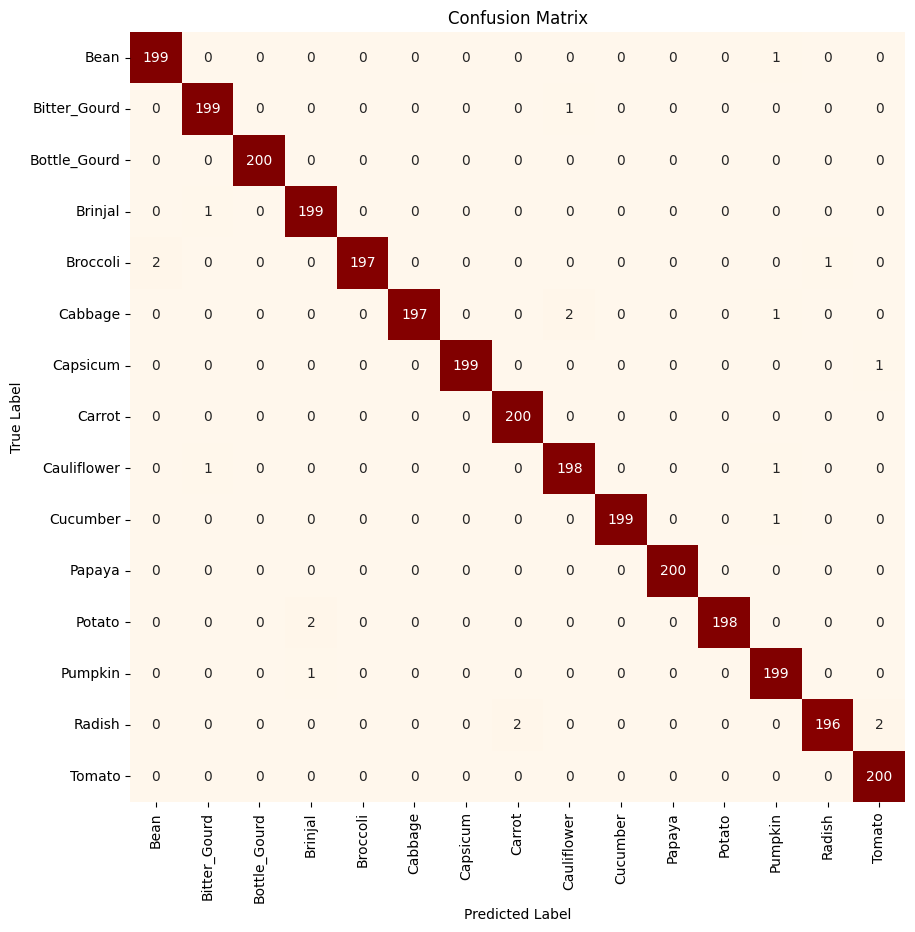

In [193]:
# Confusion Matrix of Results for 128 x 128 px

# Creating a figure for the plot
plt.figure(1, figsize=(10, 10))

# Setting the title for the confusion matrix
plt.title("Confusion Matrix")

# Calculating the confusion matrix using TensorFlow
conf_matrix = tf.math.confusion_matrix(
    np.argmax(y_test_128, axis=1),  # True labels
    np.argmax(y_pred_128, axis=1),  # Predicted labels
    num_classes=NUM_CLASS,      # Number of classes
    dtype=tf.dtypes.int32       # Data type of the matrix
)

# Plotting the confusion matrix using seaborn heatmap
sns.heatmap(conf_matrix, annot=True, fmt="", cbar=False, cmap="OrRd", yticklabels=class_labels.values(), xticklabels=class_labels.values())

# Setting the labels for the y-axis and x-axis
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

# Displaying the plot
plt.show()

### ERROR ANALYSIS AND UNDERSTANDING

- To analayse the mistakes made by the model, we will perform error analysis and find out the misclassified images on the test dataset.

**IMAGE SIZE : 31 X 31 PX**

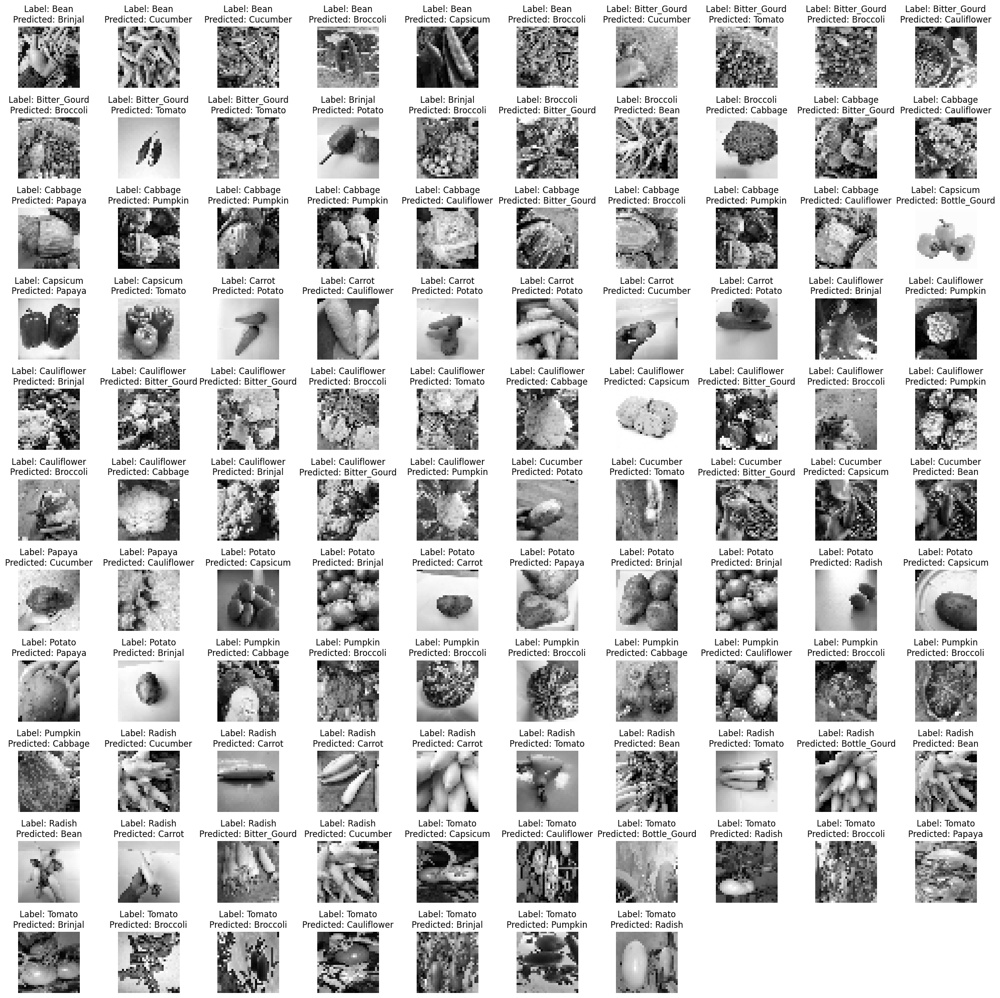

In [191]:
# Identify the misclassified samples
wrong = np.argmax(y_test_31, axis=1) != np.argmax(y_pred_31, axis=1)
X_test_wrong_31 = X_test_31[wrong]
y_test_wrong_31 = np.argmax(y_test_31[wrong], axis=1)
y_pred_wrong_31 = np.argmax(y_pred_31[wrong], axis=1)

# Determine the number of misclassified samples
num_misclassified = len(X_test_wrong_31)

# Set up the subplot dimensions
n_rows = int(np.ceil(np.sqrt(num_misclassified)))
n_cols = n_rows if num_misclassified > n_rows * (n_rows - 1) else n_rows - 1

# Set up the plot
fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, 20))
ax = ax.ravel()  # Flatten the array for easy iteration

# Iterate over each subplot
for i in range(n_rows * n_cols):
    if i < num_misclassified:
        # Display the image
        ax[i].imshow(X_test_wrong_31[i], cmap='gray')  # Use cmap='gray' for grayscale images
        ax[i].axis("off")  # Hide axes

        # Get predictions and actual labels
        pred_label = class_labels[y_pred_wrong_31[i]]
        actual_label = class_labels[y_test_wrong_31[i]]

        # Add title with actual and predicted labels
        ax[i].set_title(f"Label: {actual_label}\nPredicted: {pred_label}")
    else:
        ax[i].axis("off")  # Turn off axis for empty subplots

plt.tight_layout()
plt.show()

**IMAGE SIZE : 128 X 128 PX**

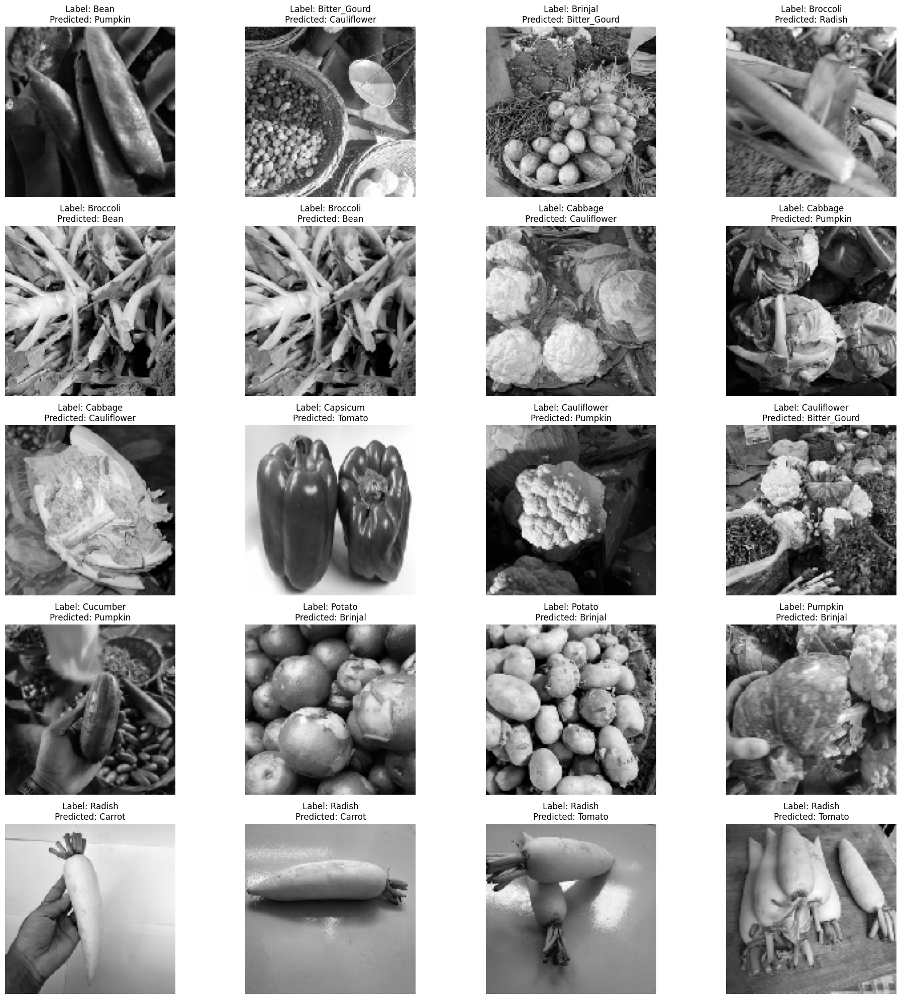

In [187]:
# Identify the misclassified samples
wrong = np.argmax(y_test_128, axis=1) != np.argmax(y_pred_128, axis=1)
X_test_wrong_128 = X_test_128[wrong]
y_test_wrong_128 = np.argmax(y_test_128[wrong], axis=1)
y_pred_wrong_128 = np.argmax(y_pred_128[wrong], axis=1)

# Determine the number of misclassified samples
num_misclassified = len(X_test_wrong_128)

# Set up the subplot dimensions
n_rows = int(np.ceil(np.sqrt(num_misclassified)))
n_cols = n_rows if num_misclassified > n_rows * (n_rows - 1) else n_rows - 1

# Set up the plot
fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, 20))
ax = ax.ravel()  # Flatten the array for easy iteration

# Iterate over each subplot
for i in range(n_rows * n_cols):
    if i < num_misclassified:
        # Display the image
        ax[i].imshow(X_test_wrong_128[i], cmap='gray')  # Use cmap='gray' for grayscale images
        ax[i].axis("off")  # Hide axes

        # Get predictions and actual labels
        pred_label = class_labels[y_pred_wrong_128[i]]
        actual_label = class_labels[y_test_wrong_128[i]]

        # Add title with actual and predicted labels
        ax[i].set_title(f"Label: {actual_label}\nPredicted: {pred_label}")
    else:
        ax[i].axis("off")  # Turn off axis for empty subplots

plt.tight_layout()
plt.show()

### INSIGHTS FROM ERROR ANALYSIS OF IMAGES FOR 31 PX AND 128 PX

**For 31 PX x 31 PX:**<br>
Based on the error analysis, our model for 31 x 31 px predicted 107 images incorrectly when using the test set (3000 images), which is about 3% of the test set. This shows our model performed really well at predicting most unseen data and managed to correctly classify 96% of them. Upon deeper analysis, it is understandable for the model to make errors on some of the images, such as misclassifying **cauliflower as cabbage** and **brinjal as broccoli** as these images could be mistaken due to the low pixel value, and the model may make a few errors. However, the model still managed to classify most of the vegetables correctly, indicating a high level of precision and accuracy.

**For 128 PX x 128 PX:**<br>
Based on the error analysis, our model for 128 x 128 px predicted 20 images incorrectly when using the test set (3000 images), which is about 0.6% of the test set. This shows our model for 128px images performed extremely well at predicting most unseen data and managed to correctly classify 99.4% of them. For the misclassifications, the model perhaps may not have generalized well enough to certain vegetable images at certain angles / lightings due to a limited training set available. However, the model managed to classify almost all vegetables correctly, indicating a high level of accuracy and precision.

### VISUALIZING THE MODEL LAYERS

- To visualize the final models for both input sizes, we will be using `keras.utils` to get an overview of the layers involved in the models.
- From the visualizations, we are able to understand the architecture of the model easily.

**IMAGE SIZE : 31 X 31 PX**

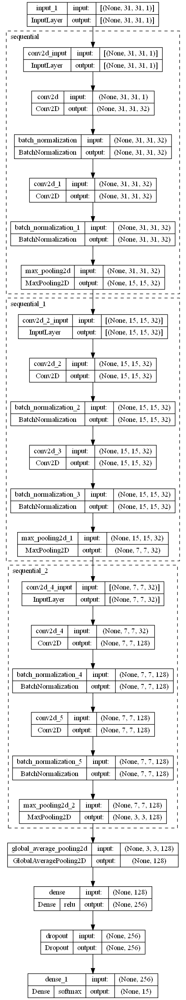

In [188]:
tf.keras.utils.plot_model(vgg31, show_shapes = True, expand_nested = True, show_layer_activations = True)

**IMAGE SIZE : 128 X 128 PX**

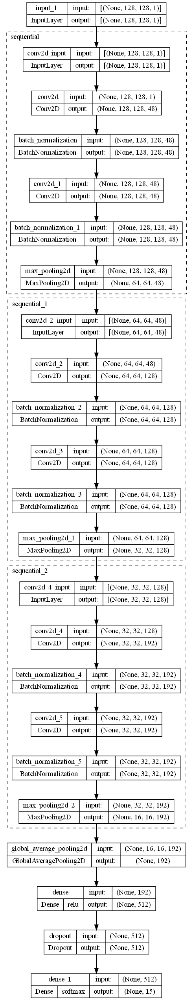

In [189]:
tf.keras.utils.plot_model(vgg128, show_shapes = True, expand_nested = True, show_layer_activations = True)

### SUMMARY OF CONVOLUTIONAL NEURAL NETWORK ANALYSIS ON VEGETABLE CLASSES

**Best Model For 31 x 31 px & 128 x 128 px : CustomVGG Model**

For this CNN analysis, I tested with custom-built models, and did extensive research on existing architectures, and proceeded to modify and adapt the layers for this dataset. Overall, I learnt how to create custom-built models, gained a deeper understanding on convolutional neural networks and how to perform image classification.

- **Dataset Overview:** The dataset comprised images for 15 classes of vegetables, with preprocessing steps like resampling, one-hot encoding and data augmentation.
<br>

- **Training Process:** Training involved SGD opimizer with a learning rate of 0.001, batch size of 32, and 50 epochs. Techniques like L2 Regularization, Early Stopping, and Dropout were employed to enhance model performance.
<br>

- **Comparative Analysis:** Compared to the other models tested, CustomVGG showed superior performance for both grayscaled image sizes tested.

For further refinement in future, I can further enhance the model's performance by testing with more architectures and implementing other hyperparameter tuning variables. However, judging from the current level of accuracy provided by the model, it can be concluded that the model has generalized well to unseen data and is able to predict new data to a high degree of correctness and precision.

**Final Results Obtained on Test Set :**

<table width="100%">
    <tr>
        <th>Model</th>
        <th>Image Size</th>
        <th>Test Accuracy</th>
    </tr>
    <tr>
        <td>CustomVGG Model</td>
        <td>31 x 31 x 1</td>
        <td>96 %</td>
    </tr>
    <tr>
        <td>CustomVGG Model</td>
        <td>128 x 128 x 1</td>
        <td>99 %</td>
    </tr>